In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score,f1_score,confusion_matrix,classification_report
from sklearn.ensemble import RandomForestClassifier
from xgboost import XGBClassifier
import shap

In [274]:
from xgboost import plot_importance


In [106]:
from sklearn.model_selection import cross_val_score


In [2]:
pd.options.display.max_columns=None
pd.options.display.max_info_columns=1000

In [3]:
accounts=pd.read_csv('Final_Datasets/train_accounts.csv')

C:\Users\Admin\AppData\Local\Temp\ipykernel_20652\695075401.py:1: DtypeWarning: Columns (55,56,57,58,59,60,61,62,63,65,66,67,68,69,71,72,73,74,75,77,78,79,80,81,82,85,86,87,88,90,91,93,97,99,100,101,102) have mixed types. Specify dtype option on import or set low_memory=False.
  accounts=pd.read_csv('Final_Datasets/train_accounts.csv')


#### Six-Sence Engagement Feature Construction

In [4]:
accounts['six_sence_engagement']=accounts['six_sence_unified_account_id'].apply(lambda x : 1 if pd.notnull(x) else 0)

#### Madison Logic engagement Score Derive

In [5]:
def get_madison_logic_engagement_score(row):
    result=(0.4*row['madison_logics_clicks_aggregated'])+(0.3*row['madison_logics_site_visits_aggregated'])+(0.2*row['madison_logics_exposure_time_minutes_aggregated'])+(0.1*row['madison_logics_click_through_rate_aggregated'])
    return result

In [6]:
accounts['madison_logic_engagement_score']=accounts.apply(get_madison_logic_engagement_score,axis=1)

## Campaign Memeber Recency Feature Construction

In [7]:
campaign_members=pd.read_csv('Datasets/ai_unique_campaign_members.csv')

C:\Users\Admin\AppData\Local\Temp\ipykernel_20652\2469615702.py:1: DtypeWarning: Columns (15) have mixed types. Specify dtype option on import or set low_memory=False.
  campaign_members=pd.read_csv('Datasets/ai_unique_campaign_members.csv')


In [10]:
campaign_members['unified_account_id'].nunique()

136898

In [8]:
campaign_members['member_first_associated_date']=pd.to_datetime(campaign_members['member_first_associated_date'])
campaign_members['member_status_update_date']=pd.to_datetime(campaign_members['member_status_update_date'])

In [9]:
x=campaign_members[['unified_account_id','member_status_update_date']]
x=x.sort_values(by=['unified_account_id','member_status_update_date'],ascending=True)
x.dropna(inplace=True)

In [10]:
x=x.drop_duplicates(subset=['unified_account_id'],keep='last')

In [11]:
x

,unified_account_id,member_status_update_date
161214,000010f1-92d6-4693-b7bf-e4cb19da59b0,2023-12-13
36603,00002255-814e-43df-8d43-3481f2f555c4,2023-10-18
184130,000053d2-545d-4cf8-b953-48a226a1c758,2023-11-29
384014,00010d66-3b03-466a-81d6-8f73773fa795,2023-02-27
341079,0001d6a4-e9ee-4661-9ddc-0eedce108f3d,2024-04-16
...,...,...
94846,fffc54b5-e5fa-42fe-a3ec-e6ea84a142ac,2024-02-14
34452,fffd04c4-9c82-49dd-878a-b462192c2c24,2023-04-25
373555,fffd9e9d-808e-4765-add8-143f4bffc57a,2024-08-12
285507,ffff8ed9-84aa-43a3-b947-b49512a1a985,2024-03-21


In [12]:
x.columns=['unified_account_id','date_since_last_campaign_targeted']

In [13]:
accounts=accounts.merge(x,on='unified_account_id',how='left')

In [14]:
from datetime import datetime, timedelta

In [15]:
today = datetime.today()
today

datetime.datetime(2025, 1, 5, 21, 5, 41, 519818)

In [16]:
accounts['days_since_last_campaign_targeted'] = (today - accounts['date_since_last_campaign_targeted']).dt.days

In [17]:
three_months_ago = today - timedelta(days=3*30)

In [18]:
three_months_ago

datetime.datetime(2024, 10, 7, 21, 5, 41, 519818)

In [19]:
six_months_ago = today - timedelta(days=6*30)
six_months_ago

datetime.datetime(2024, 7, 9, 21, 5, 41, 519818)

In [20]:
one_year_ago = today - timedelta(days=365)
one_year_ago

datetime.datetime(2024, 1, 6, 21, 5, 41, 519818)

In [21]:
three_months_campaign=campaign_members[campaign_members['member_status_update_date']>=three_months_ago]

In [22]:

six_months_campaign=campaign_members[campaign_members['member_status_update_date']>=six_months_ago]

In [23]:
one_year_campaign=campaign_members[campaign_members['member_status_update_date']>=one_year_ago]

In [24]:
past_three_months_campaign_targeted = (
    three_months_campaign
    .groupby('unified_account_id')['campaign_id']
    .nunique()
    .reset_index(name='past_three_months_campaign_targeted')
    .sort_values(by='past_three_months_campaign_targeted', ascending=False)
)
past_three_months_campaign_targeted

,unified_account_id,past_three_months_campaign_targeted
5512,516d98f1-2680-465a-aa6a-1097262375a2,19
16738,f81fdc26-af12-4210-ae60-aeb4f67ee828,17
11693,ad27cdd0-78ec-45d6-ba29-babf47c95184,16
12990,bfcd79f3-01e8-4698-8abe-6e6a7a5e744e,16
11516,aa9030b5-c8cc-4325-9c41-86bd8eb0d279,16
...,...,...
6714,62aa465b-5e76-4e0c-b405-3ce1d5781dac,1
6715,62b0810b-87b4-4052-b8c5-24adafc846f2,1
6717,62b8da00-de31-428b-8db0-4cf1615e26fa,1
6718,62b9988a-d1ef-42f9-8907-5781437b1e3e,1


In [25]:
past_six_months_campaign_targeted = (
    six_months_campaign
    .groupby('unified_account_id')['campaign_id']
    .nunique()
    .reset_index(name='past_six_months_campaign_targeted')
    .sort_values(by='past_six_months_campaign_targeted', ascending=False)
)
past_six_months_campaign_targeted

,unified_account_id,past_six_months_campaign_targeted
35890,d6da0091-8348-4464-b143-2d6d15648f2f,26
36607,db2bef27-5023-46eb-b6bd-46c38a72e7c7,25
41474,f81fdc26-af12-4210-ae60-aeb4f67ee828,24
28545,aa9030b5-c8cc-4325-9c41-86bd8eb0d279,24
13601,516d98f1-2680-465a-aa6a-1097262375a2,23
...,...,...
17419,67cefe32-7034-4e5d-8894-6ca874ff8f56,1
17418,67cef88f-8263-4224-b266-78f6b487ef3c,1
17417,67ced6f5-5d66-4e03-b3c8-e44a3d8b4a02,1
17415,67cde385-43bf-435d-9ea1-bb733413c145,1


In [26]:
past_one_year_campaign_targeted = (
    one_year_campaign
    .groupby('unified_account_id')['campaign_id']
    .nunique()
    .reset_index(name='past_one_year_campaign_targeted')
    .sort_values(by='past_one_year_campaign_targeted', ascending=False)
)
past_one_year_campaign_targeted

,unified_account_id,past_one_year_campaign_targeted
3733,0ea34596-caa2-48f9-ad75-a456f2a9c457,48
56780,db2bef27-5023-46eb-b6bd-46c38a72e7c7,47
64356,f81fdc26-af12-4210-ae60-aeb4f67ee828,43
55635,d6da0091-8348-4464-b143-2d6d15648f2f,41
11883,2e06a23f-b80c-498f-bcab-696c9bb2ea6c,39
...,...,...
39001,9654c8d8-3798-4026-adf8-d7c7af2bbc94,1
15202,3af990cc-0171-495f-ad7e-fb94d3c7faf5,1
15199,3af80c9c-7477-4d5f-a31b-a707c2daa3bb,1
39006,9659512e-4a79-4e32-8416-b808a8dea032,1


In [27]:
accounts=accounts.merge(past_three_months_campaign_targeted,on='unified_account_id',how='left')
accounts=accounts.merge(past_six_months_campaign_targeted,on='unified_account_id',how='left')
accounts=accounts.merge(past_one_year_campaign_targeted,on='unified_account_id',how='left')

In [28]:
accounts.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 147845 entries, 0 to 147844
Data columns (total 246 columns):
 #    Column                                                          Non-Null Count   Dtype         
---   ------                                                          --------------   -----         
 0    Unnamed: 0                                                      147845 non-null  int64         
 1    Unified_Account_Data                                            147845 non-null  object        
 2    unified_account_id                                              147845 non-null  object        
 3    name                                                            147843 non-null  object        
 4    domain                                                          147845 non-null  object        
 5    country                                                         125366 non-null  object        
 6    vbc_id                                                          20

In [29]:
final_accounts=accounts[['base_source','six_sence_engagement','madison_logic_engagement_score','Has Opportunity?','outreach_calls_total_calls',
                'outreach_calls_outbound_calls','outreach_calls_inbound_calls','outreach_calls_answered_calls',
                'outreach_calls_total_answered_duration','outreach_emails_frequency','outreach_emails_open_count',
                'outreach_emails_click_count','outreach_emails_open_rate','outreach_emails_click_rate','outreach_emails_average_time_required_to_reply',
                'cleaned_employees','cleaned_revenue','campaign_members_total_campaign_targated',
                'campaign_members_total_campaign_responded','campaign_members_total_leads','campaign_members_total_contacts',
                'campaign_members_campaign_type_Content','campaign_members_campaign_type_Digital','campaign_members_campaign_type_Event',
                'campaign_members_campaign_type_Email','campaign_members_campaign_type_Web (WEB)','campaign_members_campaign_type_Direct',
                'campaign_members_campaign_type_Self Sourced','campaign_members_campaign_type_Generic Non Lead Gen',
                'campaign_members_campaign_type_Others','days_since_last_campaign_targeted','past_three_months_campaign_targeted',
                'past_six_months_campaign_targeted','past_one_year_campaign_targeted']]

In [30]:
opp_accounts=final_accounts[final_accounts['Has Opportunity?']=='Yes']
tal_accounts=final_accounts[final_accounts['base_source']=='Target TAL Accounts']

#### Dropping Accounts Which Becomes Opportunity From TAL Account

In [31]:
tal_accounts=tal_accounts[tal_accounts['Has Opportunity?']=='No']

In [32]:
final_accounts=pd.concat([tal_accounts,opp_accounts])

In [33]:
### Shuffling Dataset Records
final_accounts = final_accounts.sample(frac=1, random_state=42)

In [34]:
final_accounts=final_accounts.drop(columns=['base_source'])

In [35]:
final_accounts.rename(columns={'Has Opportunity?':'converted'},inplace=True)

In [36]:
mapping_dict={'Yes':1,'No':0}

In [37]:
final_accounts['converted']=final_accounts['converted'].map(mapping_dict)

In [391]:
final_accounts.to_csv('Results/6_JAN_25/Datasets/binary_model_dataset.csv')

In [393]:
X_train.to_csv('Results/6_JAN_25/Datasets/multi_class_model_train_dataset.csv')

In [394]:
X_test.to_csv('Results/6_JAN_25/Datasets/binary_model_Xtest_dataset.csv')

In [397]:
y_train.to_csv('Results/6_JAN_25/Datasets/binary_model_y_train_dataset.csv')

In [398]:
y_test.to_csv('Results/6_JAN_25/Datasets/binary_model_y_test_dataset.csv')

In [402]:
import pickle

# Assuming `model` is your trained machine learning model
with open('Results/6_JAN_25/Models/multi_xg_boost_model.pkl', 'wb') as file:
    pickle.dump(multi_xg_model, file)

In [408]:
with open('Results/6_JAN_25/Models/multi_class_label_encoder.pkl', 'wb') as file:
    pickle.dump(label_encoder, file)

In [399]:
rf_model

RandomForestClassifier(bootstrap=False, class_weight='balanced', max_depth=30,
                       max_features='log2', min_samples_leaf=4,
                       min_samples_split=10, n_estimators=500)

### Filling NAN Values

In [38]:
for feature in final_accounts.select_dtypes(include=['int','float']).columns:
    final_accounts[feature].fillna(0,inplace=True)

In [39]:
final_accounts.to_csv('Final_Datasets/accounts_final_dataset_5_jan.csv')

In [40]:
X_train,X_test,y_train,y_test=train_test_split(final_accounts.drop(columns=['converted']),final_accounts.converted,test_size=0.2,random_state=42,stratify=final_accounts['converted'])

In [41]:
{n_estimators= 500,
min_samples_split= 10,
min_samples_leaf= 4,
max_features= log2,
max_depth= 30,
class_weight= balanced,
bootstrap= False}

SyntaxError: invalid syntax. Maybe you meant '==' or ':=' instead of '='? (1715434293.py, line 1)

In [42]:
rf_model=RandomForestClassifier(n_estimators= 500,
                                min_samples_split= 10,
                                min_samples_leaf= 4,
                                max_features= 'log2',
                                max_depth= 30,
                                class_weight= 'balanced',
                                bootstrap= False)

In [43]:
rf_model.fit(X_train,y_train)

RandomForestClassifier(bootstrap=False, class_weight='balanced', max_depth=30,
                       max_features='log2', min_samples_leaf=4,
                       min_samples_split=10, n_estimators=500)

In [44]:
y_pred=rf_model.predict(X_test)

In [45]:
accuracy_score(y_test,y_pred)

0.8902933460529454

In [46]:
f1_score(y_test,y_pred)

0.7581493165089379

In [47]:
confusion_matrix(y_test,y_pred)

array([[3012,  196],
       [ 264,  721]], dtype=int64)

In [48]:
print(classification_report(y_test,y_pred))

              precision    recall  f1-score   support

           0       0.92      0.94      0.93      3208
           1       0.79      0.73      0.76       985

    accuracy                           0.89      4193
   macro avg       0.85      0.84      0.84      4193
weighted avg       0.89      0.89      0.89      4193



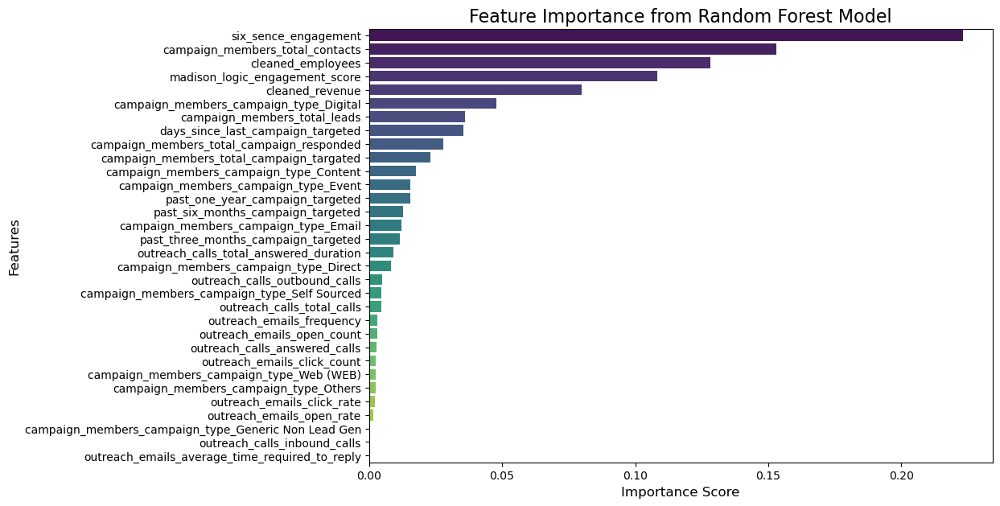

In [49]:
feature_importances = rf_model.feature_importances_
importance_df = pd.DataFrame({
    'Feature': X_train.columns,
    'Importance': feature_importances
}).sort_values(by='Importance', ascending=False)

# Plot the feature importances using Seaborn
plt.figure(figsize=(10, 7))
sns.barplot(data=importance_df, x='Importance', y='Feature', palette='viridis')
plt.title('Feature Importance from Random Forest Model', fontsize=16)
plt.xlabel('Importance Score', fontsize=12)
plt.ylabel('Features', fontsize=12)
plt.show()

## Cross-Validation

In [63]:
from sklearn.model_selection import cross_val_score

In [64]:
scores = cross_val_score(rf_model, X_train, y_train, cv=5, scoring='f1')

# Output the cross-validation scores
print("Cross-Validation Scores:", scores)
print("Mean Accuracy:", scores.mean())

Cross-Validation Scores: [0.77506427 0.75442043 0.76478318 0.74233529 0.74360656]
Mean Accuracy: 0.7560419454512102


In [66]:
scores = cross_val_score(rf_model, X_train, y_train, cv=5, scoring='accuracy')

# Output the cross-validation scores
print("Cross-Validation Scores:", scores)
print("Mean Accuracy:", scores.mean())

Cross-Validation Scores: [0.89594514 0.88670244 0.89355993 0.88073942 0.88249329]
Mean Accuracy: 0.8878880437262726


## ROC-AUC Curve

In [70]:
from sklearn.metrics import roc_curve

In [68]:
y_prob=rf_model.predict_proba(X_test)[:,1]

In [71]:
fpr,tpr,thresholds=roc_curve(y_test,y_prob)

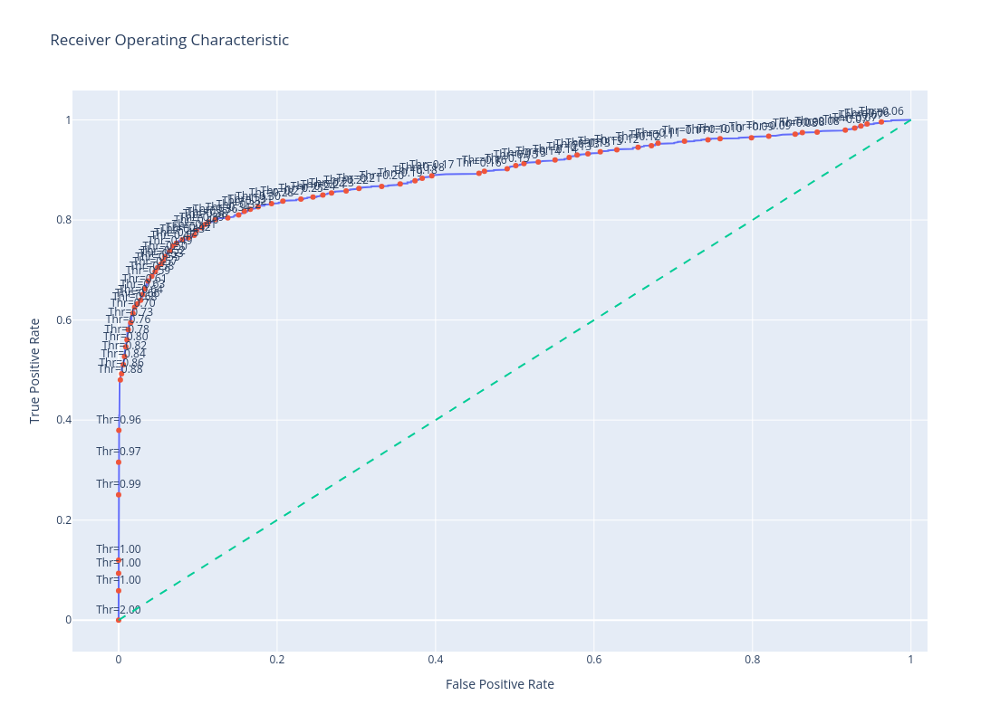

In [72]:
import plotly.graph_objects as go
import numpy as np


# Generate a trace for ROC curve
trace0 = go.Scatter(
    x=fpr,
    y=tpr,
    mode='lines',
    name='ROC curve'
)

# Only label every nth point to avoid cluttering
n = 10  
indices = np.arange(len(thresholds)) % n == 0  # Choose indices where index mod n is 0

trace1 = go.Scatter(
    x=fpr[indices], 
    y=tpr[indices], 
    mode='markers+text', 
    name='Threshold points', 
    text=[f"Thr={thr:.2f}" for thr in thresholds[indices]], 
    textposition='top center'
)


# Diagonal line
trace2 = go.Scatter(
    x=[0, 1], 
    y=[0, 1], 
    mode='lines', 
    name='Random (Area = 0.5)', 
    line=dict(dash='dash')
)

data = [trace0, trace1, trace2]

# Define layout with square aspect ratio
layout = go.Layout(
    title='Receiver Operating Characteristic',
    xaxis=dict(title='False Positive Rate'),
    yaxis=dict(title='True Positive Rate'),
    autosize=False,
    width=800,
    height=800,
    showlegend=False
)

# Define figure and add data
fig = go.Figure(data=data, layout=layout)

# Show figure
fig.show()


In [73]:
# Assume that fpr, tpr, thresholds have already been calculated
optimal_idx = np.argmax(tpr - fpr)
optimal_threshold = thresholds[optimal_idx]
print("Optimal threshold is:", optimal_threshold)

Optimal threshold is: 0.37254683741863187


In [74]:
y_pred_optimal = (y_prob >= optimal_threshold).astype(int)

print("Confusion Matrix at Optimal Threshold:")
print(confusion_matrix(y_test, y_pred_optimal))
print("\nClassification Report:")
print(classification_report(y_test, y_pred_optimal))

Confusion Matrix at Optimal Threshold:
[[2850  358]
 [ 202  783]]

Classification Report:
              precision    recall  f1-score   support

           0       0.93      0.89      0.91      3208
           1       0.69      0.79      0.74       985

    accuracy                           0.87      4193
   macro avg       0.81      0.84      0.82      4193
weighted avg       0.88      0.87      0.87      4193



In [75]:
accuracy_score(y_test, y_pred_optimal)

0.8664440734557596

## Precision-Recall Curve

In [78]:
from sklearn.metrics import precision_recall_curve, auc

precision, recall, thresholds = precision_recall_curve(y_test, y_prob)

pr_auc = auc(recall, precision)

f1_scores = 2 * (precision * recall) / (precision + recall)


Optimal Threshold: 0.49551348832645253
Optimal F1 Score: 0.7597061909758657


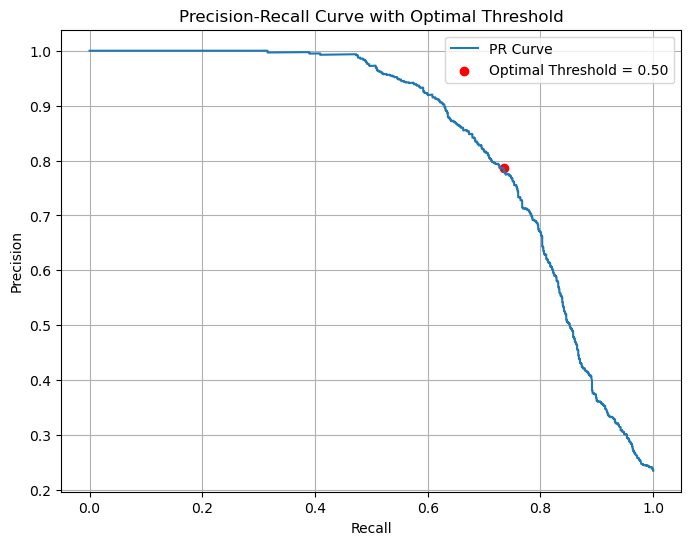

In [79]:
# Find the threshold that gives the highest F1 score
optimal_idx = np.argmax(f1_scores)
optimal_threshold = thresholds[optimal_idx]

# Output the optimal threshold and corresponding F1 score
print(f"Optimal Threshold: {optimal_threshold}")
print(f"Optimal F1 Score: {f1_scores[optimal_idx]}")

# Plot the Precision-Recall curve
plt.figure(figsize=(8, 6))
plt.plot(recall, precision, label='PR Curve')
plt.scatter(recall[optimal_idx], precision[optimal_idx], marker='o', color='r', label=f'Optimal Threshold = {optimal_threshold:.2f}')
plt.xlabel('Recall')
plt.ylabel('Precision')
plt.title('Precision-Recall Curve with Optimal Threshold')
plt.legend()
plt.grid(True)
plt.show()

## Model Interpretation

In [185]:

rf_model_explainer=shap.Explainer(rf_model,X_test,model_output="probability")

In [186]:
X_test_res=X_test.head(300)

In [187]:
X_test_res

,six_sence_engagement,madison_logic_engagement_score,outreach_calls_total_calls,outreach_calls_outbound_calls,outreach_calls_inbound_calls,outreach_calls_answered_calls,outreach_calls_total_answered_duration,outreach_emails_frequency,outreach_emails_open_count,outreach_emails_click_count,outreach_emails_open_rate,outreach_emails_click_rate,outreach_emails_average_time_required_to_reply,cleaned_employees,cleaned_revenue,campaign_members_total_campaign_targated,campaign_members_total_campaign_responded,campaign_members_total_leads,campaign_members_total_contacts,campaign_members_campaign_type_Content,campaign_members_campaign_type_Digital,campaign_members_campaign_type_Event,campaign_members_campaign_type_Email,campaign_members_campaign_type_Web (WEB),campaign_members_campaign_type_Direct,campaign_members_campaign_type_Self Sourced,campaign_members_campaign_type_Generic Non Lead Gen,campaign_members_campaign_type_Others,days_since_last_campaign_targeted,past_three_months_campaign_targeted,past_six_months_campaign_targeted,past_one_year_campaign_targeted
112513,0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000e+00,1.0,1.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,571.0,0.0,0.0,0.0
87703,1,122.723314,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,7500.0,1.000000e+09,3.0,1.0,24.0,0.0,1.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,99.0,0.0,1.0,2.0
57871,0,6.902000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,79.0,3.000000e+07,1.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,576.0,0.0,0.0,0.0
137733,0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,200.0,1.156818e+06,4.0,2.0,5.0,0.0,1.0,0.0,2.0,1.0,0.0,0.0,0.0,0.0,0.0,116.0,0.0,1.0,1.0
103823,1,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,450.0,3.000000e+08,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
59701,0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000e+00,1.0,1.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,48.0,1.0,1.0,1.0
49328,1,63.300000,1.0,1.0,0.0,1.0,2.0,0.0,0.0,0.0,0.0,0.0,0.0,10.0,3.000000e+08,3.0,0.0,4.0,0.0,1.0,0.0,0.0,2.0,0.0,0.0,0.0,0.0,0.0,111.0,0.0,1.0,1.0
64230,1,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,250.0,1.156818e+05,1.0,0.0,2.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,575.0,0.0,0.0,0.0
33303,1,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,125.0,9.400000e+06,1.0,0.0,3.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,575.0,0.0,0.0,0.0


In [214]:
rf_model_shap_values = rf_model_explainer(X_test)

100%|===================| 8383/8386 [88:43<00:01]        

In [80]:
# explainer=shap.Explainer(rf_model,X_test)

In [81]:
# shap_values = explainer(X_test)

100%|===================| 8384/8386 [42:09<00:00]        

In [ ]:
X_test.columns

In [189]:
rf_model_shap_values.shape

(300, 32, 2)

In [215]:
rf_model_shap_values_class_1 = rf_model_shap_values[..., 1]

In [86]:
shap.initjs()

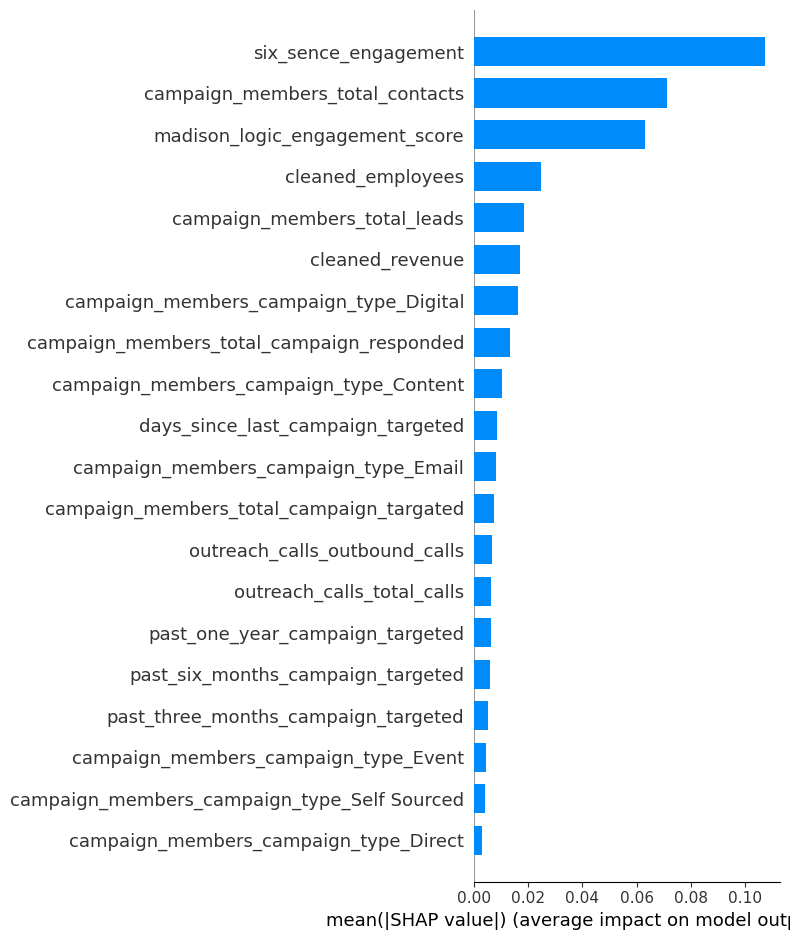

In [216]:
shap.summary_plot(rf_model_shap_values_class_1, X_test, plot_type="bar")


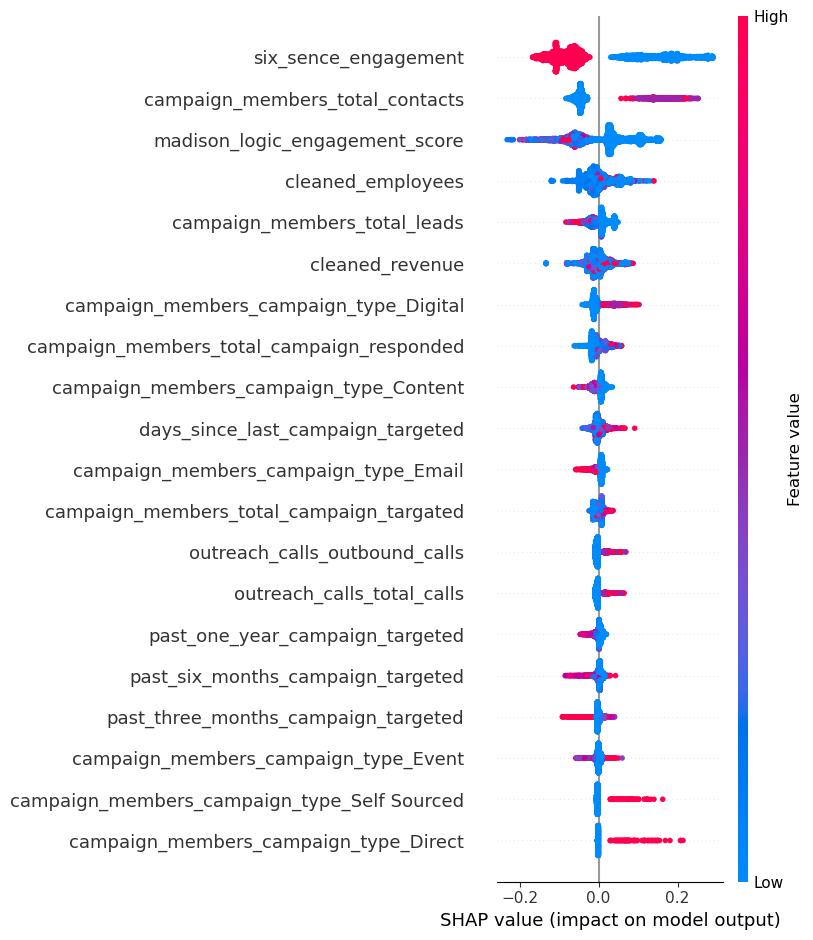

In [217]:
shap.summary_plot(rf_model_shap_values_class_1,X_test,feature_names=X_test.columns)
#shap.summary_plot(rf_model_shap_values_class_1, X_test_res)

In [416]:
temp

,index,six_sence_engagement,madison_logic_engagement_score,outreach_calls_total_calls,outreach_calls_outbound_calls,outreach_calls_inbound_calls,outreach_calls_answered_calls,outreach_calls_total_answered_duration,outreach_emails_frequency,outreach_emails_open_count,outreach_emails_click_count,outreach_emails_open_rate,outreach_emails_click_rate,outreach_emails_average_time_required_to_reply,cleaned_employees,cleaned_revenue,campaign_members_total_campaign_targated,campaign_members_total_campaign_responded,campaign_members_total_leads,campaign_members_total_contacts,campaign_members_campaign_type_Content,campaign_members_campaign_type_Digital,campaign_members_campaign_type_Event,campaign_members_campaign_type_Email,campaign_members_campaign_type_Web (WEB),campaign_members_campaign_type_Direct,campaign_members_campaign_type_Self Sourced,campaign_members_campaign_type_Generic Non Lead Gen,campaign_members_campaign_type_Others,days_since_last_campaign_targeted,past_three_months_campaign_targeted,past_six_months_campaign_targeted,past_one_year_campaign_targeted,converted
0,112513,0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000e+00,1.0,1.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,571.0,0.0,0.0,0.0,1
1,87703,1,122.723314,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,7500.0,1.000000e+09,3.0,1.0,24.0,0.0,1.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,99.0,0.0,1.0,2.0,0
2,57871,0,6.902000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,79.0,3.000000e+07,1.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,576.0,0.0,0.0,0.0,0
3,137733,0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,200.0,1.156818e+06,4.0,2.0,5.0,0.0,1.0,0.0,2.0,1.0,0.0,0.0,0.0,0.0,0.0,116.0,0.0,1.0,1.0,0
4,103823,1,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,450.0,3.000000e+08,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4188,124895,1,67.390000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,175.0,2.152911e+07,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0
4189,118137,1,21.342000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,350.0,3.000000e+07,8.0,7.0,3.0,0.0,3.0,1.0,0.0,3.0,1.0,0.0,0.0,0.0,0.0,39.0,1.0,4.0,4.0,0
4190,79293,0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,16.0,5.500001e+06,1.0,1.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,270.0,0.0,0.0,1.0,1
4191,48928,1,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,350.0,0.000000e+00,3.0,2.0,2.0,0.0,2.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,40.0,1.0,2.0,3.0,0


In [218]:
print(rf_model.predict_proba(X_test.iloc[0].values.reshape(1, -1)))
shap.force_plot(rf_model_explainer.expected_value[1], rf_model_shap_values_class_1[0].values, X_test.iloc[0],link='identity')

C:\Users\Admin\anaconda3\Lib\site-packages\sklearn\base.py:439: UserWarning:

X does not have valid feature names, but RandomForestClassifier was fitted with feature names



[[3.17927970e-04 9.99682072e-01]]


In [ ]:
# pip install shap --upgrade

In [103]:
import shap
print(shap.__version__)


0.46.0


In [209]:
# shap.plots.force(
#     explainer.expected_value,  # Base value for the first output
#     shap_values_class_1[0].values,       # Shapley values for the first sample
#     X_test_res.iloc[0],               # Feature values for the first sample
#     link="identity"
# )

In [80]:
user_input=[list(X_test_res.iloc[10].values)]

In [81]:
rf_model.predict(user_input)

C:\Users\Admin\anaconda3\Lib\site-packages\sklearn\base.py:439: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


array([1], dtype=int64)

In [99]:
rf_model.predict_proba(X_test_res.iloc[0].values.reshape(1, -1))

C:\Users\Admin\anaconda3\Lib\site-packages\sklearn\base.py:439: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


array([[3.17927970e-04, 9.99682072e-01]])

In [96]:
explainer.expected_value[1]

0.34123973993189616

In [108]:
shap_values[0].values.shape

(32, 2)

In [109]:
 X_test.iloc[0].shape

(32,)

In [60]:
shap_values_class_1 = shap_values[..., 1]  # Shape: (4193, 32)


In [116]:
shap_values_class_1.shape

(4193, 32)

C:\Users\Admin\anaconda3\Lib\site-packages\sklearn\base.py:439: UserWarning:

X does not have valid feature names, but RandomForestClassifier was fitted with feature names



[[0.18123155 0.81876845]]


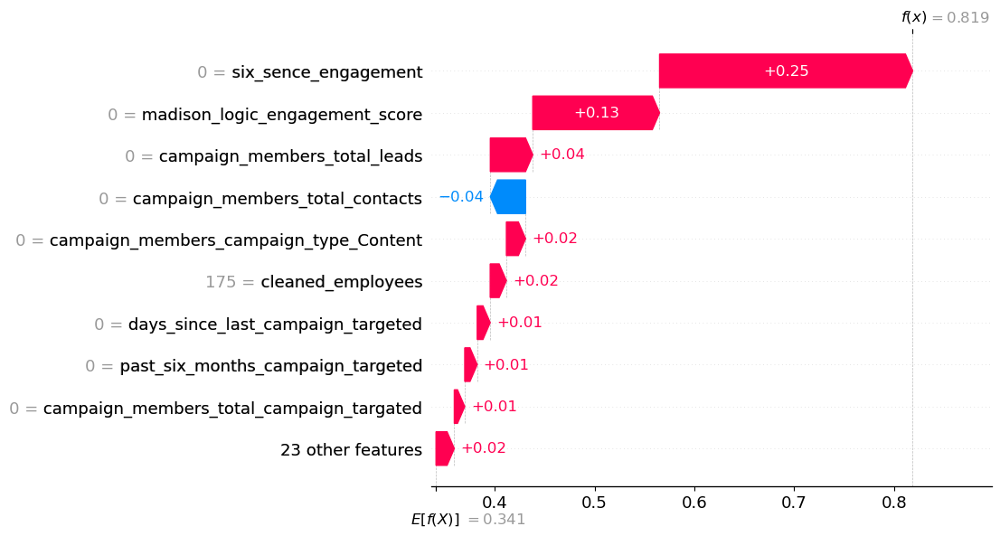

In [219]:
sample_index = 10
# shap_values_class_1 = shap_values[..., 1]  # Extract SHAP values for class 1
print(rf_model.predict_proba(X_test.iloc[sample_index].values.reshape(1, -1)))

single_shap_values = rf_model_shap_values_class_1[sample_index]

# Create the waterfall plot
shap.plots.waterfall(single_shap_values)

## XGBoost Model

In [100]:
xg_model=XGBClassifier(colsample_bytre= 0.7156555173390283, 
gamma= 0.005116928204378757,
learning_rate= 0.016647860663356464,
max_depth=7, 
n_estimators= 385,
scale_pos_weight= 2.1035505655787547,
subsample=0.771846614371039)

In [101]:
xg_model.fit(X_train,y_train)

C:\Users\Admin\anaconda3\Lib\site-packages\xgboost\core.py:158: UserWarning: [21:46:29] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0c55ff5f71b100e98-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "colsample_bytre" } are not used.

  warnings.warn(smsg, UserWarning)


XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytre=0.7156555173390283, colsample_bytree=None,
              device=None, early_stopping_rounds=None, enable_categorical=False,
              eval_metric=None, feature_types=None, gamma=0.005116928204378757,
              grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=0.016647860663356464,
              max_bin=None, max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=7, max_leaves=None,
              min_child_weight=None, missing=nan, monotone_constraints=None,
              multi_strategy=None, n_estimators=385, n_jobs=None,
              num_parallel_tree=None, ...)

In [102]:
y_pred=xg_model.predict(X_test)

In [103]:
accuracy_score(y_test,y_pred)

0.8945862151204388

In [104]:
f1_score(y_test,y_pred)

0.7631296891747051

In [149]:
confusion_matrix(y_test,y_pred)

array([[3039,  169],
       [ 273,  712]], dtype=int64)

In [151]:
print(classification_report(y_test,y_pred))

              precision    recall  f1-score   support

           0       0.92      0.95      0.93      3208
           1       0.81      0.72      0.76       985

    accuracy                           0.89      4193
   macro avg       0.86      0.84      0.85      4193
weighted avg       0.89      0.89      0.89      4193



In [107]:
scores = cross_val_score(xg_model, X_train, y_train, cv=5, scoring='accuracy')

# Output the cross-validation scores
print("Cross-Validation Scores:", scores)
print("Mean Accuracy:", scores.mean())

C:\Users\Admin\anaconda3\Lib\site-packages\xgboost\core.py:158: UserWarning: [21:47:28] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0c55ff5f71b100e98-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "colsample_bytre" } are not used.

  warnings.warn(smsg, UserWarning)
C:\Users\Admin\anaconda3\Lib\site-packages\xgboost\core.py:158: UserWarning: [21:47:38] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0c55ff5f71b100e98-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "colsample_bytre" } are not used.

  warnings.warn(smsg, UserWarning)
C:\Users\Admin\anaconda3\Lib\site-packages\xgboost\core.py:158: UserWarning: [21:47:43] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0c55ff5f71b100e98-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "colsample_bytre" } are not used.

  warnings.warn(smsg, UserWarning)
C:\Users\Admin\anaconda3\Lib\site-packages\xgboos

Cross-Validation Scores: [0.89683959 0.88908766 0.89505069 0.88372093 0.88607217]
Mean Accuracy: 0.8901542082393663


In [108]:
scores = cross_val_score(xg_model, X_train, y_train, cv=5, scoring='f1')

# Output the cross-validation scores
print("Cross-Validation Scores:", scores)
print("Mean Accuracy:", scores.mean())

C:\Users\Admin\anaconda3\Lib\site-packages\xgboost\core.py:158: UserWarning: [21:47:59] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0c55ff5f71b100e98-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "colsample_bytre" } are not used.

  warnings.warn(smsg, UserWarning)
C:\Users\Admin\anaconda3\Lib\site-packages\xgboost\core.py:158: UserWarning: [21:48:04] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0c55ff5f71b100e98-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "colsample_bytre" } are not used.

  warnings.warn(smsg, UserWarning)
C:\Users\Admin\anaconda3\Lib\site-packages\xgboost\core.py:158: UserWarning: [21:48:10] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0c55ff5f71b100e98-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "colsample_bytre" } are not used.

  warnings.warn(smsg, UserWarning)
C:\Users\Admin\anaconda3\Lib\site-packages\xgboos

Cross-Validation Scores: [0.77206851 0.75       0.76184032 0.74375821 0.74465241]
Mean Accuracy: 0.7544638910514088


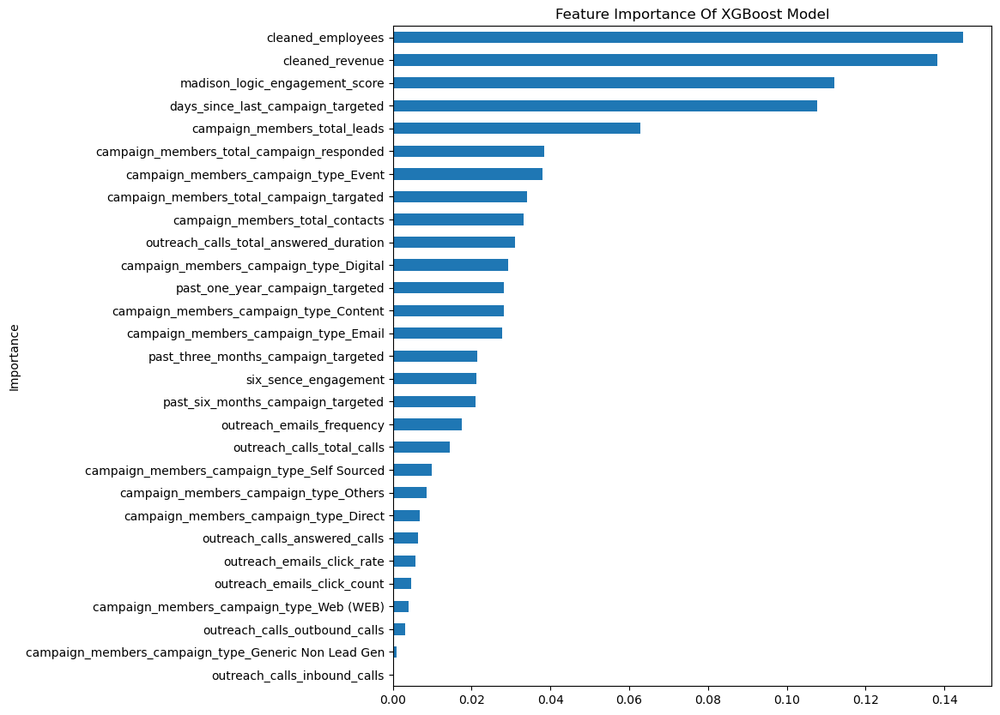

In [167]:
feature_importance = xg_model.get_booster().get_score(importance_type='weight')  # Use 'weight' or 'cover' as needed

# Normalize importance values
total_importance = sum(feature_importance.values())
normalized_importance = {k: v / total_importance for k, v in feature_importance.items()}

# Display normalized values
# print(normalized_importance)
importance_df = pd.DataFrame({
    'Feature': normalized_importance.keys(),
    'Importance': normalized_importance.values()
}).sort_values(by='Importance', ascending=True)

# plt.figure(figsize=(7,5))
importance_df.plot(kind='barh', x='Feature', y='Importance', legend=False,figsize=(9,10))
plt.title('Feature Importance Of XGBoost Model')
plt.ylabel('Importance')
plt.show()

In [155]:
from sklearn.metrics import roc_curve

In [152]:
y_prob=xg_model.predict_proba(X_test)[:,1]

In [156]:
fpr,tpr,thresholds=roc_curve(y_test,y_prob)

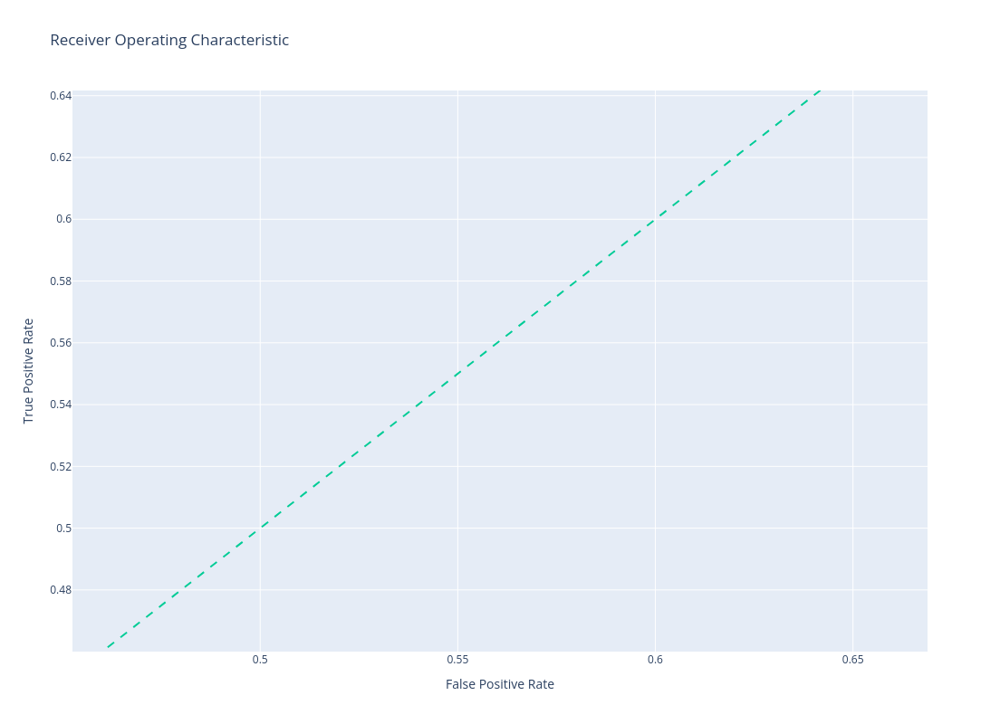

In [157]:
import plotly.graph_objects as go
import numpy as np


# Generate a trace for ROC curve
trace0 = go.Scatter(
    x=fpr,
    y=tpr,
    mode='lines',
    name='ROC curve'
)

# Only label every nth point to avoid cluttering
n = 10  
indices = np.arange(len(thresholds)) % n == 0  # Choose indices where index mod n is 0

trace1 = go.Scatter(
    x=fpr[indices], 
    y=tpr[indices], 
    mode='markers+text', 
    name='Threshold points', 
    text=[f"Thr={thr:.2f}" for thr in thresholds[indices]], 
    textposition='top center'
)


# Diagonal line
trace2 = go.Scatter(
    x=[0, 1], 
    y=[0, 1], 
    mode='lines', 
    name='Random (Area = 0.5)', 
    line=dict(dash='dash')
)

data = [trace0, trace1, trace2]

# Define layout with square aspect ratio
layout = go.Layout(
    title='Receiver Operating Characteristic',
    xaxis=dict(title='False Positive Rate'),
    yaxis=dict(title='True Positive Rate'),
    autosize=False,
    width=800,
    height=800,
    showlegend=False
)

# Define figure and add data
fig = go.Figure(data=data, layout=layout)

# Show figure
fig.show()


In [158]:
# Assume that fpr, tpr, thresholds have already been calculated
optimal_idx = np.argmax(tpr - fpr)
optimal_threshold = thresholds[optimal_idx]
print("Optimal threshold is:", optimal_threshold)

Optimal threshold is: 0.3352118


In [162]:
y_pred_optimal = (y_prob >= optimal_threshold).astype(int)

print("Confusion Matrix at Optimal Threshold:")
print(confusion_matrix(y_test, y_pred_optimal))
print("\nClassification Report:")
print(classification_report(y_test, y_pred_optimal))
print(f'\n Accuracy Score : {f1_score(y_test, y_pred_optimal)}')

Confusion Matrix at Optimal Threshold:
[[2904  304]
 [ 210  775]]

Classification Report:
              precision    recall  f1-score   support

           0       0.93      0.91      0.92      3208
           1       0.72      0.79      0.75       985

    accuracy                           0.88      4193
   macro avg       0.83      0.85      0.83      4193
weighted avg       0.88      0.88      0.88      4193


 Accuracy Score : 0.7509689922480619


In [164]:
from sklearn.metrics import precision_recall_curve, auc

precision, recall, thresholds = precision_recall_curve(y_test, y_prob)

pr_auc = auc(recall, precision)

f1_scores = 2 * (precision * recall) / (precision + recall)

Optimal Threshold: 0.4601394832134247
Optimal F1 Score: 0.7664041994750656


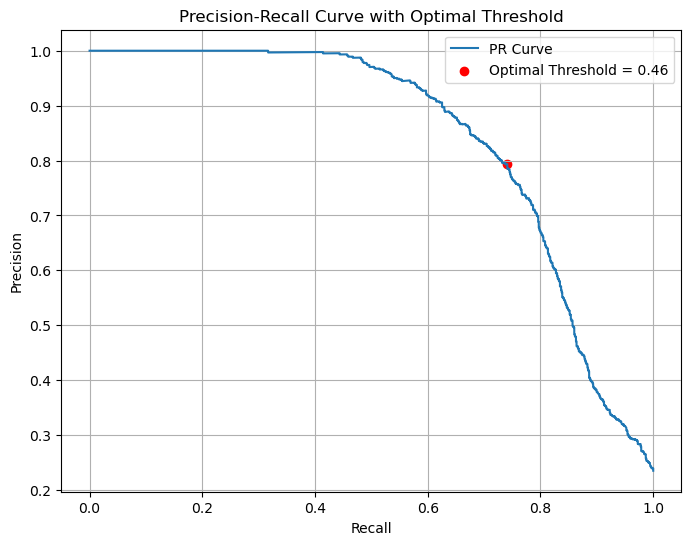

In [165]:
# Find the threshold that gives the highest F1 score
optimal_idx = np.argmax(f1_scores)
optimal_threshold = thresholds[optimal_idx]

# Output the optimal threshold and corresponding F1 score
print(f"Optimal Threshold: {optimal_threshold}")
print(f"Optimal F1 Score: {f1_scores[optimal_idx]}")

# Plot the Precision-Recall curve
plt.figure(figsize=(8, 6))
plt.plot(recall, precision, label='PR Curve')
plt.scatter(recall[optimal_idx], precision[optimal_idx], marker='o', color='r', label=f'Optimal Threshold = {optimal_threshold:.2f}')
plt.xlabel('Recall')
plt.ylabel('Precision')
plt.title('Precision-Recall Curve with Optimal Threshold')
plt.legend()
plt.grid(True)
plt.show()

## XGBoost Model Interpretation

In [109]:
explainer=shap.Explainer(xg_model,X_test,model_output="probability")

In [137]:
shap_values = explainer(X_test)

100%|===================| 4180/4193 [02:44<00:00]        

In [124]:
shap.plots.force(
    explainer.expected_value,  # Base value for the first output
    shap_values[10].values,       # Shapley values for the first sample
    X_test.iloc[10],               # Feature values for the first sample
    link="identity"
)

In [146]:
xg_model.predict_proba(X_test.iloc[19].values.reshape(1, -1))

array([[0.5398605 , 0.46013948]], dtype=float32)

In [128]:
X_test

,six_sence_engagement,madison_logic_engagement_score,outreach_calls_total_calls,outreach_calls_outbound_calls,outreach_calls_inbound_calls,outreach_calls_answered_calls,outreach_calls_total_answered_duration,outreach_emails_frequency,outreach_emails_open_count,outreach_emails_click_count,outreach_emails_open_rate,outreach_emails_click_rate,outreach_emails_average_time_required_to_reply,cleaned_employees,cleaned_revenue,campaign_members_total_campaign_targated,campaign_members_total_campaign_responded,campaign_members_total_leads,campaign_members_total_contacts,campaign_members_campaign_type_Content,campaign_members_campaign_type_Digital,campaign_members_campaign_type_Event,campaign_members_campaign_type_Email,campaign_members_campaign_type_Web (WEB),campaign_members_campaign_type_Direct,campaign_members_campaign_type_Self Sourced,campaign_members_campaign_type_Generic Non Lead Gen,campaign_members_campaign_type_Others,days_since_last_campaign_targeted,past_three_months_campaign_targeted,past_six_months_campaign_targeted,past_one_year_campaign_targeted
112513,0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000e+00,1.0,1.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,571.0,0.0,0.0,0.0
87703,1,122.723314,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,7500.0,1.000000e+09,3.0,1.0,24.0,0.0,1.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,99.0,0.0,1.0,2.0
57871,0,6.902000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,79.0,3.000000e+07,1.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,576.0,0.0,0.0,0.0
137733,0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,200.0,1.156818e+06,4.0,2.0,5.0,0.0,1.0,0.0,2.0,1.0,0.0,0.0,0.0,0.0,0.0,116.0,0.0,1.0,1.0
103823,1,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,450.0,3.000000e+08,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
124895,1,67.390000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,175.0,2.152911e+07,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
118137,1,21.342000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,350.0,3.000000e+07,8.0,7.0,3.0,0.0,3.0,1.0,0.0,3.0,1.0,0.0,0.0,0.0,0.0,39.0,1.0,4.0,4.0
79293,0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,16.0,5.500001e+06,1.0,1.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,270.0,0.0,0.0,1.0
48928,1,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,350.0,0.000000e+00,3.0,2.0,2.0,0.0,2.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,40.0,1.0,2.0,3.0


In [130]:
model_prediction = xg_model.predict([X_test.loc[137442].values])
print(xg_model.predict_proba([X_test.loc[137442].values]))
print(f"Prediction for the specific datapoint: {model_prediction}")
shap_values = explainer.shap_values(X_test.loc[137442].values)
shap.force_plot(explainer.expected_value, shap_values, X_test.loc[137442].values, X_test.columns)

[[0.79229546 0.20770451]]
Prediction for the specific datapoint: [0]


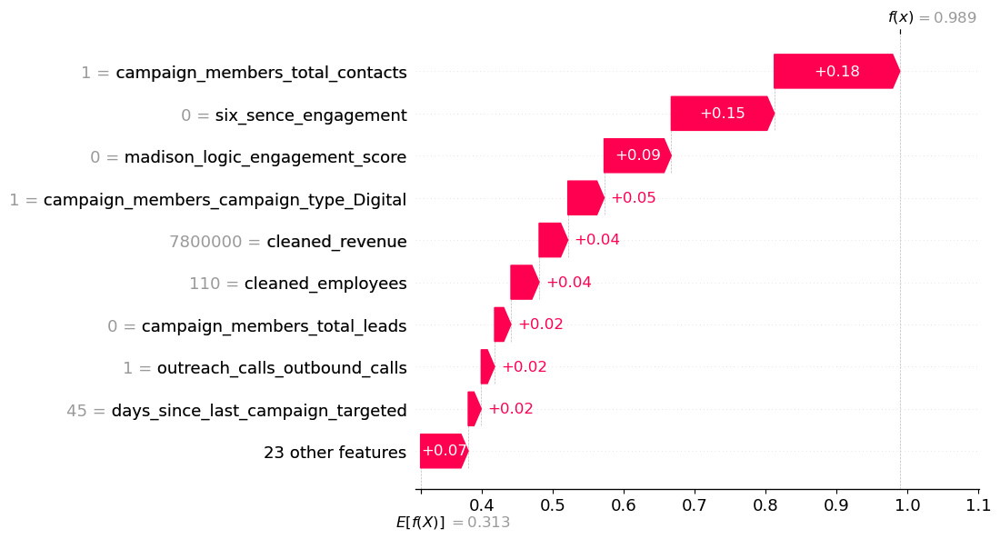

In [184]:
sample_index = 0
# shap_values_class_1 = shap_values[..., 1]  # Extract SHAP values for class 1

single_shap_values = shap_values[4171]

# Create the waterfall plot

shap.plots.waterfall(single_shap_values)

In [132]:
single_shap_values

-0.028375191673597366

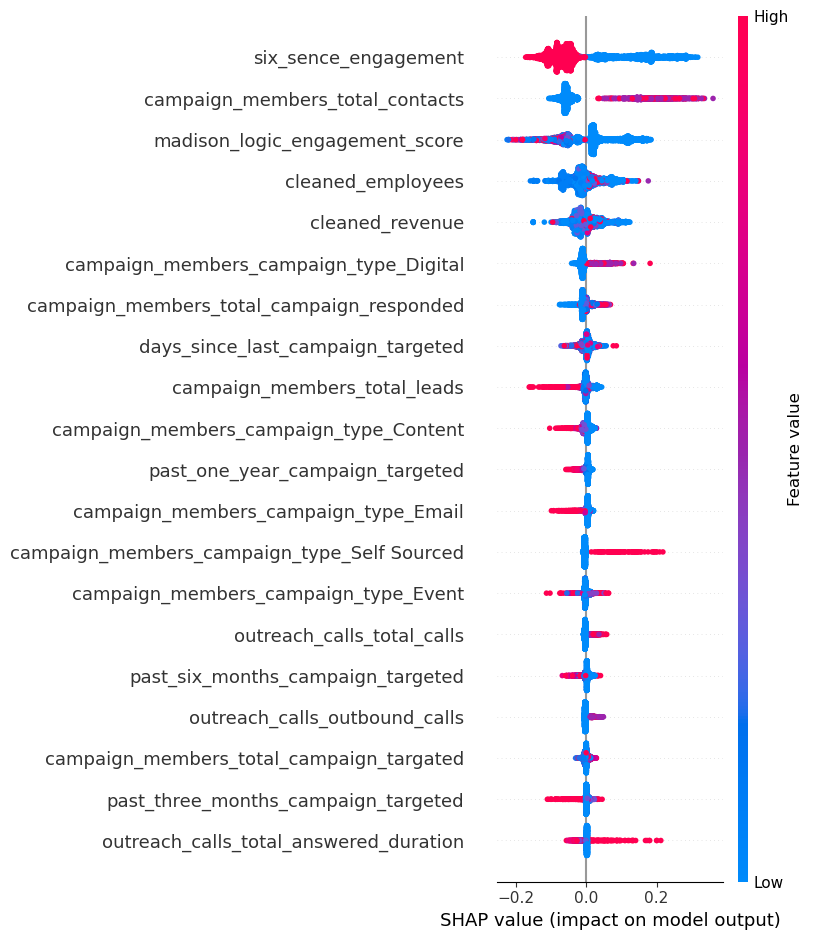

In [141]:
shap.summary_plot(shap_values, X_test)

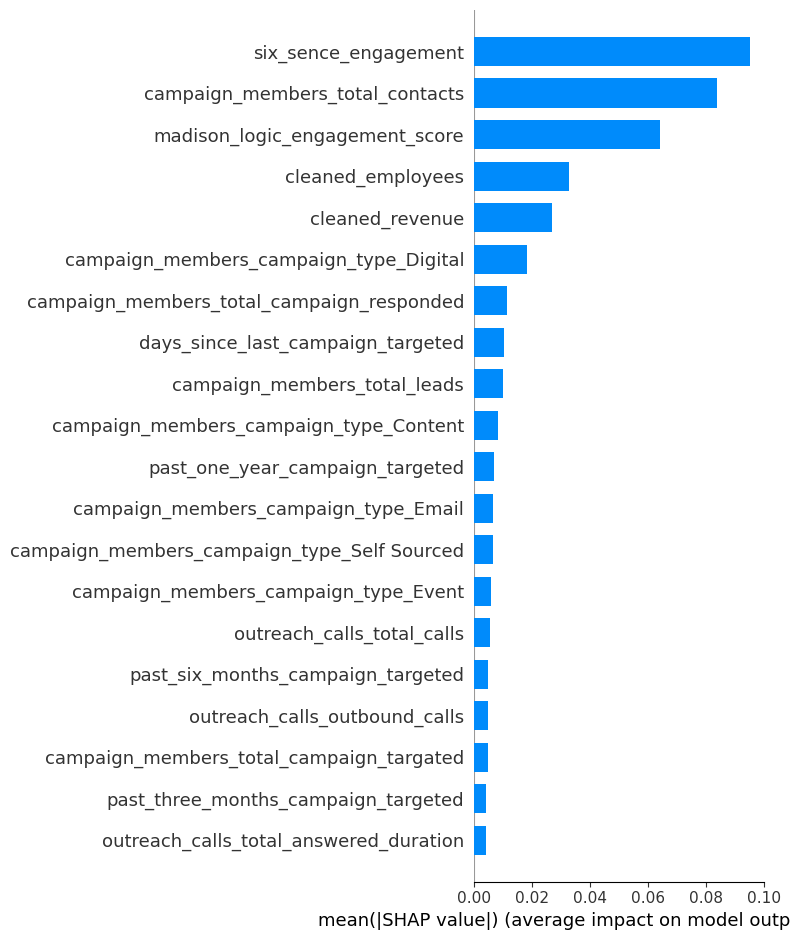

In [148]:
# Plot a bar plot for feature importance
shap.summary_plot(shap_values, X_test, plot_type="bar")


In [168]:
result_df=X_test.copy()

In [169]:
result_df['converted']=y_test

In [170]:
result_df

,six_sence_engagement,madison_logic_engagement_score,outreach_calls_total_calls,outreach_calls_outbound_calls,outreach_calls_inbound_calls,outreach_calls_answered_calls,outreach_calls_total_answered_duration,outreach_emails_frequency,outreach_emails_open_count,outreach_emails_click_count,outreach_emails_open_rate,outreach_emails_click_rate,outreach_emails_average_time_required_to_reply,cleaned_employees,cleaned_revenue,campaign_members_total_campaign_targated,campaign_members_total_campaign_responded,campaign_members_total_leads,campaign_members_total_contacts,campaign_members_campaign_type_Content,campaign_members_campaign_type_Digital,campaign_members_campaign_type_Event,campaign_members_campaign_type_Email,campaign_members_campaign_type_Web (WEB),campaign_members_campaign_type_Direct,campaign_members_campaign_type_Self Sourced,campaign_members_campaign_type_Generic Non Lead Gen,campaign_members_campaign_type_Others,days_since_last_campaign_targeted,past_three_months_campaign_targeted,past_six_months_campaign_targeted,past_one_year_campaign_targeted,converted
112513,0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000e+00,1.0,1.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,571.0,0.0,0.0,0.0,1
87703,1,122.723314,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,7500.0,1.000000e+09,3.0,1.0,24.0,0.0,1.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,99.0,0.0,1.0,2.0,0
57871,0,6.902000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,79.0,3.000000e+07,1.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,576.0,0.0,0.0,0.0,0
137733,0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,200.0,1.156818e+06,4.0,2.0,5.0,0.0,1.0,0.0,2.0,1.0,0.0,0.0,0.0,0.0,0.0,116.0,0.0,1.0,1.0,0
103823,1,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,450.0,3.000000e+08,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
124895,1,67.390000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,175.0,2.152911e+07,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0
118137,1,21.342000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,350.0,3.000000e+07,8.0,7.0,3.0,0.0,3.0,1.0,0.0,3.0,1.0,0.0,0.0,0.0,0.0,39.0,1.0,4.0,4.0,0
79293,0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,16.0,5.500001e+06,1.0,1.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,270.0,0.0,0.0,1.0,1
48928,1,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,350.0,0.000000e+00,3.0,2.0,2.0,0.0,2.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,40.0,1.0,2.0,3.0,0


In [182]:
temp=result_df.reset_index()

In [183]:
temp[temp['converted']==1]

,index,six_sence_engagement,madison_logic_engagement_score,outreach_calls_total_calls,outreach_calls_outbound_calls,outreach_calls_inbound_calls,outreach_calls_answered_calls,outreach_calls_total_answered_duration,outreach_emails_frequency,outreach_emails_open_count,outreach_emails_click_count,outreach_emails_open_rate,outreach_emails_click_rate,outreach_emails_average_time_required_to_reply,cleaned_employees,cleaned_revenue,campaign_members_total_campaign_targated,campaign_members_total_campaign_responded,campaign_members_total_leads,campaign_members_total_contacts,campaign_members_campaign_type_Content,campaign_members_campaign_type_Digital,campaign_members_campaign_type_Event,campaign_members_campaign_type_Email,campaign_members_campaign_type_Web (WEB),campaign_members_campaign_type_Direct,campaign_members_campaign_type_Self Sourced,campaign_members_campaign_type_Generic Non Lead Gen,campaign_members_campaign_type_Others,days_since_last_campaign_targeted,past_three_months_campaign_targeted,past_six_months_campaign_targeted,past_one_year_campaign_targeted,converted
0,112513,0,0.000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,571.0,0.0,0.0,0.0,1
7,79915,1,0.000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,344.0,75000000.0,1.0,1.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,475.0,0.0,0.0,0.0,1
10,54120,0,0.000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,175.0,31500000.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1
19,125548,1,0.000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,750.0,300000000.0,3.0,3.0,1.0,2.0,0.0,3.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,320.0,0.0,0.0,2.0,1
38,45362,0,0.000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,18.0,12000000.0,1.0,1.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,193.0,0.0,0.0,1.0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4171,92084,0,0.000,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,110.0,7800000.0,1.0,1.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,45.0,1.0,1.0,1.0,1
4179,2063,1,0.138,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,450.0,30000000.0,2.0,2.0,1.0,1.0,0.0,2.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,216.0,0.0,0.0,2.0,1
4180,134903,1,0.000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,175.0,81947803.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1
4183,105107,0,0.000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,100.0,6200000.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1


In [190]:
shap_values.shape

(4193, 32)

In [ ]:
# opportunities=pd.read_csv('Datasets/sfdc_opportunities.csv')

In [ ]:
# opportunities['created_date']=pd.to_datetime(opportunities['created_date'])

In [ ]:
# three_months_ago = today - timedelta(days=3*30)

In [ ]:
# six_months_ago = today - timedelta(days=6*30)

In [ ]:
# one_year_ago = today - timedelta(days=365)

In [ ]:
# recent_three_month_opportunities_df = opportunities[opportunities['created_date'] >= three_months_ago]


In [ ]:
# recent_six_month_opportunities_df = opportunities[opportunities['created_date'] >= six_months_ago]

In [ ]:
# recent_one_year_opportunities_df = opportunities[opportunities['created_date'] >= one_year_ago]


In [ ]:
# recent_three_month_opportunities_df=recent_three_month_opportunities_df.groupby(by='unified_account_id').size().reset_index(name='Past_three_month_opportunity_count').sort_values(by='Past_three_month_opportunity_count',ascending=False)

In [ ]:
# recent_six_month_opportunities_df=recent_six_month_opportunities_df.groupby(by='unified_account_id').size().reset_index(name='Past_six_month_opportunity_count').sort_values(by='Past_six_month_opportunity_count',ascending=False)

## Multi-Class Classification Model

In [220]:
opportunity_accounts=pd.read_csv('Final_Datasets/Accounts_Multiclass_dataset.csv')

In [221]:
opportunity_accounts.shape

(4382, 36)

In [223]:
opportunity_accounts.drop(columns=['Unnamed: 0'],inplace=True)

In [224]:
opportunity_accounts

,madison_logic_engagement_score,six_sence_engagement,outreach_calls_total_calls,outreach_calls_answered_calls,outreach_calls_inbound_calls,outreach_calls_outbound_calls,outreach_calls_total_answered_duration,outreach_emails_frequency,outreach_emails_open_count,outreach_emails_click_count,cleaned_employees,cleaned_revenue,campaign_members_total_campaign_targated,campaign_members_total_campaign_responded,campaign_members_total_leads,campaign_members_total_contacts,campaign_members_campaign_type_Content,campaign_members_campaign_type_Digital,campaign_members_campaign_type_Event,campaign_members_campaign_type_Email,campaign_members_campaign_type_Web (WEB),campaign_members_campaign_type_Direct,campaign_members_campaign_type_Self Sourced,campaign_members_campaign_type_Generic Non Lead Gen,campaign_members_campaign_type_Others,past_opportunity_count,Past_six_month_opportunity_count,Past_three_month_opportunity_count,Past_one_year_opportunity_count,days_since_last_opp_created,days_since_last_campaign_targeted,past_three_months_campaign_targeted,past_six_months_campaign_targeted,past_one_year_campaign_targeted,Furthest_Stage_Reached
0,0.0,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,5.0,2.400000e+06,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1,1.0,1.0,1.0,58.0,0.0,0.0,0.0,0.0,0-40
1,0.0,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,100.0,5.000010e+05,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2,2.0,2.0,2.0,71.0,0.0,0.0,0.0,0.0,40-60
2,0.0,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.000000e+00,1.0,1.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1,0.0,0.0,0.0,696.0,695.0,0.0,0.0,0.0,70-100
3,0.0,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,34.0,5.500001e+06,1.0,1.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1,0.0,0.0,0.0,580.0,579.0,0.0,0.0,0.0,70-100
4,0.0,1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,63.0,3.856061e+06,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1,0.0,0.0,1.0,205.0,0.0,0.0,0.0,0.0,0-40
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4377,0.0,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.000000e+00,2.0,2.0,0.0,1.0,0.0,2.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1,0.0,0.0,0.0,667.0,666.0,0.0,0.0,0.0,70-100
4378,0.0,0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,5.0,5.500001e+06,1.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1,0.0,0.0,0.0,568.0,567.0,0.0,0.0,0.0,40-60
4379,0.0,0,3.0,2.0,0.0,3.0,374.0,1.0,1.0,0.0,22000.0,5.000010e+05,13.0,9.0,20.0,3.0,2.0,1.0,8.0,2.0,0.0,0.0,0.0,0.0,0.0,1,0.0,0.0,0.0,497.0,36.0,1.0,2.0,7.0,0-40
4380,0.0,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1100.0,9.085092e+08,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1,0.0,0.0,1.0,219.0,0.0,0.0,0.0,0.0,40-60


In [225]:
opportunity_accounts.isnull().sum()

madison_logic_engagement_score                         0
six_sence_engagement                                   0
outreach_calls_total_calls                             0
outreach_calls_answered_calls                          0
outreach_calls_inbound_calls                           0
outreach_calls_outbound_calls                          0
outreach_calls_total_answered_duration                 0
outreach_emails_frequency                              0
outreach_emails_open_count                             0
outreach_emails_click_count                            0
cleaned_employees                                      0
cleaned_revenue                                        0
campaign_members_total_campaign_targated               0
campaign_members_total_campaign_responded              0
campaign_members_total_leads                           0
campaign_members_total_contacts                        0
campaign_members_campaign_type_Content                 0
campaign_members_campaign_type_

In [231]:
from sklearn.preprocessing import LabelEncoder

# Create a LabelEncoder object
label_encoder = LabelEncoder()

# Fit and transform the target variable
y_encoded = label_encoder.fit_transform(y_train_m)

In [226]:
X_train_m,X_test_m,y_train_m,y_test_m=train_test_split(opportunity_accounts.drop(columns=['Furthest_Stage_Reached']),opportunity_accounts.Furthest_Stage_Reached,test_size=0.2,random_state=42,stratify=opportunity_accounts['Furthest_Stage_Reached'])

In [227]:
multi_xg_model=XGBClassifier(subsample= 0.8,
                             scale_pos_weight= 2,
                             reg_lambda =5,
                             reg_alpha= 1,
                             n_estimators= 500,
                             min_child_weight= 3,
                             max_depth= 7,
                             learning_rate =0.05,
                             gamma= 1,
                             colsample_bytree= 0.6)

In [232]:
multi_xg_model.fit(X_train_m,y_encoded)

C:\Users\Admin\anaconda3\Lib\site-packages\xgboost\core.py:158: UserWarning:

[12:51:04] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0c55ff5f71b100e98-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "scale_pos_weight" } are not used.




XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=0.6, device=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=1, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=0.05, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=7, max_leaves=None,
              min_child_weight=3, missing=nan, monotone_constraints=None,
              multi_strategy=None, n_estimators=500, n_jobs=None,
              num_parallel_tree=None, objective='multi:softprob', ...)

In [235]:
y_pred=multi_xg_model.predict(X_test_m)

In [237]:
y_test_encoded = label_encoder.transform(y_test_m)

In [238]:
accuracy_score(y_test_encoded,y_pred)

0.6647662485746865

In [240]:
f1_score(y_test_encoded,y_pred,average='weighted')

0.65494043489949

In [241]:
print(classification_report(y_test_encoded,y_pred))

              precision    recall  f1-score   support

           0       0.69      0.83      0.75       407
           1       0.55      0.42      0.48       240
           2       0.71      0.63      0.67       230

    accuracy                           0.66       877
   macro avg       0.65      0.63      0.63       877
weighted avg       0.66      0.66      0.65       877



In [256]:
label_encoder.inverse_transform([0,1,2])

array(['0-40', '40-60', '70-100'], dtype=object)

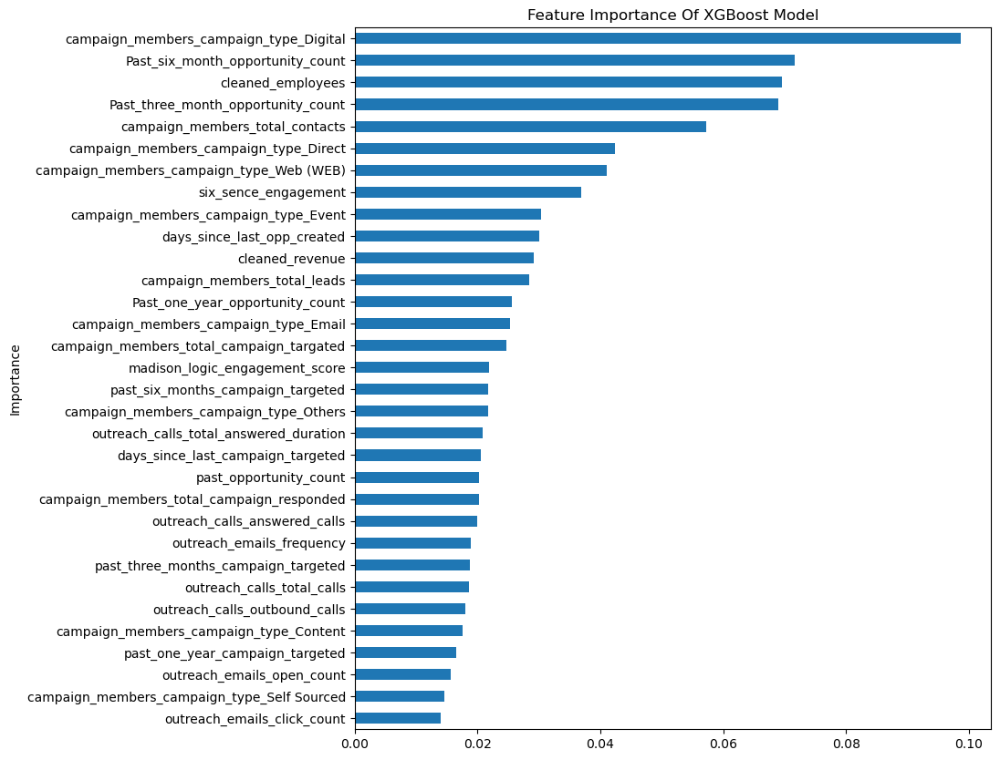

In [280]:
feature_importance = multi_xg_model.get_booster().get_score(importance_type='gain')  # Use 'weight' or 'cover' as needed

# Normalize importance values
total_importance = sum(feature_importance.values())
normalized_importance = {k: v / total_importance for k, v in feature_importance.items()}

# Display normalized values
# print(normalized_importance)
importance_df = pd.DataFrame({
    'Feature': normalized_importance.keys(),
    'Importance': normalized_importance.values()
}).sort_values(by='Importance', ascending=True)

# plt.figure(figsize=(7,5))
importance_df.plot(kind='barh', x='Feature', y='Importance', legend=False,figsize=(9,10))
plt.title('Feature Importance Of XGBoost Model')
plt.ylabel('Importance')
plt.show()

<Figure size 1000x800 with 0 Axes>

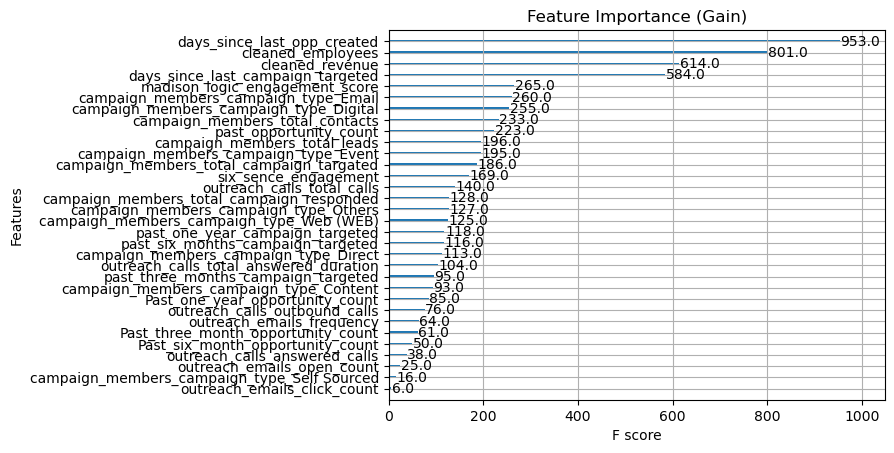

In [279]:
plt.figure(figsize=(10, 8))
plot_importance(multi_xg_model, importance_type="weight")  # Options: 'weight', 'gain', 'cover'
plt.title("Feature Importance (Gain)")
plt.show()

## Multi-Class Model Interpretation

In [259]:
multi_xg_model_explainer=shap.Explainer(multi_xg_model,X_train_m)

In [261]:
multi_xg_model_shap_values = multi_xg_model_explainer(X_test_m)


100%|===================| 2618/2631 [00:51<00:00]        

In [271]:
multi_xg_model_shap_values_class_70_100 = multi_xg_model_shap_values[..., 2]

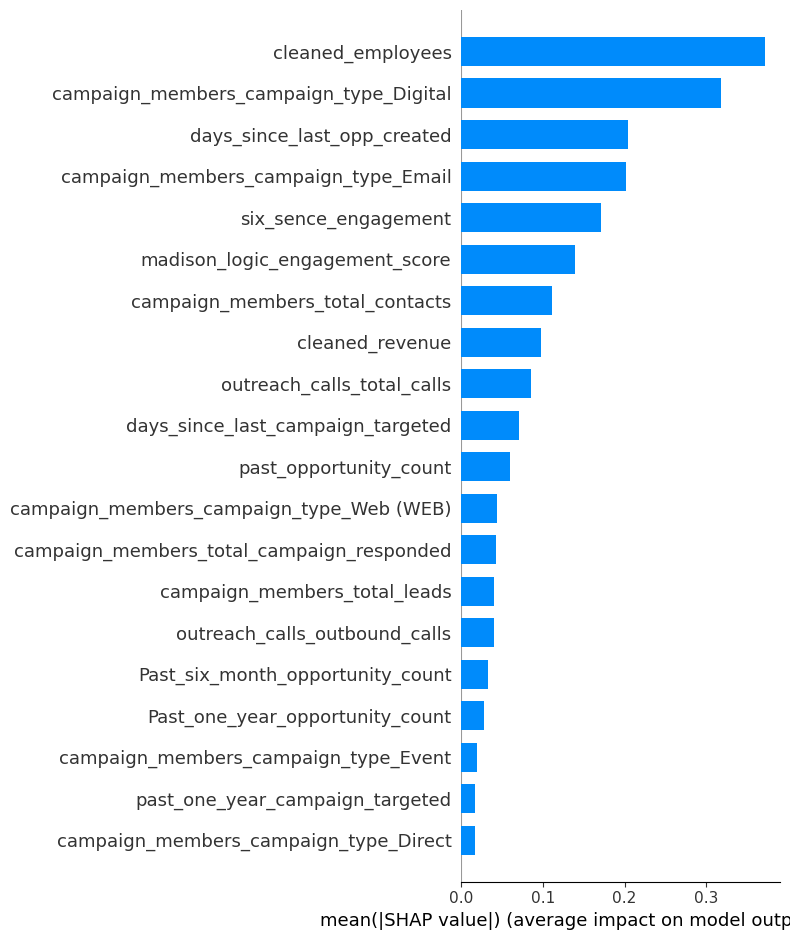

In [281]:
shap.summary_plot(multi_xg_model_shap_values_class_70_100, X_test_m, plot_type="bar")

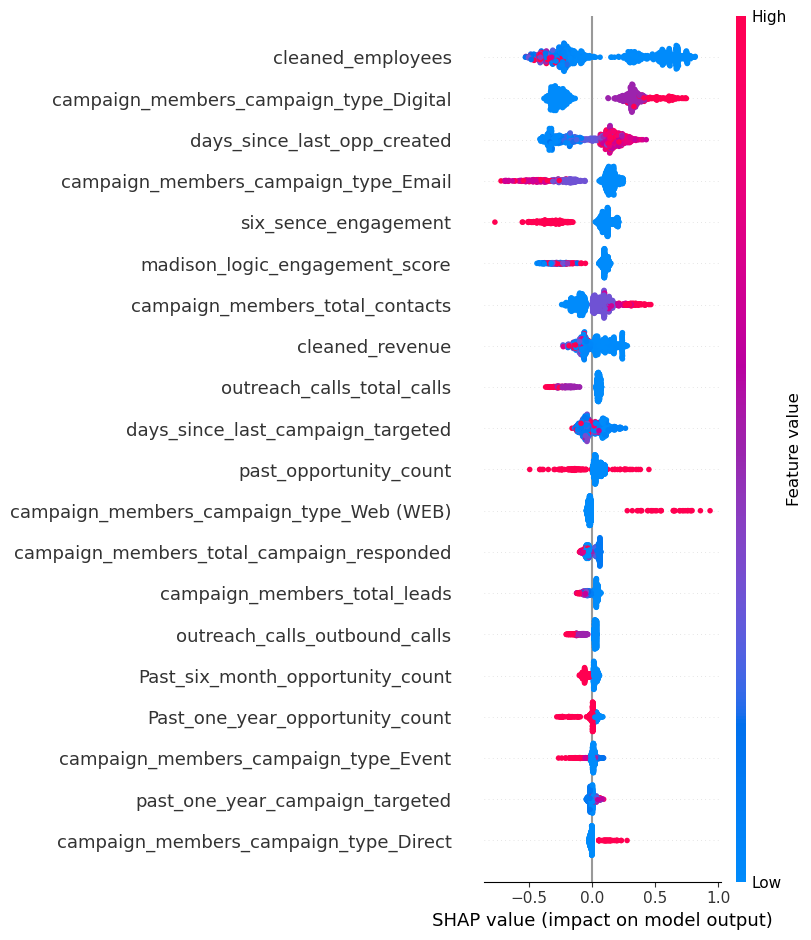

In [273]:
shap.summary_plot(multi_xg_model_shap_values_class_70_100.values, X_test_m,feature_names=X_test_m.colu)

In [334]:
datapoint=1712
model_prediction = multi_xg_model.predict([X_test_m.loc[datapoint].values])
print(multi_xg_model.predict_proba([X_test_m.loc[datapoint].values]))
print(f"Prediction for the specific datapoint: {model_prediction}")
single_shap_values = multi_xg_model_explainer.shap_values(X_test_m.loc[datapoint].values)
print(f'base value : {multi_xg_model_explainer.expected_value[model_prediction[0]]}')
shap.force_plot(multi_xg_model_explainer.expected_value[model_prediction[0]], single_shap_values[:,model_prediction[0]], X_test_m.loc[datapoint].values,link='logit')


[[0.04127551 0.0406821  0.9180424 ]]
Prediction for the specific datapoint: [2]
base value : -0.36848699900493015


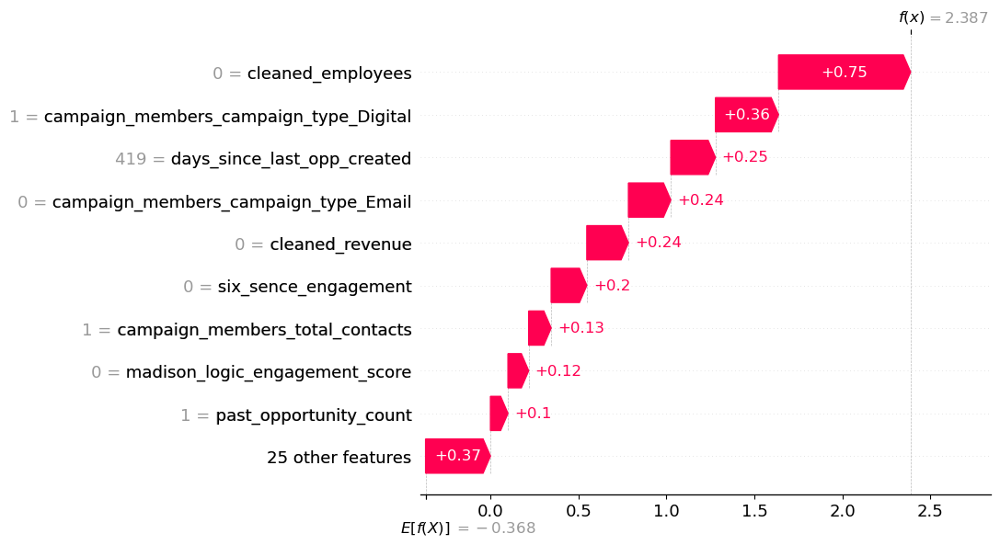

In [371]:
sample_index = 0
# shap_values_class_1 = shap_values[..., 1]  # Extract SHAP values for class 1
class_index=2

single_shap_values = multi_xg_model_shap_values[sample_index][:, class_index]

# Create the waterfall plot

shap.plots.waterfall(single_shap_values)

In [366]:
multi_xg_model.predict_proba([X_test_m.iloc[0].values])

array([[0.04127551, 0.0406821 , 0.9180424 ]], dtype=float32)

Predict Proba : [[0.04127551 0.0406821  0.9180424 ]]


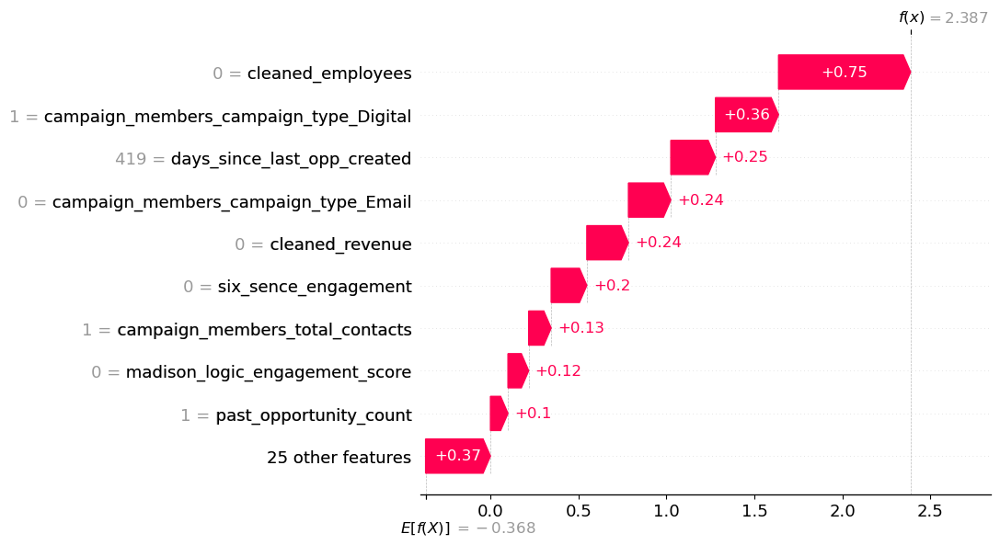

In [370]:
sample_index = 0
class_index = 2  # Class for which you want to plot the waterfall

# Get the predicted probability for the selected class
predicted_proba = multi_xg_model.predict_proba([X_test_m.iloc[sample_index].values])
print(f'Predict Proba : {predicted_proba}')
f_x_value = predicted_proba[0][class_index]  # Probability of the chosen class

# Extract SHAP values for the selected class
single_shap_values = multi_xg_model_shap_values[sample_index][:, class_index]

# Get the expected value (base value) for the selected class
expected_value_class = multi_xg_model_explainer.expected_value[class_index]

# Create the waterfall plot
shap.plots.waterfall(single_shap_values)

In [322]:
logits = multi_xg_model.predict([X_test_m.loc[1712].values],output_margin=True)
print("Logits for the specific datapoint:", logits)

Logits for the specific datapoint: [[-0.714647  -0.7291284  2.3873272]]


In [287]:
single_shap_values.shape

(34, 3)

In [301]:
single_shap_values.shape

(34, 3)

In [328]:
multi_xg_model_explainer.expected_value[0]

0.8243877717971511

In [299]:
# Predict the class for the specific datapoint
model_prediction = multi_xg_model.predict([X_test_m.loc[1712].values])
predicted_class = model_prediction[0]

# Print prediction probabilities
print(multi_xg_model.predict_proba([X_test_m.loc[1712].values]))

# Print prediction for the specific datapoint
print(f"Prediction for the specific datapoint: {model_prediction}")

# Get SHAP values for the specific class
# Ensure the input is a 2D array (even if it's a single instance)
single_shap_values = multi_xg_model_explainer.shap_values([X_test_m.loc[1712].values])

# Get the expected value for the predicted class
expected_value_for_predicted_class = multi_xg_model_explainer.expected_value[predicted_class]

# Plot the SHAP force plot for the predicted class
shap.force_plot(expected_value_for_predicted_class, single_shap_values[predicted_class], X_test_m.loc[1712].values)


[[0.04127551 0.0406821  0.9180424 ]]
Prediction for the specific datapoint: [2]


AttributeError: 'list' object has no attribute 'shape'

In [298]:
single_shap_values.shape

(34, 3)

In [296]:
predicted_class

2

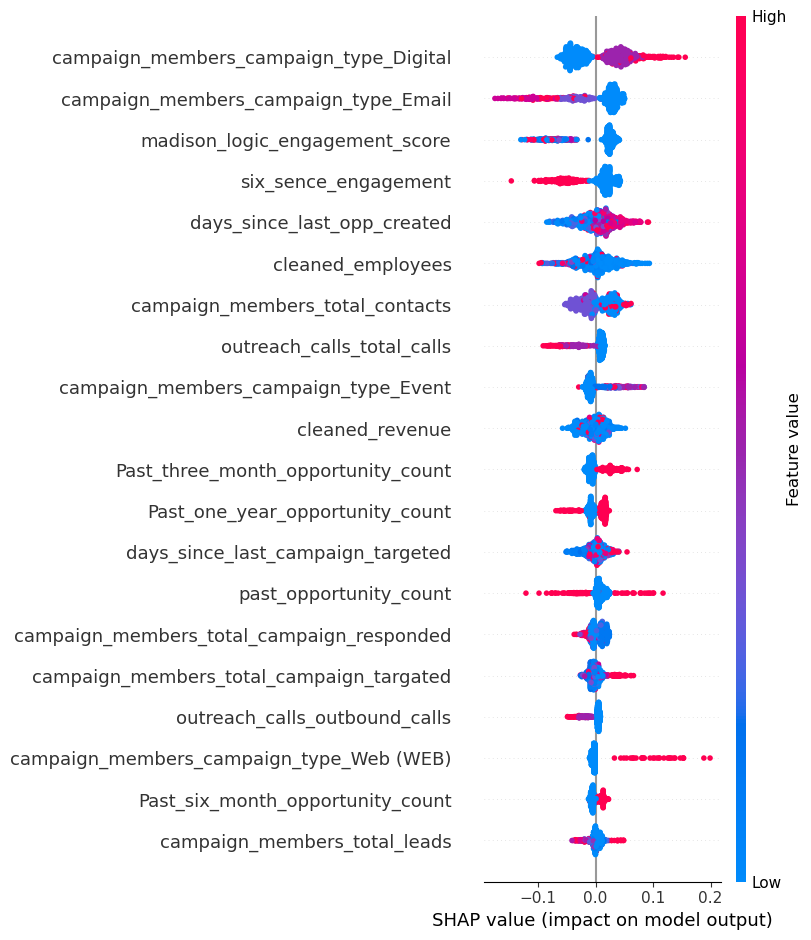

In [372]:
# Aggregate SHAP values across all classes (e.g., sum)
shap_values_all_classes = multi_xg_model_shap_values.values.mean(axis=2)

# Plot summary plot for all classes
shap.summary_plot(shap_values_all_classes, X_test_m, feature_names=X_test_m.columns)

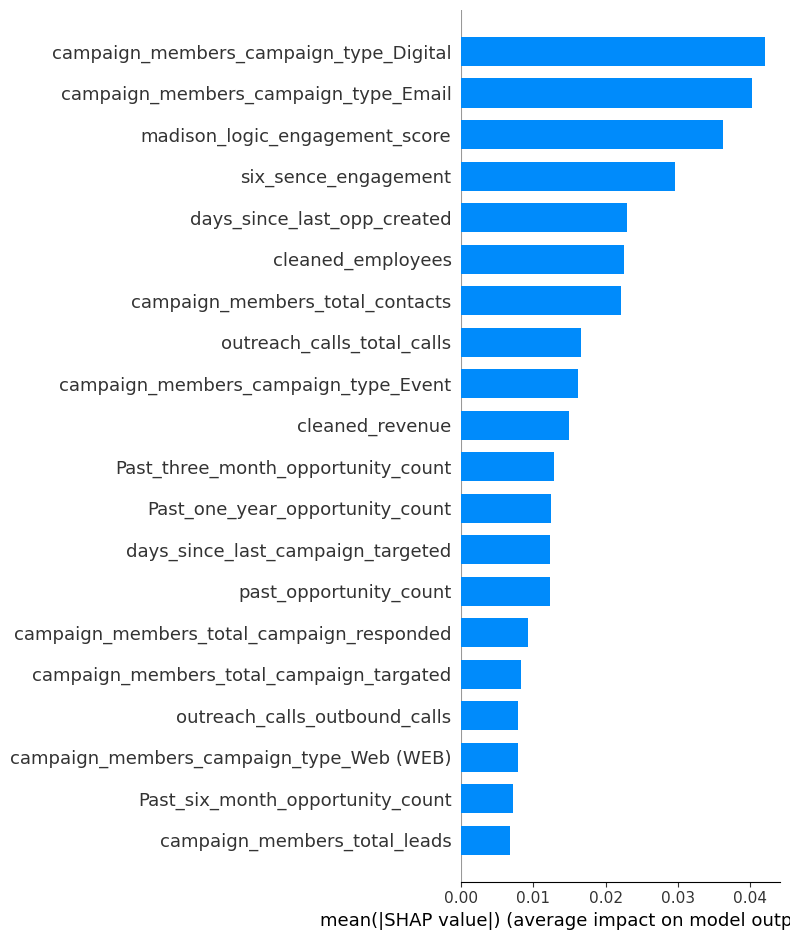

In [409]:
shap.summary_plot(shap_values_all_classes, X_test_m, plot_type="bar")

In [373]:
shap_values_all_classes.shape

(877, 34)

In [412]:
shap_values.shape

(4193, 32)

In [413]:
shap_values[0]

.values =
array([ 1.84136019e-01,  1.13248750e-01, -1.65412386e-03, -1.54334259e-03,
        0.00000000e+00,  2.36406763e-04,  1.37383930e-03, -2.67967010e-04,
        0.00000000e+00,  4.13720549e-04,  0.00000000e+00,  5.34607544e-04,
        0.00000000e+00,  8.06132334e-02,  2.58070518e-03, -1.52657111e-03,
        1.52292293e-02,  3.18694292e-02,  1.44740144e-01,  1.62630129e-02,
        5.51673033e-02,  7.82626044e-03,  6.76531140e-03, -1.55021145e-05,
       -2.33335514e-04, -1.17010033e-03,  0.00000000e+00, -4.95690264e-05,
        1.62042056e-02,  4.09925266e-03,  3.84150315e-03,  4.24544548e-03])

.base_values =
0.31324664786055517

.data =
array([  0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,
         0.,   0.,   0.,   0.,   1.,   1.,   0.,   1.,   0.,   1.,   0.,
         0.,   0.,   0.,   0.,   0.,   0., 571.,   0.,   0.,   0.])

In [374]:
X_test_m.shape

(877, 34)

In [379]:
sample_index = 0
# shap_values_class_1 = shap_values[..., 1]  # Extract SHAP values for class 1

single_shap_values = shap_values_all_classes[sample_index,:]

# Create the waterfall plot

shap.plots.waterfall(single_shap_values)

TypeError: The waterfall plot requires an `Explanation` object as the `shap_values` argument.

In [378]:
single_shap_values.shape

(34,)

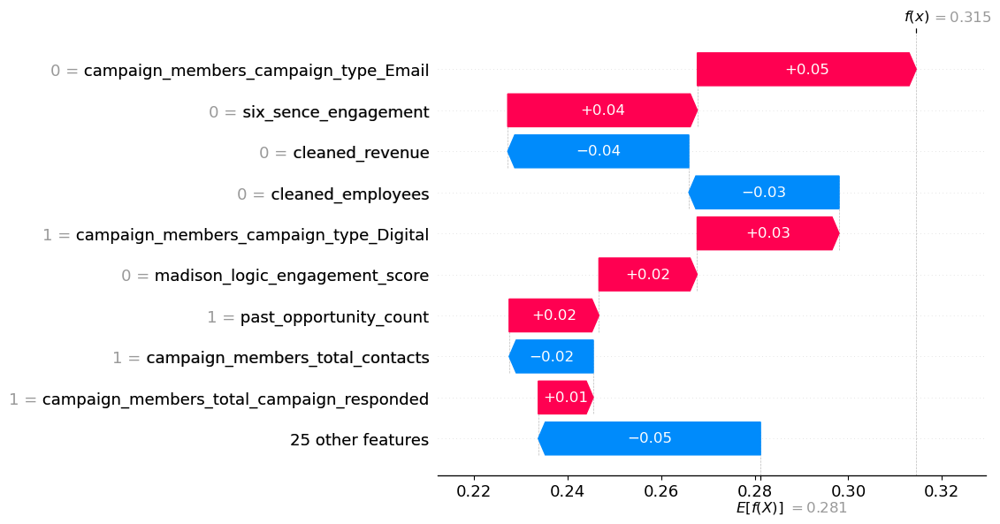

In [381]:
# Step 1: Choose a sample index (e.g., 100th sample)
sample_index = 0

# Step 2: Get the aggregated SHAP values for the selected sample
single_shap_values_aggregated = shap_values_all_classes[sample_index, :]

# Step 3: Compute the mean of base values across all classes (aggregate base value)
mean_base_value = multi_xg_model_shap_values.base_values[sample_index].mean()

# Step 4: Extract the feature values for the selected sample
sample_features = X_test_m.iloc[sample_index, :].values

# Step 5: Create the SHAP Explanation object
waterfall_explanation = shap.Explanation(
    values=single_shap_values_aggregated,   # Aggregated SHAP values for the sample
    base_values=mean_base_value,           # Aggregated base value
    data=sample_features,                  # Feature values for the sample
    feature_names=X_test_m.columns.tolist() # Feature names
)

# Step 6: Plot the SHAP waterfall plot
shap.plots.waterfall(waterfall_explanation)


In [386]:
x=accounts['country'].value_counts().reset_index(name='country_count')
x.sort_values(by='country_count',ascending=False,inplace=True)

In [389]:
x.head(10)

,country,country_count
0,United States,97575
1,United Kingdom,7222
2,Canada,2832
3,India,2307
4,Rest of World,1696
5,Netherlands,1584
6,Australia,1221
7,France,1043
8,Germany,733
9,Belgium,628


In [403]:
opportunity_accounts.to_csv('Results/6_JAN_25/Datasets/multi_class_model_dataset.csv')

In [404]:
X_train_m.to_csv('Results/6_JAN_25/Datasets/multi_class_model_X_train_dataset.csv')

In [405]:
X_test_m.to_csv('Results/6_JAN_25/Datasets/multi_class_model_X_test_dataset.csv')

In [406]:
y_train_m.to_csv('Results/6_JAN_25/Datasets/multi_class_model_y_train_dataset.csv')

In [407]:
y_test_m.to_csv('Results/6_JAN_25/Datasets/multi_class_model_y_test_dataset.csv')

## Model Training Without Six-Sence and Madison Logic

In [418]:
temp_final_accounts=final_accounts.drop(columns=['six_sence_engagement','madison_logic_engagement_score'])

In [419]:
temp_final_accounts

,converted,outreach_calls_total_calls,outreach_calls_outbound_calls,outreach_calls_inbound_calls,outreach_calls_answered_calls,outreach_calls_total_answered_duration,outreach_emails_frequency,outreach_emails_open_count,outreach_emails_click_count,outreach_emails_open_rate,outreach_emails_click_rate,outreach_emails_average_time_required_to_reply,cleaned_employees,cleaned_revenue,campaign_members_total_campaign_targated,campaign_members_total_campaign_responded,campaign_members_total_leads,campaign_members_total_contacts,campaign_members_campaign_type_Content,campaign_members_campaign_type_Digital,campaign_members_campaign_type_Event,campaign_members_campaign_type_Email,campaign_members_campaign_type_Web (WEB),campaign_members_campaign_type_Direct,campaign_members_campaign_type_Self Sourced,campaign_members_campaign_type_Generic Non Lead Gen,campaign_members_campaign_type_Others,days_since_last_campaign_targeted,past_three_months_campaign_targeted,past_six_months_campaign_targeted,past_one_year_campaign_targeted
104362,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,175.0,2.699243e+04,3.0,1.0,4.0,0.0,1.0,0.0,0.0,2.0,0.0,0.0,0.0,0.0,0.0,131.0,0.0,2.0,2.0
115624,0,3.0,3.0,0.0,3.0,133.0,0.0,0.0,0.0,0.0,0.0,0.0,350.0,3.000000e+08,2.0,2.0,1.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,40.0,1.0,2.0,2.0
111820,0,1.0,1.0,0.0,1.0,304.0,0.0,0.0,0.0,0.0,0.0,0.0,750.0,1.000000e+09,10.0,7.0,8.0,0.0,2.0,1.0,5.0,2.0,0.0,0.0,0.0,0.0,0.0,75.0,3.0,4.0,6.0
24246,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,450.0,3.000000e+08,1.0,1.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,517.0,0.0,0.0,0.0
89233,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,9.0,4.953579e+05,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
104160,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,125.0,1.928030e+04,2.0,1.0,3.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,77.0,1.0,1.0,1.0
110561,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,120.0,3.000000e+07,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
48598,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000e+00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
8054,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,750.0,3.000000e+08,7.0,7.0,2.0,0.0,1.0,0.0,5.0,1.0,0.0,0.0,0.0,0.0,0.0,38.0,7.0,7.0,7.0


In [420]:
temp_X_train,temp_X_test,temp_y_train,temp_y_test=train_test_split(temp_final_accounts.drop(columns=['converted']),temp_final_accounts.converted,test_size=0.2,random_state=42,stratify=temp_final_accounts['converted'])

In [421]:
temp_rf_model=RandomForestClassifier(n_estimators= 500,
                                min_samples_split= 10,
                                min_samples_leaf= 4,
                                max_features= 'log2',
                                max_depth= 30,
                                class_weight= 'balanced',
                                bootstrap= False)

In [422]:
temp_rf_model.fit(temp_X_train,temp_y_train)

RandomForestClassifier(bootstrap=False, class_weight='balanced', max_depth=30,
                       max_features='log2', min_samples_leaf=4,
                       min_samples_split=10, n_estimators=500)

In [423]:
temp_y_pred=temp_rf_model.predict(temp_X_test)

In [424]:
accuracy_score(temp_y_test,temp_y_pred)

0.8576198425948008

In [425]:
f1_score(temp_y_test,temp_y_pred)

0.6905132192846034

In [426]:
confusion_matrix(temp_y_test,temp_y_pred)

array([[2930,  278],
       [ 319,  666]], dtype=int64)

In [427]:
print(classification_report(temp_y_test,temp_y_pred))

              precision    recall  f1-score   support

           0       0.90      0.91      0.91      3208
           1       0.71      0.68      0.69       985

    accuracy                           0.86      4193
   macro avg       0.80      0.79      0.80      4193
weighted avg       0.86      0.86      0.86      4193



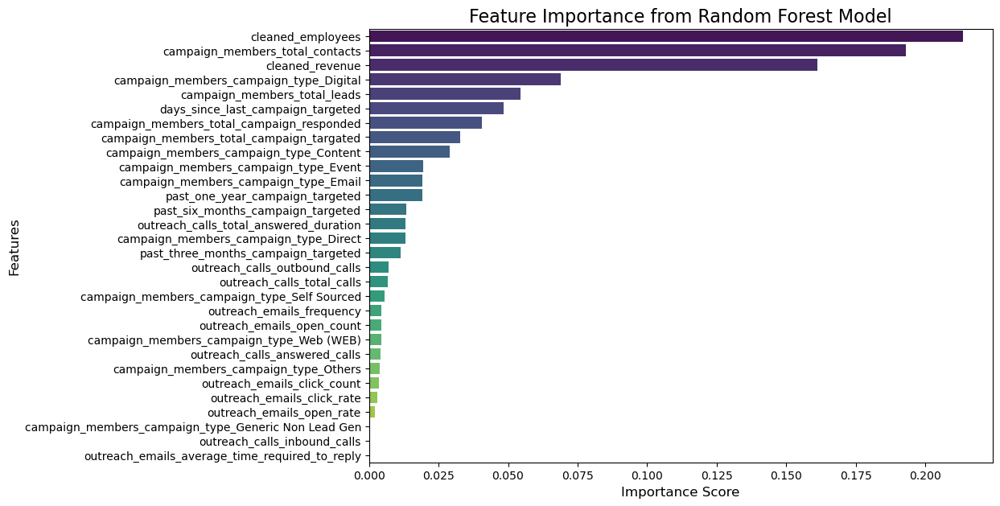

In [429]:
feature_importances = temp_rf_model.feature_importances_
importance_df = pd.DataFrame({
    'Feature': temp_X_train.columns,
    'Importance': feature_importances
}).sort_values(by='Importance', ascending=False)

# Plot the feature importances using Seaborn
plt.figure(figsize=(10, 7))
sns.barplot(data=importance_df, x='Importance', y='Feature', palette='viridis')
plt.title('Feature Importance from Random Forest Model', fontsize=16)
plt.xlabel('Importance Score', fontsize=12)
plt.ylabel('Features', fontsize=12)
plt.show()

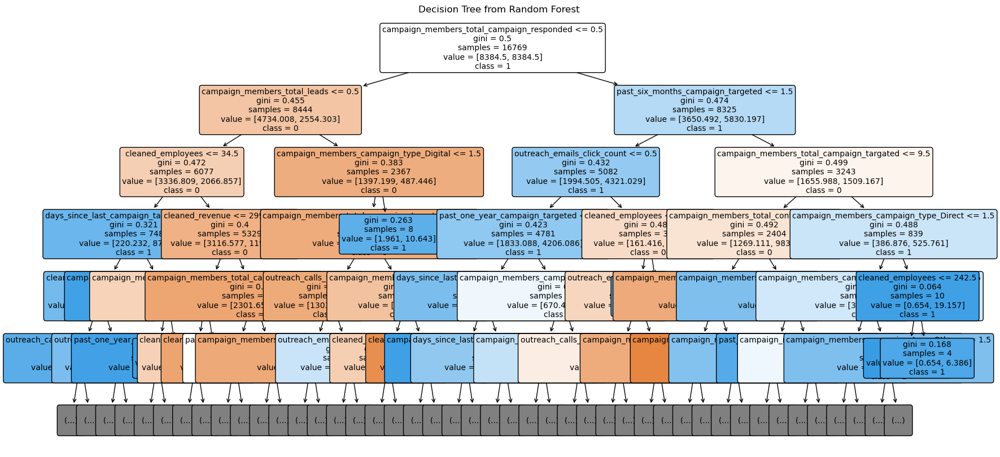

In [433]:
import matplotlib.pyplot as plt
from sklearn.tree import plot_tree

# Extract a single tree from the random forest
tree = temp_rf_model.estimators_[0]  # Get the first tree in the forest

# Convert feature names and class labels to strings (if not already strings)
feature_names = [str(f) for f in temp_X_train.columns]  # Replace X.columns with your feature names
class_names = [str(c) for c in temp_rf_model.classes_]  # Convert class labels to strings

# Plot the tree
plt.figure(figsize=(20, 10))  # Adjust the figure size as needed
plot_tree(tree, 
          feature_names=feature_names, 
          class_names=class_names, 
          filled=True, 
          rounded=True, 
          fontsize=10,max_depth=5)
plt.title("Decision Tree from Random Forest")
plt.show()


DecisionTreeClassifier(max_depth=30, max_features='log2', min_samples_leaf=4,
                       min_samples_split=10, random_state=1785771955)

In [434]:
!pip install dtreeviz


In [435]:

from dtreeviz.trees import *
from IPython.display import Image, display_svg, SVG

In [436]:
import graphviz.backend as be


In [444]:
tree = temp_rf_model.estimators_[0] 

feature_names = [str(f) for f in temp_X_train.columns]  
class_names = [str(c) for c in temp_rf_model.classes_]  
viz = dtreeviz(tree, 
               temp_X_train,
               temp_y_train,
               feature_names=feature_names, 
               class_names=class_names)
viz.view()



C:\Users\Admin\AppData\Local\Temp\ipykernel_20652\2163101785.py:1: DeprecationWarning: dtreeviz() function is deprecated starting from version 2.0. 
 For the same functionality, please use this code instead: 
 m = dtreeviz.model(...) 
 m.view()


ValueError: Tree model must be in (DecisionTreeRegressor, DecisionTreeClassifier, xgboost.core.Booster, lightgbm.basic.Booster, pyspark DecisionTreeClassificationModel, pyspark DecisionTreeClassificationModel, tensorflow_decision_forests.keras.RandomForestModel, tensorflow_decision_forests.keras.GradientBoostedTreesModel) but you passed a module!

In [440]:
from dtreeviz.trees import dtreeviz  # Import the dtreeviz function


ImportError: cannot import name 'dtreeviz' from 'dtreeviz.trees' (C:\Users\Admin\anaconda3\Lib\site-packages\dtreeviz\trees.py)

In [441]:
from dtreeviz import dtreeviz  # Correct import for the `dtreeviz` library


In [450]:
from dtreeviz import dtreeviz  # Import dtreeviz

# Extract a single tree from the RandomForestClassifier
tree = temp_rf_model.estimators_[0]  # Get the first tree from the forest

# Prepare feature and class names
feature_names = [str(f) for f in temp_X_train.columns]  # Ensure feature names are strings
class_names = [str(c) for c in temp_rf_model.classes_]  # Ensure class names are strings

# Ensure that X_train and y_train are in correct formats
X_train = temp_X_train.values  # Convert to NumPy array (if not already)
y_train = temp_y_train.values  # Convert to NumPy array (if not already)

# Visualize the decision tree
viz = dtreeviz(
    tree,                          # Pass the extracted tree (DecisionTreeClassifier)
    X_train=X_train,               # Pass the feature matrix as a NumPy array
    y_train=y_train,               # Pass the target array as a NumPy array
    feature_names=feature_names,   # List of feature names
    class_names=class_names,       # List of class names
    target_name="converted"        # Add a target name for better labeling
)

# Render the visualization
viz.view()


C:\Users\Admin\AppData\Local\Temp\ipykernel_20652\2369241748.py:15: DeprecationWarning: dtreeviz() function is deprecated starting from version 2.0. 
 For the same functionality, please use this code instead: 
 m = dtreeviz.model(...) 
 m.view()


TypeError: 'int' object is not subscriptable

<Axes: xlabel='six_sence_engagement', ylabel='count'>

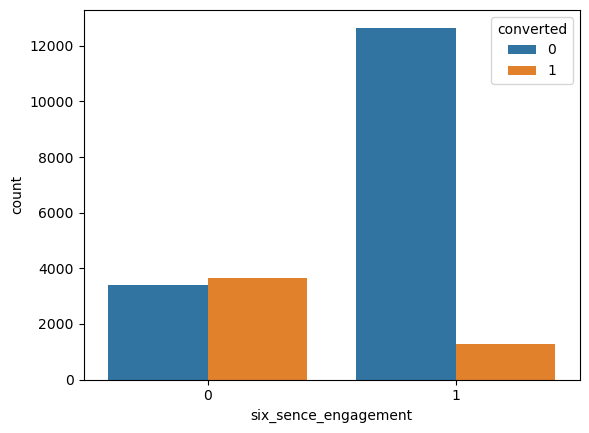

In [452]:
sns.countplot(x='six_sence_engagement',data=final_accounts,hue='converted')

In [454]:
opp_accounts.fillna(0,inplace=True)

In [455]:
opp_accounts.sample()

,base_source,six_sence_engagement,madison_logic_engagement_score,Has Opportunity?,outreach_calls_total_calls,outreach_calls_outbound_calls,outreach_calls_inbound_calls,outreach_calls_answered_calls,outreach_calls_total_answered_duration,outreach_emails_frequency,outreach_emails_open_count,outreach_emails_click_count,outreach_emails_open_rate,outreach_emails_click_rate,outreach_emails_average_time_required_to_reply,cleaned_employees,cleaned_revenue,campaign_members_total_campaign_targated,campaign_members_total_campaign_responded,campaign_members_total_leads,campaign_members_total_contacts,campaign_members_campaign_type_Content,campaign_members_campaign_type_Digital,campaign_members_campaign_type_Event,campaign_members_campaign_type_Email,campaign_members_campaign_type_Web (WEB),campaign_members_campaign_type_Direct,campaign_members_campaign_type_Self Sourced,campaign_members_campaign_type_Generic Non Lead Gen,campaign_members_campaign_type_Others,days_since_last_campaign_targeted,past_three_months_campaign_targeted,past_six_months_campaign_targeted,past_one_year_campaign_targeted
30683,Other Accounts,0,0.0,Yes,1.0,1.0,0.0,1.0,56.0,0.0,0.0,0.0,0.0,0.0,0.0,42.0,5500001.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


<Axes: xlabel='six_sence_engagement', ylabel='count'>

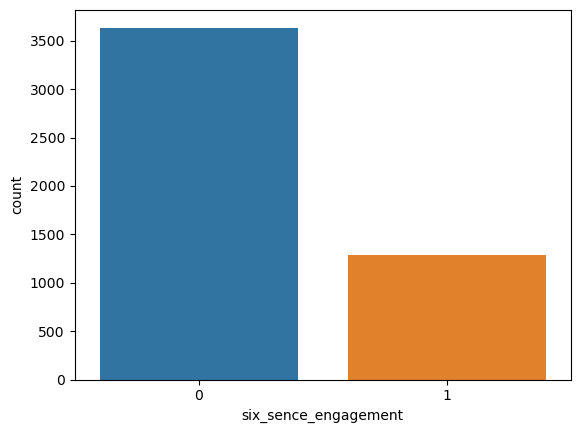

In [456]:
sns.countplot(x='six_sence_engagement',data=opp_accounts)

In [458]:
opportunity_accounts['six_sence_engagement'].value_counts()

six_sence_engagement
0    3141
1    1241
Name: count, dtype: int64

In [459]:
final_accounts['six_sence_engagement'].value_counts()

six_sence_engagement
1    13939
0     7023
Name: count, dtype: int64

In [460]:
final_accounts

,six_sence_engagement,madison_logic_engagement_score,converted,outreach_calls_total_calls,outreach_calls_outbound_calls,outreach_calls_inbound_calls,outreach_calls_answered_calls,outreach_calls_total_answered_duration,outreach_emails_frequency,outreach_emails_open_count,outreach_emails_click_count,outreach_emails_open_rate,outreach_emails_click_rate,outreach_emails_average_time_required_to_reply,cleaned_employees,cleaned_revenue,campaign_members_total_campaign_targated,campaign_members_total_campaign_responded,campaign_members_total_leads,campaign_members_total_contacts,campaign_members_campaign_type_Content,campaign_members_campaign_type_Digital,campaign_members_campaign_type_Event,campaign_members_campaign_type_Email,campaign_members_campaign_type_Web (WEB),campaign_members_campaign_type_Direct,campaign_members_campaign_type_Self Sourced,campaign_members_campaign_type_Generic Non Lead Gen,campaign_members_campaign_type_Others,days_since_last_campaign_targeted,past_three_months_campaign_targeted,past_six_months_campaign_targeted,past_one_year_campaign_targeted
104362,1,15.694000,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,175.0,2.699243e+04,3.0,1.0,4.0,0.0,1.0,0.0,0.0,2.0,0.0,0.0,0.0,0.0,0.0,131.0,0.0,2.0,2.0
115624,1,191.975327,0,3.0,3.0,0.0,3.0,133.0,0.0,0.0,0.0,0.0,0.0,0.0,350.0,3.000000e+08,2.0,2.0,1.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,40.0,1.0,2.0,2.0
111820,0,52.929934,0,1.0,1.0,0.0,1.0,304.0,0.0,0.0,0.0,0.0,0.0,0.0,750.0,1.000000e+09,10.0,7.0,8.0,0.0,2.0,1.0,5.0,2.0,0.0,0.0,0.0,0.0,0.0,75.0,3.0,4.0,6.0
24246,1,0.000000,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,450.0,3.000000e+08,1.0,1.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,517.0,0.0,0.0,0.0
89233,1,155.143000,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,9.0,4.953579e+05,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
104160,0,41.376000,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,125.0,1.928030e+04,2.0,1.0,3.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,77.0,1.0,1.0,1.0
110561,0,240.567331,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,120.0,3.000000e+07,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
48598,1,16.864000,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000e+00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
8054,0,28.512000,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,750.0,3.000000e+08,7.0,7.0,2.0,0.0,1.0,0.0,5.0,1.0,0.0,0.0,0.0,0.0,0.0,38.0,7.0,7.0,7.0


## Balancing Six-Sence and Madison Logic Data

In [468]:
from imblearn.over_sampling import SMOTE

In [462]:
final_accounts

,six_sence_engagement,madison_logic_engagement_score,converted,outreach_calls_total_calls,outreach_calls_outbound_calls,outreach_calls_inbound_calls,outreach_calls_answered_calls,outreach_calls_total_answered_duration,outreach_emails_frequency,outreach_emails_open_count,outreach_emails_click_count,outreach_emails_open_rate,outreach_emails_click_rate,outreach_emails_average_time_required_to_reply,cleaned_employees,cleaned_revenue,campaign_members_total_campaign_targated,campaign_members_total_campaign_responded,campaign_members_total_leads,campaign_members_total_contacts,campaign_members_campaign_type_Content,campaign_members_campaign_type_Digital,campaign_members_campaign_type_Event,campaign_members_campaign_type_Email,campaign_members_campaign_type_Web (WEB),campaign_members_campaign_type_Direct,campaign_members_campaign_type_Self Sourced,campaign_members_campaign_type_Generic Non Lead Gen,campaign_members_campaign_type_Others,days_since_last_campaign_targeted,past_three_months_campaign_targeted,past_six_months_campaign_targeted,past_one_year_campaign_targeted
104362,1,15.694000,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,175.0,2.699243e+04,3.0,1.0,4.0,0.0,1.0,0.0,0.0,2.0,0.0,0.0,0.0,0.0,0.0,131.0,0.0,2.0,2.0
115624,1,191.975327,0,3.0,3.0,0.0,3.0,133.0,0.0,0.0,0.0,0.0,0.0,0.0,350.0,3.000000e+08,2.0,2.0,1.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,40.0,1.0,2.0,2.0
111820,0,52.929934,0,1.0,1.0,0.0,1.0,304.0,0.0,0.0,0.0,0.0,0.0,0.0,750.0,1.000000e+09,10.0,7.0,8.0,0.0,2.0,1.0,5.0,2.0,0.0,0.0,0.0,0.0,0.0,75.0,3.0,4.0,6.0
24246,1,0.000000,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,450.0,3.000000e+08,1.0,1.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,517.0,0.0,0.0,0.0
89233,1,155.143000,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,9.0,4.953579e+05,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
104160,0,41.376000,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,125.0,1.928030e+04,2.0,1.0,3.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,77.0,1.0,1.0,1.0
110561,0,240.567331,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,120.0,3.000000e+07,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
48598,1,16.864000,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000e+00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
8054,0,28.512000,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,750.0,3.000000e+08,7.0,7.0,2.0,0.0,1.0,0.0,5.0,1.0,0.0,0.0,0.0,0.0,0.0,38.0,7.0,7.0,7.0


In [558]:
X_train,X_test,y_train,y_test=train_test_split(train_df.drop(columns=['converted']),train_df.converted,test_size=0.2,random_state=42,stratify=train_df['converted'])

In [559]:
X_train.shape

(18769, 32)

In [560]:
X_train['six_sence_engagement'].value_counts()

six_sence_engagement
1    13104
0     5665
Name: count, dtype: int64

In [561]:
y_train.value_counts()

converted
0    12830
1     5939
Name: count, dtype: int64

In [562]:
y_test.value_counts()

converted
0    3208
1    1485
Name: count, dtype: int64

In [563]:
smote = SMOTE(random_state=42)

In [564]:
X_resample, y_resample = smote.fit_resample(X_train, y_train)

In [565]:
xg_model_balanced=XGBClassifier(colsample_bytre= 0.7156555173390283, 
gamma= 0.005116928204378757,
learning_rate= 0.016647860663356464,
max_depth=7, 
n_estimators= 385,
scale_pos_weight= 2.1035505655787547,
subsample=0.771846614371039)

In [566]:
xg_model_balanced.fit(X_resample,y_resample)

C:\Users\Admin\anaconda3\Lib\site-packages\xgboost\core.py:158: UserWarning: [12:21:06] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0c55ff5f71b100e98-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "colsample_bytre" } are not used.



XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytre=0.7156555173390283, colsample_bytree=None,
              device=None, early_stopping_rounds=None, enable_categorical=False,
              eval_metric=None, feature_types=None, gamma=0.005116928204378757,
              grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=0.016647860663356464,
              max_bin=None, max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=7, max_leaves=None,
              min_child_weight=None, missing=nan, monotone_constraints=None,
              multi_strategy=None, n_estimators=385, n_jobs=None,
              num_parallel_tree=None, ...)

In [567]:
y_pred=xg_model_balanced.predict(X_test)

In [568]:
accuracy_score(y_test,y_pred)

0.865757511186874

In [569]:
f1_score(y_test,y_pred)

0.7860054347826086

In [570]:
confusion_matrix(y_test,y_pred)

array([[2906,  302],
       [ 328, 1157]], dtype=int64)

In [571]:
print(classification_report(y_test,y_pred))

              precision    recall  f1-score   support

           0       0.90      0.91      0.90      3208
           1       0.79      0.78      0.79      1485

    accuracy                           0.87      4693
   macro avg       0.85      0.84      0.84      4693
weighted avg       0.87      0.87      0.87      4693



### Model Interpretation

In [572]:
xg_model_balanced_explainer=shap.Explainer(xg_model_balanced,X_resample)

In [573]:
xg_model_balanced_shap_values = xg_model_balanced_explainer(X_test)


100%|===================| 4673/4693 [01:55<00:00]        

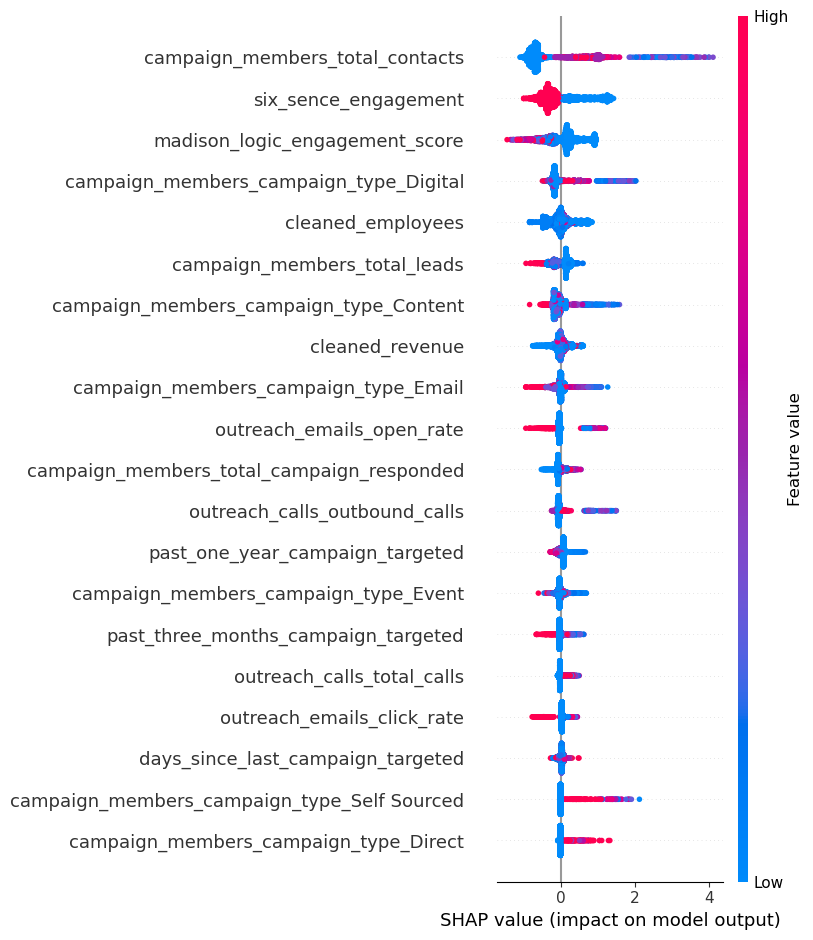

In [542]:
shap.summary_plot(xg_model_balanced_shap_values, X_test)

In [482]:
X_train[X_train['six_sence_engagement']]

KeyError: "None of [Index([1, 1, 1, 1, 0, 1, 1, 0, 1, 1,\n       ...\n       0, 1, 0, 0, 0, 0, 1, 0, 1, 0],\n      dtype='int64', length=16769)] are in the [columns]"

In [484]:
opp_accounts['six_sence_engagement'].value_counts()

six_sence_engagement
0    3636
1    1288
Name: count, dtype: int64

In [494]:
opp_accounts_copy=final_accounts[final_accounts['converted']==1]

In [495]:
opp_accounts_copy.shape

(4924, 33)

In [497]:
six_X_train

,madison_logic_engagement_score,converted,outreach_calls_total_calls,outreach_calls_outbound_calls,outreach_calls_inbound_calls,outreach_calls_answered_calls,outreach_calls_total_answered_duration,outreach_emails_frequency,outreach_emails_open_count,outreach_emails_click_count,outreach_emails_open_rate,outreach_emails_click_rate,outreach_emails_average_time_required_to_reply,cleaned_employees,cleaned_revenue,campaign_members_total_campaign_targated,campaign_members_total_campaign_responded,campaign_members_total_leads,campaign_members_total_contacts,campaign_members_campaign_type_Content,campaign_members_campaign_type_Digital,campaign_members_campaign_type_Event,campaign_members_campaign_type_Email,campaign_members_campaign_type_Web (WEB),campaign_members_campaign_type_Direct,campaign_members_campaign_type_Self Sourced,campaign_members_campaign_type_Generic Non Lead Gen,campaign_members_campaign_type_Others,days_since_last_campaign_targeted,past_three_months_campaign_targeted,past_six_months_campaign_targeted,past_one_year_campaign_targeted
53382,2.118,1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,450.0,30000000.00,2.0,1.0,2.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,114.0,0.0,1.0,1.0
101958,0.000,1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,10001.0,500001.00,9.0,6.0,7.0,3.0,3.0,0.0,4.0,2.0,0.0,0.0,0.0,0.0,0.0,83.0,1.0,3.0,4.0
28986,1.012,1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,38.0,30000000.00,3.0,3.0,2.0,0.0,0.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,73.0,2.0,2.0,2.0
91165,0.000,1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,350.0,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
20831,0.000,1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,300.0,10946600.00,15.0,11.0,3.0,4.0,1.0,4.0,4.0,1.0,1.0,2.0,0.0,0.0,2.0,48.0,10.0,11.0,15.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
74216,0.000,1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,5.0,500001.00,1.0,1.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,54.0,1.0,1.0,1.0
23852,0.000,1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,190.0,25000000.00,8.0,4.0,0.0,2.0,4.0,0.0,1.0,2.0,0.0,1.0,0.0,0.0,0.0,284.0,0.0,0.0,3.0
128392,0.000,1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,9.0,3800000.00,6.0,3.0,3.0,2.0,0.0,3.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,123.0,0.0,1.0,6.0
49200,0.000,1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,4.0,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [504]:
X_res, y_res = smote.fit_resample(opp_accounts_copy.drop(columns=['six_sence_engagement']), opp_accounts_copy.six_sence_engagement)

In [505]:
X_res.shape

(7272, 32)

In [506]:
six_y_train.value_counts()

six_sence_engagement
0    2909
1    1030
Name: count, dtype: int64

In [507]:
y_res.value_counts()

six_sence_engagement
0    3636
1    3636
Name: count, dtype: int64

In [509]:
X_res['converted'].value_counts()

converted
1    7272
Name: count, dtype: int64

In [512]:
X_res['six_sence_engagement']=y_res

In [511]:
final_accounts.shape

(20962, 33)

In [543]:
X_res['six_sence_engagement'].value_counts()

six_sence_engagement
0    3636
1    3636
Name: count, dtype: int64

In [515]:
final_accounts_copy=final_accounts.copy()

In [519]:
final_accounts_copy=final_accounts_copy[final_accounts_copy['converted']==0]

In [517]:
final_accounts.shape

(20962, 33)

In [518]:
final_accounts['converted'].value_counts()

converted
0    16038
1     4924
Name: count, dtype: int64

In [521]:
final_accounts_copy['six_sence_engagement'].value_counts()

six_sence_engagement
1    12651
0     3387
Name: count, dtype: int64

In [523]:
train_df=pd.concat([final_accounts_copy,X_res],axis=0)

In [524]:
train_df['six_sence_engagement'].value_counts()

six_sence_engagement
1    16287
0     7023
Name: count, dtype: int64

In [525]:
train_df['converted'].value_counts()

converted
0    16038
1     7272
Name: count, dtype: int64

In [544]:
positive_six_sence_engagement=X_res[X_res['six_sence_engagement']==1]

In [545]:
positive_six_sence_engagement = positive_six_sence_engagement.sample(frac=1, random_state=42).reset_index(drop=True)


In [546]:
positive_six_sence_engagement

,madison_logic_engagement_score,converted,outreach_calls_total_calls,outreach_calls_outbound_calls,outreach_calls_inbound_calls,outreach_calls_answered_calls,outreach_calls_total_answered_duration,outreach_emails_frequency,outreach_emails_open_count,outreach_emails_click_count,outreach_emails_open_rate,outreach_emails_click_rate,outreach_emails_average_time_required_to_reply,cleaned_employees,cleaned_revenue,campaign_members_total_campaign_targated,campaign_members_total_campaign_responded,campaign_members_total_leads,campaign_members_total_contacts,campaign_members_campaign_type_Content,campaign_members_campaign_type_Digital,campaign_members_campaign_type_Event,campaign_members_campaign_type_Email,campaign_members_campaign_type_Web (WEB),campaign_members_campaign_type_Direct,campaign_members_campaign_type_Self Sourced,campaign_members_campaign_type_Generic Non Lead Gen,campaign_members_campaign_type_Others,days_since_last_campaign_targeted,past_three_months_campaign_targeted,past_six_months_campaign_targeted,past_one_year_campaign_targeted,six_sence_engagement
0,0.000000,1,0.00000,0.0,0.00000,0.000000,0.000000,0.350925,0.350925,0.350925,0.350925,0.350925,0.0,943.008938,1.308037e+08,3.298149,1.298149,4.596299,0.649075,1.298149,0.649075,0.701851,0.649075,0.0,0.0,0.000000,0.00000,0.00000,178.723102,0.000000,0.649075,1.350925,1
1,45.329605,1,1.00000,1.0,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,1500.000000,1.000000e+09,10.000000,4.000000,3.000000,2.000000,1.000000,1.000000,3.000000,4.000000,0.0,0.0,1.000000,0.00000,0.00000,73.000000,1.000000,1.000000,2.000000,1
2,109.889654,1,2.00000,2.0,0.00000,2.000000,186.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,300.000000,7.500000e+08,4.000000,1.000000,4.000000,0.000000,1.000000,1.000000,1.000000,1.000000,0.0,0.0,0.000000,0.00000,0.00000,74.000000,1.000000,1.000000,1.000000,1
3,666.485032,1,0.00000,0.0,0.00000,0.000000,0.000000,2.478742,2.478742,2.478742,0.826247,0.826247,0.0,237.726609,6.462196e+08,4.957484,1.652495,3.304990,0.826247,0.826247,0.000000,2.478742,1.652495,0.0,0.0,0.000000,0.00000,0.00000,63.621050,0.826247,1.652495,3.304990,1
4,97.020774,1,0.00000,0.0,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,234.451557,3.187898e+04,1.626445,0.626445,2.494219,0.000000,1.000000,0.000000,0.000000,0.626445,0.0,0.0,0.000000,0.00000,0.00000,473.262987,0.000000,0.000000,0.000000,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3631,216.206000,1,0.00000,0.0,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,2.000000,5.086157e+07,8.000000,3.000000,17.000000,2.000000,1.000000,0.000000,2.000000,3.000000,0.0,2.0,0.000000,0.00000,0.00000,355.000000,0.000000,0.000000,1.000000,1
3632,0.000000,1,1.38042,1.0,0.38042,0.760839,33.857354,1.000000,1.000000,0.000000,1.000000,0.000000,0.0,6739.160592,1.000000e+09,8.000000,4.619580,3.141259,4.478321,0.619580,0.000000,4.521679,1.619580,0.0,0.0,0.000000,0.61958,0.61958,151.000000,0.000000,2.239161,4.858741,1
3633,500.601000,1,2.00000,2.0,0.00000,2.000000,445.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,1129.000000,2.489650e+08,6.000000,3.000000,21.000000,0.000000,2.000000,2.000000,1.000000,1.000000,0.0,0.0,0.000000,0.00000,0.00000,201.000000,0.000000,0.000000,5.000000,1
3634,237.481191,1,0.00000,0.0,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,1673.308251,1.000000e+09,8.960150,4.653383,24.641354,1.306767,1.346617,0.000000,4.960150,2.306767,0.0,0.0,0.346617,0.00000,0.00000,57.358646,3.306767,4.960150,6.920301,1


In [547]:
final_accounts

,six_sence_engagement,madison_logic_engagement_score,converted,outreach_calls_total_calls,outreach_calls_outbound_calls,outreach_calls_inbound_calls,outreach_calls_answered_calls,outreach_calls_total_answered_duration,outreach_emails_frequency,outreach_emails_open_count,outreach_emails_click_count,outreach_emails_open_rate,outreach_emails_click_rate,outreach_emails_average_time_required_to_reply,cleaned_employees,cleaned_revenue,campaign_members_total_campaign_targated,campaign_members_total_campaign_responded,campaign_members_total_leads,campaign_members_total_contacts,campaign_members_campaign_type_Content,campaign_members_campaign_type_Digital,campaign_members_campaign_type_Event,campaign_members_campaign_type_Email,campaign_members_campaign_type_Web (WEB),campaign_members_campaign_type_Direct,campaign_members_campaign_type_Self Sourced,campaign_members_campaign_type_Generic Non Lead Gen,campaign_members_campaign_type_Others,days_since_last_campaign_targeted,past_three_months_campaign_targeted,past_six_months_campaign_targeted,past_one_year_campaign_targeted
104362,1,15.694000,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,175.0,2.699243e+04,3.0,1.0,4.0,0.0,1.0,0.0,0.0,2.0,0.0,0.0,0.0,0.0,0.0,131.0,0.0,2.0,2.0
115624,1,191.975327,0,3.0,3.0,0.0,3.0,133.0,0.0,0.0,0.0,0.0,0.0,0.0,350.0,3.000000e+08,2.0,2.0,1.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,40.0,1.0,2.0,2.0
111820,0,52.929934,0,1.0,1.0,0.0,1.0,304.0,0.0,0.0,0.0,0.0,0.0,0.0,750.0,1.000000e+09,10.0,7.0,8.0,0.0,2.0,1.0,5.0,2.0,0.0,0.0,0.0,0.0,0.0,75.0,3.0,4.0,6.0
24246,1,0.000000,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,450.0,3.000000e+08,1.0,1.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,517.0,0.0,0.0,0.0
89233,1,155.143000,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,9.0,4.953579e+05,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
104160,0,41.376000,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,125.0,1.928030e+04,2.0,1.0,3.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,77.0,1.0,1.0,1.0
110561,0,240.567331,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,120.0,3.000000e+07,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
48598,1,16.864000,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000e+00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
8054,0,28.512000,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,750.0,3.000000e+08,7.0,7.0,2.0,0.0,1.0,0.0,5.0,1.0,0.0,0.0,0.0,0.0,0.0,38.0,7.0,7.0,7.0


In [548]:
opp_accounts['six_sence_engagement'].value_counts()

six_sence_engagement
0    3636
1    1288
Name: count, dtype: int64

In [549]:
temp_positive_six_sence_engagement=positive_six_sence_engagement.sample(2500)

In [550]:
train_df=pd.concat([final_accounts,temp_positive_six_sence_engagement],axis=0)

In [551]:
train_df

,six_sence_engagement,madison_logic_engagement_score,converted,outreach_calls_total_calls,outreach_calls_outbound_calls,outreach_calls_inbound_calls,outreach_calls_answered_calls,outreach_calls_total_answered_duration,outreach_emails_frequency,outreach_emails_open_count,outreach_emails_click_count,outreach_emails_open_rate,outreach_emails_click_rate,outreach_emails_average_time_required_to_reply,cleaned_employees,cleaned_revenue,campaign_members_total_campaign_targated,campaign_members_total_campaign_responded,campaign_members_total_leads,campaign_members_total_contacts,campaign_members_campaign_type_Content,campaign_members_campaign_type_Digital,campaign_members_campaign_type_Event,campaign_members_campaign_type_Email,campaign_members_campaign_type_Web (WEB),campaign_members_campaign_type_Direct,campaign_members_campaign_type_Self Sourced,campaign_members_campaign_type_Generic Non Lead Gen,campaign_members_campaign_type_Others,days_since_last_campaign_targeted,past_three_months_campaign_targeted,past_six_months_campaign_targeted,past_one_year_campaign_targeted
104362,1,15.694000,0,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,175.000000,2.699243e+04,3.000000,1.000000,4.000000,0.000000,1.000000,0.000000,0.000000,2.000000,0.0,0.0,0.000000,0.0,0.0,131.000000,0.000000,2.000000,2.000000
115624,1,191.975327,0,3.000000,3.000000,0.0,3.000000,133.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,350.000000,3.000000e+08,2.000000,2.000000,1.000000,0.000000,1.000000,0.000000,0.000000,1.000000,0.0,0.0,0.000000,0.0,0.0,40.000000,1.000000,2.000000,2.000000
111820,0,52.929934,0,1.000000,1.000000,0.0,1.000000,304.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,750.000000,1.000000e+09,10.000000,7.000000,8.000000,0.000000,2.000000,1.000000,5.000000,2.000000,0.0,0.0,0.000000,0.0,0.0,75.000000,3.000000,4.000000,6.000000
24246,1,0.000000,0,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,450.000000,3.000000e+08,1.000000,1.000000,1.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.0,0.0,0.000000,0.0,0.0,517.000000,0.000000,0.000000,0.000000
89233,1,155.143000,0,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,9.000000,4.953579e+05,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.000000,0.0,0.0,0.000000,0.000000,0.000000,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3019,1,0.000000,1,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,50.000000,1.246215e+07,5.000000,2.000000,3.000000,1.000000,2.000000,0.000000,0.000000,3.000000,0.0,0.0,0.000000,0.0,0.0,284.000000,0.000000,0.000000,3.000000
1265,1,40.277841,1,0.000000,0.000000,0.0,0.000000,0.000000,2.421625,2.421625,2.294171,0.127454,0.120746,0.0,265.652099,1.147596e+08,2.617638,0.872546,0.872546,0.872546,1.745092,0.000000,0.000000,0.000000,0.0,0.0,0.872546,0.0,0.0,278.342187,0.000000,0.000000,0.872546
2711,1,2.982000,1,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,450.000000,7.500000e+08,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.000000,0.0,0.0,0.000000,0.000000,0.000000,0.000000
2159,1,2808.321742,1,1.151524,1.151524,0.0,0.383841,124.172704,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,10001.000000,1.000000e+09,16.343445,12.575762,38.272714,1.383841,2.000000,0.808079,9.959604,3.575762,0.0,0.0,0.000000,0.0,0.0,73.747409,2.151524,8.151524,12.343445


In [553]:
train_df['converted'].value_counts()

converted
0    16038
1     7424
Name: count, dtype: int64

In [557]:
train_df.shape

(23462, 33)

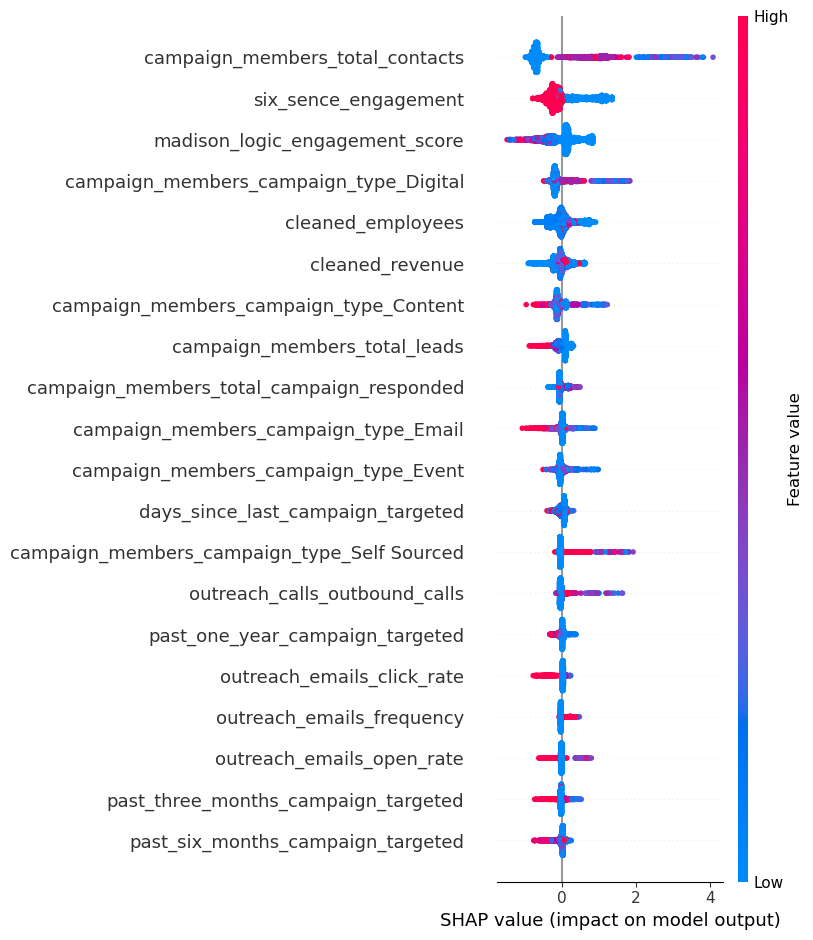

In [574]:
shap.summary_plot(xg_model_balanced_shap_values, X_test)

<Axes: xlabel='six_sence_engagement', ylabel='count'>

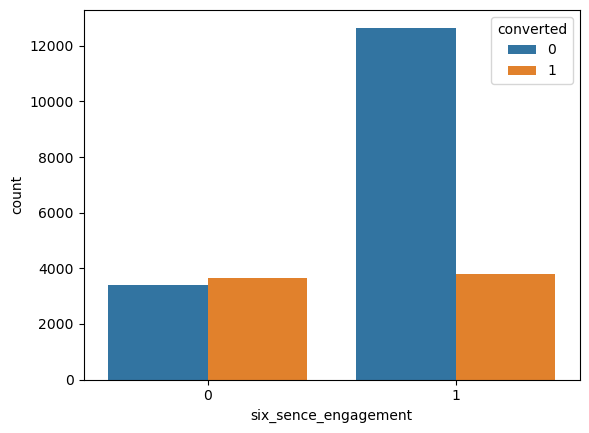

In [576]:
sns.countplot(x='six_sence_engagement',data=train_df,hue='converted')

<Axes: xlabel='six_sence_engagement', ylabel='count'>

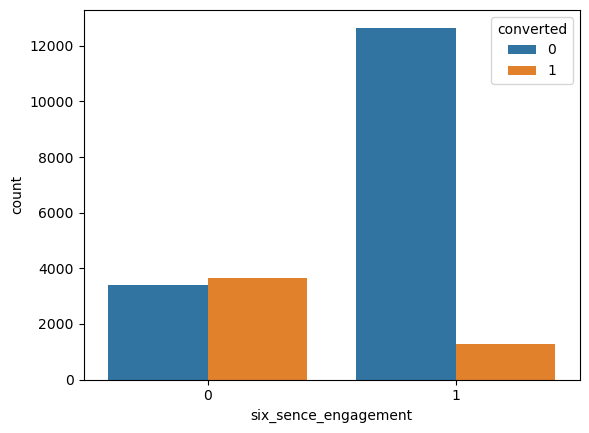

In [578]:
sns.countplot(x='six_sence_engagement',data=final_accounts,hue='converted')

In [579]:
final_accounts['six_sence_engagement'].value_counts()

six_sence_engagement
1    13939
0     7023
Name: count, dtype: int64

In [580]:
train_df['six_sence_engagement'].value_counts()

six_sence_engagement
1    16439
0     7023
Name: count, dtype: int64

In [583]:
final_accounts['converted'].value_counts()

converted
0    16038
1     4924
Name: count, dtype: int64

In [584]:
train_df['converted'].value_counts()

converted
0    16038
1     7424
Name: count, dtype: int64

In [586]:
final_accounts_n=final_accounts[final_accounts['converted']==0]

In [588]:
zero_counts = (final_accounts_n == 0).sum(axis=1)

In [589]:
final_accounts_n['zero_counts']=zero_counts

C:\Users\Admin\AppData\Local\Temp\ipykernel_20652\1788893294.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


In [590]:
final_accounts_n.sort_values(by='zero_counts',inplace=True)

C:\Users\Admin\AppData\Local\Temp\ipykernel_20652\2820255906.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


In [629]:
final_accounts_n.sort_values(by=['six_sence_engagement'],inplace=True)

C:\Users\Admin\AppData\Local\Temp\ipykernel_20652\2866050192.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


In [630]:
final_accounts_n.head(5000)['six_sence_engagement'].value_counts()

six_sence_engagement
0    3387
1    1613
Name: count, dtype: int64

In [623]:
final_accounts_n[final_accounts_n['six_sence_engagement']==0]

,six_sence_engagement,madison_logic_engagement_score,converted,outreach_calls_total_calls,outreach_calls_outbound_calls,outreach_calls_inbound_calls,outreach_calls_answered_calls,outreach_calls_total_answered_duration,outreach_emails_frequency,outreach_emails_open_count,outreach_emails_click_count,outreach_emails_open_rate,outreach_emails_click_rate,outreach_emails_average_time_required_to_reply,cleaned_employees,cleaned_revenue,campaign_members_total_campaign_targated,campaign_members_total_campaign_responded,campaign_members_total_leads,campaign_members_total_contacts,campaign_members_campaign_type_Content,campaign_members_campaign_type_Digital,campaign_members_campaign_type_Event,campaign_members_campaign_type_Email,campaign_members_campaign_type_Web (WEB),campaign_members_campaign_type_Direct,campaign_members_campaign_type_Self Sourced,campaign_members_campaign_type_Generic Non Lead Gen,campaign_members_campaign_type_Others,days_since_last_campaign_targeted,past_three_months_campaign_targeted,past_six_months_campaign_targeted,past_one_year_campaign_targeted,zero_counts
44673,0,0.00000,0,2.0,2.0,0.0,2.0,132.0,5.0,5.0,3.0,1.0,0.6,0.0,47850.0,1.000000e+09,49.0,35.0,69.0,8.0,4.0,5.0,28.0,7.0,1.0,0.0,1.0,0.0,3.0,77.0,2.0,14.0,31.0,7
5770,0,247.23000,0,6.0,6.0,0.0,6.0,273.0,18.0,18.0,18.0,1.0,1.0,0.0,450.0,3.000000e+08,12.0,11.0,10.0,5.0,1.0,3.0,5.0,1.0,1.0,0.0,0.0,0.0,1.0,39.0,7.0,12.0,12.0,7
118149,0,0.00000,0,8.0,7.0,1.0,5.0,429.0,4.0,4.0,0.0,1.0,0.0,0.0,2000.0,1.000000e+09,50.0,37.0,208.0,4.0,3.0,3.0,34.0,7.0,1.0,0.0,2.0,0.0,0.0,40.0,13.0,26.0,41.0,9
85211,0,0.90000,0,2.0,2.0,0.0,1.0,15.0,14.0,14.0,14.0,1.0,1.0,0.0,30.0,1.000000e+07,10.0,8.0,3.0,2.0,0.0,2.0,5.0,2.0,1.0,0.0,0.0,0.0,0.0,48.0,5.0,6.0,7.0,9
32957,0,1727.36100,0,1.0,1.0,0.0,1.0,28.0,3.0,3.0,3.0,1.0,1.0,0.0,1500.0,2.666852e+06,19.0,12.0,20.0,0.0,2.0,4.0,9.0,3.0,0.0,0.0,1.0,0.0,0.0,48.0,8.0,11.0,17.0,9
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
95459,0,83.24588,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000e+00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,32
98598,0,16.62800,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000e+00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,32
68811,0,0.00000,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,50.0,0.000000e+00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,32
4501,0,8.27400,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000e+00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,32


In [631]:
train_df=pd.concat([final_accounts_n.head(5000),final_accounts[final_accounts['converted']==1]])

In [632]:
train_df

,six_sence_engagement,madison_logic_engagement_score,converted,outreach_calls_total_calls,outreach_calls_outbound_calls,outreach_calls_inbound_calls,outreach_calls_answered_calls,outreach_calls_total_answered_duration,outreach_emails_frequency,outreach_emails_open_count,outreach_emails_click_count,outreach_emails_open_rate,outreach_emails_click_rate,outreach_emails_average_time_required_to_reply,cleaned_employees,cleaned_revenue,campaign_members_total_campaign_targated,campaign_members_total_campaign_responded,campaign_members_total_leads,campaign_members_total_contacts,campaign_members_campaign_type_Content,campaign_members_campaign_type_Digital,campaign_members_campaign_type_Event,campaign_members_campaign_type_Email,campaign_members_campaign_type_Web (WEB),campaign_members_campaign_type_Direct,campaign_members_campaign_type_Self Sourced,campaign_members_campaign_type_Generic Non Lead Gen,campaign_members_campaign_type_Others,days_since_last_campaign_targeted,past_three_months_campaign_targeted,past_six_months_campaign_targeted,past_one_year_campaign_targeted,zero_counts
75976,0,0.000,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,33.0
10437,0,152.668,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1687.0,1069310.0,7.0,2.0,11.0,5.0,2.0,4.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,74.0,2.0,3.0,6.0,19.0
36895,0,24.488,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,50.0,500001.0,9.0,6.0,33.0,2.0,2.0,0.0,6.0,0.0,0.0,0.0,1.0,0.0,0.0,77.0,3.0,3.0,6.0,19.0
89976,0,0.558,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,20.0,30000000.0,6.0,3.0,5.0,0.0,2.0,1.0,2.0,1.0,0.0,0.0,0.0,0.0,0.0,39.0,3.0,4.0,5.0,19.0
128133,0,39.662,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,75.0,75000000.0,7.0,5.0,4.0,0.0,1.0,1.0,4.0,1.0,0.0,0.0,0.0,0.0,0.0,77.0,1.0,3.0,3.0,19.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
87089,0,0.000,1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1500.0,264200000.0,1.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,229.0,0.0,0.0,1.0,NaN
111849,0,0.000,1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,10.0,1993400.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN
147086,0,0.000,1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2.0,2.0,0.0,1.0,0.0,2.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,45.0,2.0,2.0,2.0,NaN
43579,0,0.000,1,3.0,3.0,0.0,3.0,312.0,0.0,0.0,0.0,0.0,0.0,0.0,5.0,5500001.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN


In [594]:
train_df['converted'].value_counts()

converted
0    5000
1    4924
Name: count, dtype: int64

In [595]:
train_df['six_sence_engagement'].value_counts()

six_sence_engagement
1    4997
0    4927
Name: count, dtype: int64

In [639]:
train_df.drop(columns=['zero_counts'],inplace=True)

In [716]:
X_train,X_test,y_train,y_test=train_test_split(train_df.drop(columns=['converted']),train_df.converted,test_size=0.2,random_state=42,stratify=train_df['converted'])

In [717]:
xg_model_balanced=XGBClassifier(colsample_bytre= 0.7156555173390283, 
gamma= 0.005116928204378757,
learning_rate= 0.016647860663356464,
max_depth=7, 
n_estimators= 385,
scale_pos_weight= 2.1035505655787547,
subsample=0.771846614371039)

In [718]:
xg_model_balanced.fit(X_train,y_train)

C:\Users\Admin\anaconda3\Lib\site-packages\xgboost\core.py:158: UserWarning: [14:47:32] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0c55ff5f71b100e98-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "colsample_bytre" } are not used.



XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytre=0.7156555173390283, colsample_bytree=None,
              device=None, early_stopping_rounds=None, enable_categorical=False,
              eval_metric=None, feature_types=None, gamma=0.005116928204378757,
              grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=0.016647860663356464,
              max_bin=None, max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=7, max_leaves=None,
              min_child_weight=None, missing=nan, monotone_constraints=None,
              multi_strategy=None, n_estimators=385, n_jobs=None,
              num_parallel_tree=None, ...)

In [719]:
y_pred=xg_model_balanced.predict(X_test)

In [720]:
accuracy_score(y_test,y_pred)

0.8710327455919396

In [721]:
f1_score(y_test,y_pred)

0.8708375378405651

In [722]:
confusion_matrix(y_test,y_pred)

array([[866, 134],
       [122, 863]], dtype=int64)

In [723]:
print(classification_report(y_test,y_pred))

              precision    recall  f1-score   support

           0       0.88      0.87      0.87      1000
           1       0.87      0.88      0.87       985

    accuracy                           0.87      1985
   macro avg       0.87      0.87      0.87      1985
weighted avg       0.87      0.87      0.87      1985



In [724]:
xg_model_balanced_explainer=shap.Explainer(xg_model_balanced,X_train)

In [725]:
xg_model_balanced_shap_values = xg_model_balanced_explainer(X_test)

 98%|===================| 1951/1985 [00:56<00:00]        

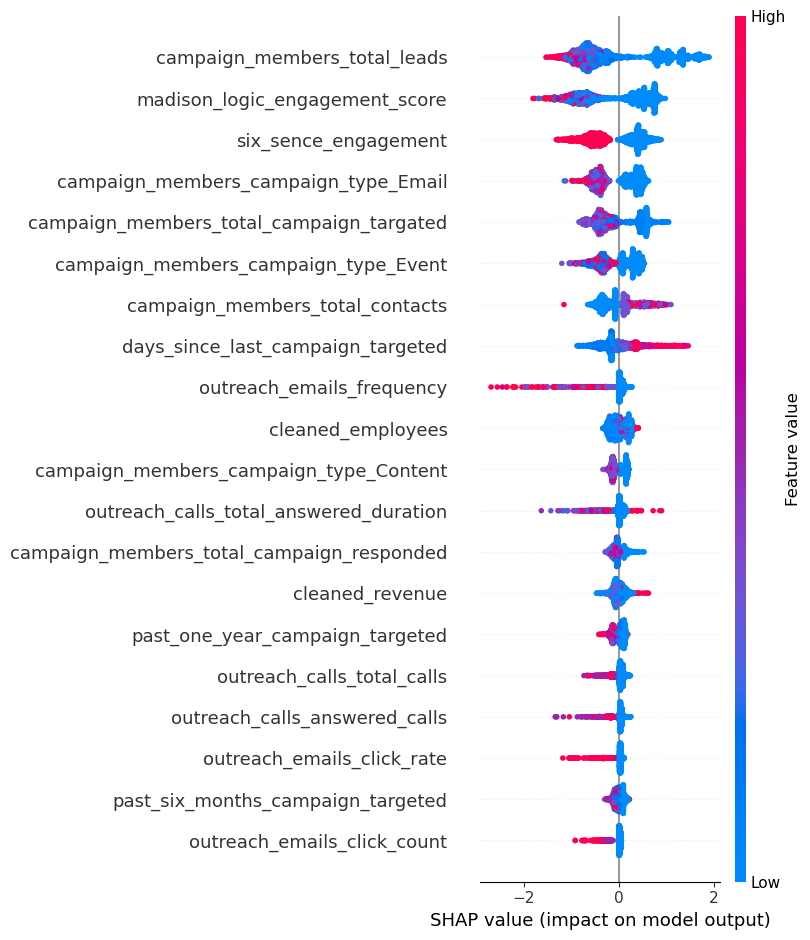

In [620]:
shap.summary_plot(xg_model_balanced_shap_values, X_test)

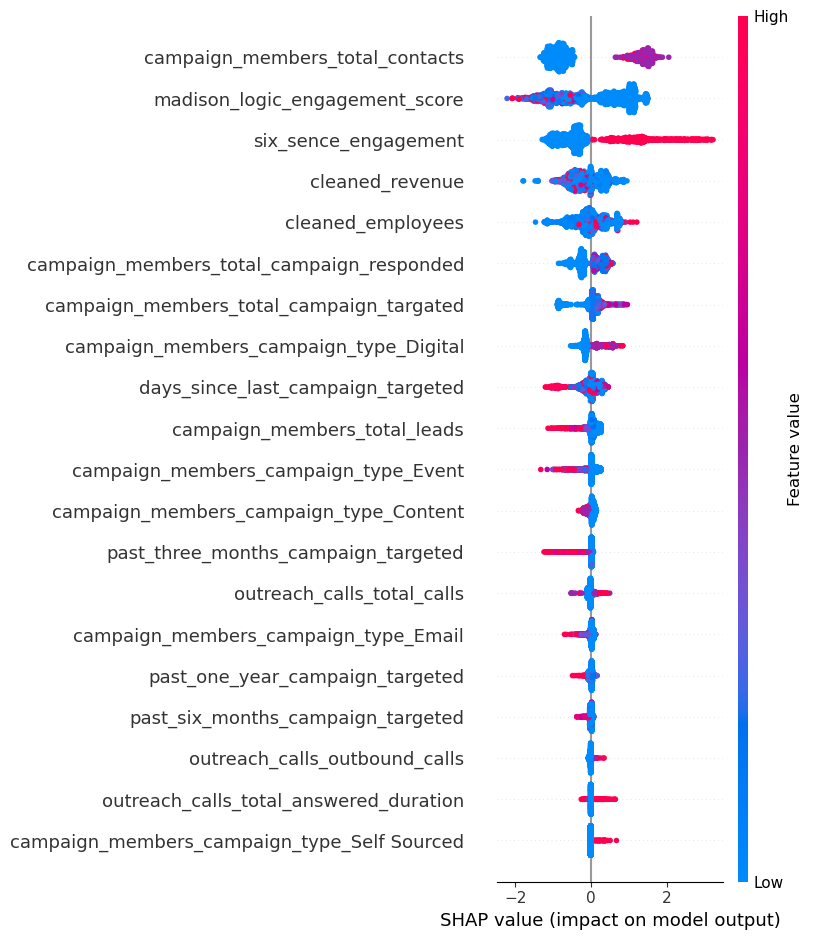

In [650]:
shap.summary_plot(xg_model_balanced_shap_values, X_test)

In [651]:
train_df['six_sence_engagement'].value_counts()

six_sence_engagement
0    7023
1    2901
Name: count, dtype: int64

In [622]:
train_df[train_df['converted']==1]['six_sence_engagement'].value_counts()

six_sence_engagement
0    3636
1    1288
Name: count, dtype: int64

In [652]:
train_df.shape

(9924, 33)

In [653]:
train_df['converted'].value_counts()

converted
0    5000
1    4924
Name: count, dtype: int64

In [658]:
accounts['base_source'].value_counts()

base_source
Other Accounts         130235
Target TAL Accounts     17610
Name: count, dtype: int64

In [659]:
tal_accounts=accounts[accounts['base_source']=='Target TAL Accounts']

In [660]:
opp_accounts=accounts[accounts['Has Opportunity?']=='Yes']

In [662]:
tal_accounts=tal_accounts[tal_accounts['Has Opportunity?']=='No']

In [664]:
temp_final_accounts=pd.concat([tal_accounts,opp_accounts])

In [668]:
temp_final_accounts.rename(columns={'Has Opportunity?':'converted'},inplace=True)

In [671]:
final_accounts.columns

Index(['six_sence_engagement', 'madison_logic_engagement_score', 'converted',
       'outreach_calls_total_calls', 'outreach_calls_outbound_calls',
       'outreach_calls_inbound_calls', 'outreach_calls_answered_calls',
       'outreach_calls_total_answered_duration', 'outreach_emails_frequency',
       'outreach_emails_open_count', 'outreach_emails_click_count',
       'outreach_emails_open_rate', 'outreach_emails_click_rate',
       'outreach_emails_average_time_required_to_reply', 'cleaned_employees',
       'cleaned_revenue', 'campaign_members_total_campaign_targated',
       'campaign_members_total_campaign_responded',
       'campaign_members_total_leads', 'campaign_members_total_contacts',
       'campaign_members_campaign_type_Content',
       'campaign_members_campaign_type_Digital',
       'campaign_members_campaign_type_Event',
       'campaign_members_campaign_type_Email',
       'campaign_members_campaign_type_Web (WEB)',
       'campaign_members_campaign_type_Direct',
   

In [675]:
temp_final_accounts=temp_final_accounts[['buying_stage','six_sence_engagement', 'madison_logic_engagement_score', 'converted',
       'outreach_calls_total_calls', 'outreach_calls_outbound_calls',
       'outreach_calls_inbound_calls', 'outreach_calls_answered_calls',
       'outreach_calls_total_answered_duration', 'outreach_emails_frequency',
       'outreach_emails_open_count', 'outreach_emails_click_count',
       'outreach_emails_open_rate', 'outreach_emails_click_rate',
       'outreach_emails_average_time_required_to_reply', 'cleaned_employees',
       'cleaned_revenue', 'campaign_members_total_campaign_targated',
       'campaign_members_total_campaign_responded',
       'campaign_members_total_leads', 'campaign_members_total_contacts',
       'campaign_members_campaign_type_Content',
       'campaign_members_campaign_type_Digital',
       'campaign_members_campaign_type_Event',
       'campaign_members_campaign_type_Email',
       'campaign_members_campaign_type_Web (WEB)',
       'campaign_members_campaign_type_Direct',
       'campaign_members_campaign_type_Self Sourced',
       'campaign_members_campaign_type_Generic Non Lead Gen',
       'campaign_members_campaign_type_Others',
       'days_since_last_campaign_targeted',
       'past_three_months_campaign_targeted',
       'past_six_months_campaign_targeted', 'past_one_year_campaign_targeted']]

In [676]:
temp_final_accounts

,buying_stage,six_sence_engagement,madison_logic_engagement_score,converted,outreach_calls_total_calls,outreach_calls_outbound_calls,outreach_calls_inbound_calls,outreach_calls_answered_calls,outreach_calls_total_answered_duration,outreach_emails_frequency,outreach_emails_open_count,outreach_emails_click_count,outreach_emails_open_rate,outreach_emails_click_rate,outreach_emails_average_time_required_to_reply,cleaned_employees,cleaned_revenue,campaign_members_total_campaign_targated,campaign_members_total_campaign_responded,campaign_members_total_leads,campaign_members_total_contacts,campaign_members_campaign_type_Content,campaign_members_campaign_type_Digital,campaign_members_campaign_type_Event,campaign_members_campaign_type_Email,campaign_members_campaign_type_Web (WEB),campaign_members_campaign_type_Direct,campaign_members_campaign_type_Self Sourced,campaign_members_campaign_type_Generic Non Lead Gen,campaign_members_campaign_type_Others,days_since_last_campaign_targeted,past_three_months_campaign_targeted,past_six_months_campaign_targeted,past_one_year_campaign_targeted
9,Consideration,1,8.316,No,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,450.0,7.500000e+07,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
22,Awareness,1,NaN,No,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1000.0,1.692761e+06,2.0,NaN,1.0,NaN,1.0,NaN,NaN,1.0,NaN,NaN,NaN,NaN,NaN,130.0,NaN,1.0,1.0
41,Awareness,1,NaN,No,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,147.0,3.000000e+07,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
46,Consideration,1,NaN,No,NaN,NaN,NaN,NaN,NaN,2.0,2.0,2.0,1.0,1.0,0.0,150.0,3.000000e+08,2.0,1.0,1.0,NaN,1.0,NaN,1.0,NaN,NaN,NaN,NaN,NaN,NaN,264.0,NaN,NaN,2.0
47,Decision,1,124.930,No,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,750.0,7.500000e+08,12.0,9.0,9.0,NaN,2.0,2.0,4.0,4.0,NaN,NaN,NaN,NaN,NaN,48.0,4.0,6.0,8.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
147730,NaN,0,NaN,Yes,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0,NaN,2.0,2.0,NaN,1.0,NaN,2.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,670.0,NaN,NaN,NaN
147736,NaN,0,NaN,Yes,1.0,1.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,5.0,5.500001e+06,1.0,NaN,NaN,1.0,NaN,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,571.0,NaN,NaN,NaN
147756,NaN,0,NaN,Yes,3.0,3.0,0.0,2.0,374.0,1.0,1.0,0.0,1.0,0.0,0.0,22000.0,5.000010e+05,13.0,9.0,20.0,3.0,2.0,1.0,8.0,2.0,NaN,NaN,NaN,NaN,NaN,40.0,1.0,2.0,7.0
147784,NaN,0,NaN,Yes,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1100.0,9.085092e+08,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [678]:
temp_final_accounts['buying_stage'].value_counts(dropna=False)

buying_stage
Consideration    5716
Decision         5444
NaN              4150
Awareness        3215
Target           1400
Purchase         1037
Name: count, dtype: int64

In [680]:
# temp_final_accounts['buying_stage'].fillna('Not Available',inplace=True)

C:\Users\Admin\AppData\Local\Temp\ipykernel_20652\574146519.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


In [681]:
temp_final_accounts['buying_stage'].value_counts(dropna=False)

buying_stage
Consideration    5716
Decision         5444
Not Available    4150
Awareness        3215
Target           1400
Purchase         1037
Name: count, dtype: int64

In [682]:
from sklearn.preprocessing import OneHotEncoder

In [683]:
ohe_encoder=OneHotEncoder(sparse=False,drop='first')

In [684]:
buying_stage_encoded=ohe_encoder.fit_transform(temp_final_accounts[['buying_stage']])

# Create a DataFrame with encoded categorical features
buying_stage_encoded_df = pd.DataFrame(
    buying_stage_encoded,
    columns=ohe_encoder.get_feature_names_out(['buying_stage'])
)

C:\Users\Admin\anaconda3\Lib\site-packages\sklearn\preprocessing\_encoders.py:868: FutureWarning: `sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.


In [685]:
buying_stage_encoded_df

,buying_stage_Consideration,buying_stage_Decision,buying_stage_Not Available,buying_stage_Purchase,buying_stage_Target
0,1.0,0.0,0.0,0.0,0.0
1,0.0,0.0,0.0,0.0,0.0
2,0.0,0.0,0.0,0.0,0.0
3,1.0,0.0,0.0,0.0,0.0
4,0.0,1.0,0.0,0.0,0.0
...,...,...,...,...,...
20957,0.0,0.0,1.0,0.0,0.0
20958,0.0,0.0,1.0,0.0,0.0
20959,0.0,0.0,1.0,0.0,0.0
20960,0.0,0.0,1.0,0.0,0.0


In [690]:
df_transformed = pd.concat(
    [buying_stage_encoded_df.reset_index(drop=True), temp_final_accounts.drop(columns=['buying_stage'],axis=1).reset_index(drop=True)],
    axis=1
)

In [691]:
df_transformed

,buying_stage_Consideration,buying_stage_Decision,buying_stage_Not Available,buying_stage_Purchase,buying_stage_Target,six_sence_engagement,madison_logic_engagement_score,converted,outreach_calls_total_calls,outreach_calls_outbound_calls,outreach_calls_inbound_calls,outreach_calls_answered_calls,outreach_calls_total_answered_duration,outreach_emails_frequency,outreach_emails_open_count,outreach_emails_click_count,outreach_emails_open_rate,outreach_emails_click_rate,outreach_emails_average_time_required_to_reply,cleaned_employees,cleaned_revenue,campaign_members_total_campaign_targated,campaign_members_total_campaign_responded,campaign_members_total_leads,campaign_members_total_contacts,campaign_members_campaign_type_Content,campaign_members_campaign_type_Digital,campaign_members_campaign_type_Event,campaign_members_campaign_type_Email,campaign_members_campaign_type_Web (WEB),campaign_members_campaign_type_Direct,campaign_members_campaign_type_Self Sourced,campaign_members_campaign_type_Generic Non Lead Gen,campaign_members_campaign_type_Others,days_since_last_campaign_targeted,past_three_months_campaign_targeted,past_six_months_campaign_targeted,past_one_year_campaign_targeted
0,1.0,0.0,0.0,0.0,0.0,1,8.316,No,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,450.0,7.500000e+07,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,0.0,0.0,0.0,0.0,0.0,1,NaN,No,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1000.0,1.692761e+06,2.0,NaN,1.0,NaN,1.0,NaN,NaN,1.0,NaN,NaN,NaN,NaN,NaN,130.0,NaN,1.0,1.0
2,0.0,0.0,0.0,0.0,0.0,1,NaN,No,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,147.0,3.000000e+07,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,1.0,0.0,0.0,0.0,0.0,1,NaN,No,NaN,NaN,NaN,NaN,NaN,2.0,2.0,2.0,1.0,1.0,0.0,150.0,3.000000e+08,2.0,1.0,1.0,NaN,1.0,NaN,1.0,NaN,NaN,NaN,NaN,NaN,NaN,264.0,NaN,NaN,2.0
4,0.0,1.0,0.0,0.0,0.0,1,124.930,No,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,750.0,7.500000e+08,12.0,9.0,9.0,NaN,2.0,2.0,4.0,4.0,NaN,NaN,NaN,NaN,NaN,48.0,4.0,6.0,8.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
20957,0.0,0.0,1.0,0.0,0.0,0,NaN,Yes,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0,NaN,2.0,2.0,NaN,1.0,NaN,2.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,670.0,NaN,NaN,NaN
20958,0.0,0.0,1.0,0.0,0.0,0,NaN,Yes,1.0,1.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,5.0,5.500001e+06,1.0,NaN,NaN,1.0,NaN,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,571.0,NaN,NaN,NaN
20959,0.0,0.0,1.0,0.0,0.0,0,NaN,Yes,3.0,3.0,0.0,2.0,374.0,1.0,1.0,0.0,1.0,0.0,0.0,22000.0,5.000010e+05,13.0,9.0,20.0,3.0,2.0,1.0,8.0,2.0,NaN,NaN,NaN,NaN,NaN,40.0,1.0,2.0,7.0
20960,0.0,0.0,1.0,0.0,0.0,0,NaN,Yes,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1100.0,9.085092e+08,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [695]:
df_transformed['outreach_calls_total_calls'].value_counts(dropna=False)

outreach_calls_total_calls
NaN     18334
1.0      1748
2.0       513
3.0       172
4.0        78
5.0        41
6.0        27
7.0        19
8.0         7
9.0         7
10.0        7
11.0        5
14.0        1
16.0        1
23.0        1
12.0        1
Name: count, dtype: int64

In [696]:
temp_final_accounts['outreach_calls_total_calls'].value_counts(dropna=False)

outreach_calls_total_calls
NaN     18334
1.0      1748
2.0       513
3.0       172
4.0        78
5.0        41
6.0        27
7.0        19
8.0         7
9.0         7
10.0        7
11.0        5
14.0        1
16.0        1
23.0        1
12.0        1
Name: count, dtype: int64

In [697]:
df_transformed['converted'].value_counts()

converted
No     16038
Yes     4924
Name: count, dtype: int64

In [698]:
mapping_dict

{'Yes': 1, 'No': 0}

In [700]:
df_transformed['converted']=df_transformed['converted'].map(mapping_dict)

In [701]:
df_transformed['converted'].value_counts()

converted
0    16038
1     4924
Name: count, dtype: int64

In [702]:
for feature in df_transformed.select_dtypes(include=['int','float']).columns:
    df_transformed[feature].fillna(0,inplace=True)

In [703]:
X_train,X_test,y_train,y_test=train_test_split(df_transformed.drop(columns=['converted']),df_transformed.converted,test_size=0.2,random_state=42,stratify=df_transformed['converted'])

In [704]:
xg_model_balanced=XGBClassifier(colsample_bytre= 0.7156555173390283, 
gamma= 0.005116928204378757,
learning_rate= 0.016647860663356464,
max_depth=7, 
n_estimators= 385,
scale_pos_weight= 2.1035505655787547,
subsample=0.771846614371039)

In [705]:
xg_model_balanced.fit(X_train,y_train)

C:\Users\Admin\anaconda3\Lib\site-packages\xgboost\core.py:158: UserWarning: [13:19:12] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0c55ff5f71b100e98-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "colsample_bytre" } are not used.



XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytre=0.7156555173390283, colsample_bytree=None,
              device=None, early_stopping_rounds=None, enable_categorical=False,
              eval_metric=None, feature_types=None, gamma=0.005116928204378757,
              grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=0.016647860663356464,
              max_bin=None, max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=7, max_leaves=None,
              min_child_weight=None, missing=nan, monotone_constraints=None,
              multi_strategy=None, n_estimators=385, n_jobs=None,
              num_parallel_tree=None, ...)

In [706]:
y_pred=xg_model_balanced.predict(X_test)

In [707]:
accuracy_score(y_test,y_pred)

0.9081803005008348

In [708]:
f1_score(y_test,y_pred)

0.7940074906367041

In [709]:
confusion_matrix(y_test,y_pred)

array([[3066,  142],
       [ 243,  742]], dtype=int64)

In [710]:
print(classification_report(y_test,y_pred))

              precision    recall  f1-score   support

           0       0.93      0.96      0.94      3208
           1       0.84      0.75      0.79       985

    accuracy                           0.91      4193
   macro avg       0.88      0.85      0.87      4193
weighted avg       0.91      0.91      0.91      4193



In [711]:
xg_model_balanced_explainer=shap.Explainer(xg_model_balanced,X_train)

In [712]:
xg_model_balanced_shap_values = xg_model_balanced_explainer(X_test)

100%|===================| 4175/4193 [02:32<00:00]        

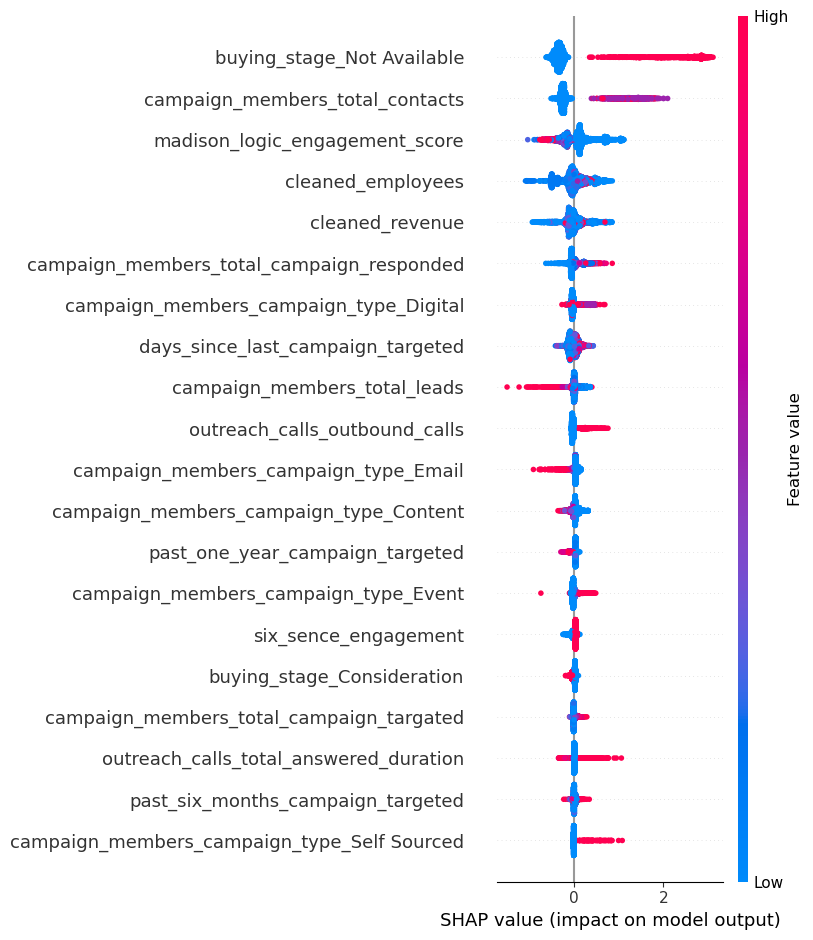

In [713]:
shap.summary_plot(xg_model_balanced_shap_values, X_test)

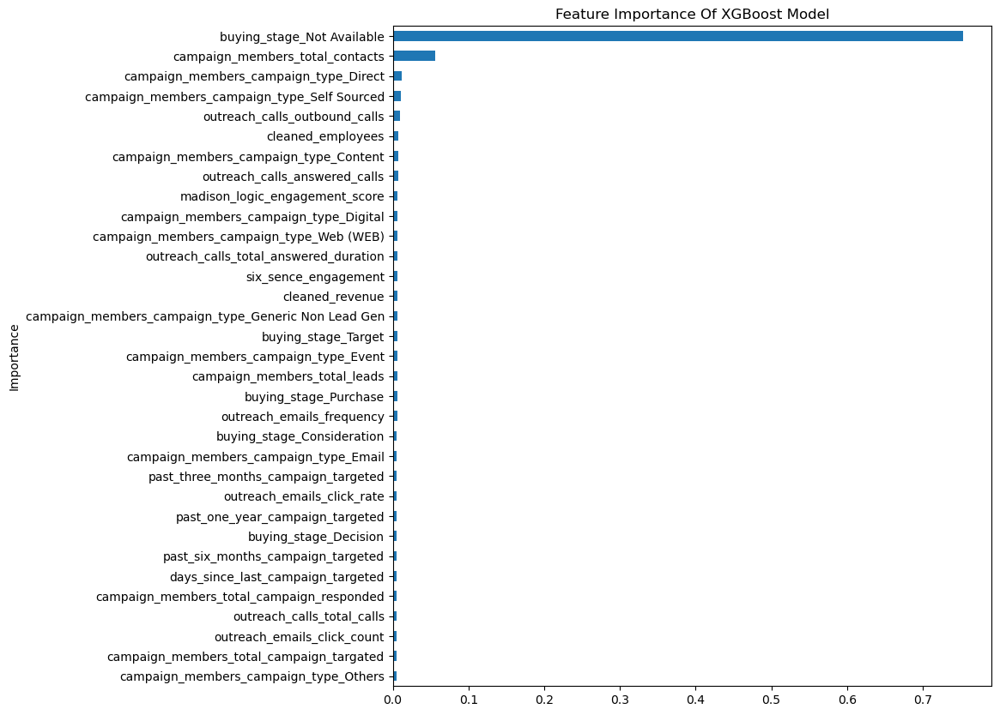

In [715]:
feature_importance = xg_model_balanced.get_booster().get_score(importance_type='gain')  # Use 'weight' or 'cover' as needed

# Normalize importance values
total_importance = sum(feature_importance.values())
normalized_importance = {k: v / total_importance for k, v in feature_importance.items()}

# Display normalized values
# print(normalized_importance)
importance_df = pd.DataFrame({
    'Feature': normalized_importance.keys(),
    'Importance': normalized_importance.values()
}).sort_values(by='Importance', ascending=True)

# plt.figure(figsize=(7,5))
importance_df.plot(kind='barh', x='Feature', y='Importance', legend=False,figsize=(9,10))
plt.title('Feature Importance Of XGBoost Model')
plt.ylabel('Importance')
plt.show()

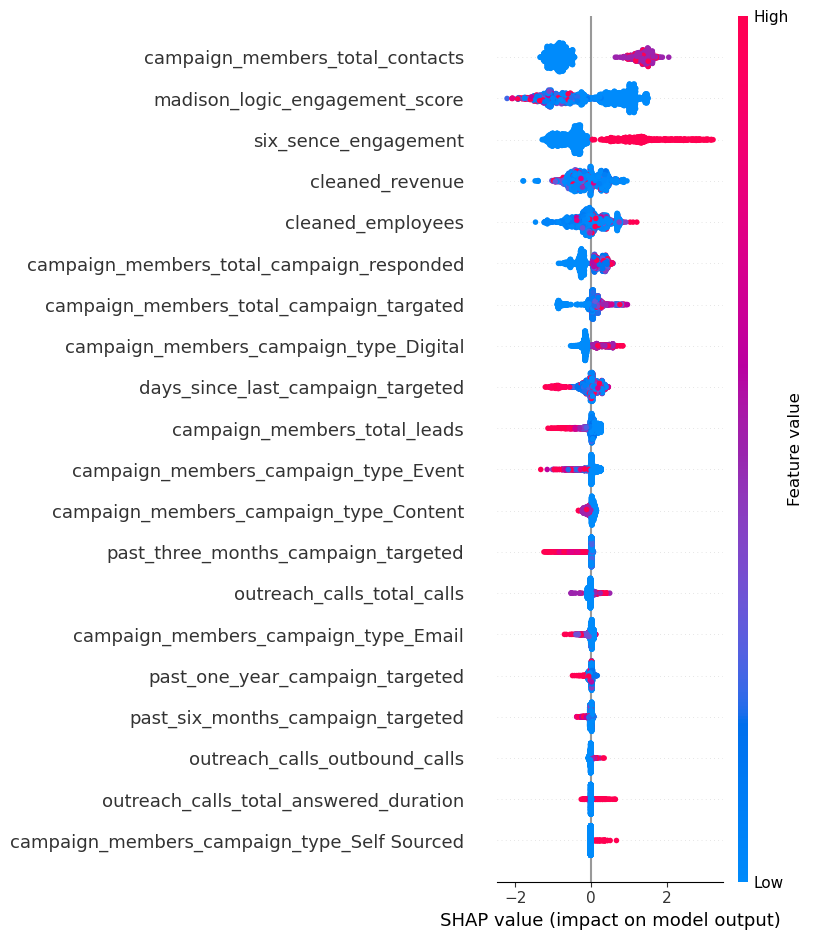

In [726]:
shap.summary_plot(xg_model_balanced_shap_values, X_test)

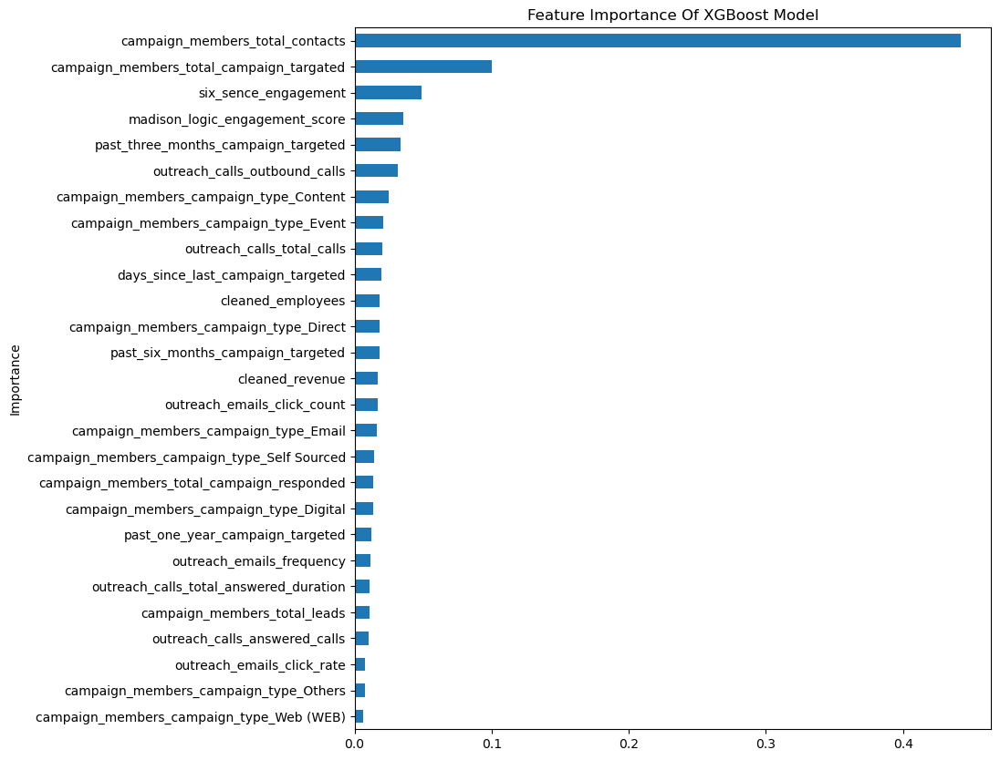

In [727]:
feature_importance = xg_model_balanced.get_booster().get_score(importance_type='gain')  # Use 'weight' or 'cover' as needed

# Normalize importance values
total_importance = sum(feature_importance.values())
normalized_importance = {k: v / total_importance for k, v in feature_importance.items()}

# Display normalized values
# print(normalized_importance)
importance_df = pd.DataFrame({
    'Feature': normalized_importance.keys(),
    'Importance': normalized_importance.values()
}).sort_values(by='Importance', ascending=True)

# plt.figure(figsize=(7,5))
importance_df.plot(kind='barh', x='Feature', y='Importance', legend=False,figsize=(9,10))
plt.title('Feature Importance Of XGBoost Model')
plt.ylabel('Importance')
plt.show()

## Model traning With only Six Sence Opportunity

In [728]:
final_accounts

,six_sence_engagement,madison_logic_engagement_score,converted,outreach_calls_total_calls,outreach_calls_outbound_calls,outreach_calls_inbound_calls,outreach_calls_answered_calls,outreach_calls_total_answered_duration,outreach_emails_frequency,outreach_emails_open_count,outreach_emails_click_count,outreach_emails_open_rate,outreach_emails_click_rate,outreach_emails_average_time_required_to_reply,cleaned_employees,cleaned_revenue,campaign_members_total_campaign_targated,campaign_members_total_campaign_responded,campaign_members_total_leads,campaign_members_total_contacts,campaign_members_campaign_type_Content,campaign_members_campaign_type_Digital,campaign_members_campaign_type_Event,campaign_members_campaign_type_Email,campaign_members_campaign_type_Web (WEB),campaign_members_campaign_type_Direct,campaign_members_campaign_type_Self Sourced,campaign_members_campaign_type_Generic Non Lead Gen,campaign_members_campaign_type_Others,days_since_last_campaign_targeted,past_three_months_campaign_targeted,past_six_months_campaign_targeted,past_one_year_campaign_targeted
104362,1,15.694000,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,175.0,2.699243e+04,3.0,1.0,4.0,0.0,1.0,0.0,0.0,2.0,0.0,0.0,0.0,0.0,0.0,131.0,0.0,2.0,2.0
115624,1,191.975327,0,3.0,3.0,0.0,3.0,133.0,0.0,0.0,0.0,0.0,0.0,0.0,350.0,3.000000e+08,2.0,2.0,1.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,40.0,1.0,2.0,2.0
111820,0,52.929934,0,1.0,1.0,0.0,1.0,304.0,0.0,0.0,0.0,0.0,0.0,0.0,750.0,1.000000e+09,10.0,7.0,8.0,0.0,2.0,1.0,5.0,2.0,0.0,0.0,0.0,0.0,0.0,75.0,3.0,4.0,6.0
24246,1,0.000000,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,450.0,3.000000e+08,1.0,1.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,517.0,0.0,0.0,0.0
89233,1,155.143000,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,9.0,4.953579e+05,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
104160,0,41.376000,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,125.0,1.928030e+04,2.0,1.0,3.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,77.0,1.0,1.0,1.0
110561,0,240.567331,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,120.0,3.000000e+07,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
48598,1,16.864000,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000e+00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
8054,0,28.512000,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,750.0,3.000000e+08,7.0,7.0,2.0,0.0,1.0,0.0,5.0,1.0,0.0,0.0,0.0,0.0,0.0,38.0,7.0,7.0,7.0


In [729]:
opp_accounts=final_accounts[final_accounts['converted']==1]

In [732]:
opp_accounts=opp_accounts.sort_values(by='six_sence_engagement',ascending=False)

In [735]:
opp_accounts[opp_accounts['six_sence_engagement']==1]

,six_sence_engagement,madison_logic_engagement_score,converted,outreach_calls_total_calls,outreach_calls_outbound_calls,outreach_calls_inbound_calls,outreach_calls_answered_calls,outreach_calls_total_answered_duration,outreach_emails_frequency,outreach_emails_open_count,outreach_emails_click_count,outreach_emails_open_rate,outreach_emails_click_rate,outreach_emails_average_time_required_to_reply,cleaned_employees,cleaned_revenue,campaign_members_total_campaign_targated,campaign_members_total_campaign_responded,campaign_members_total_leads,campaign_members_total_contacts,campaign_members_campaign_type_Content,campaign_members_campaign_type_Digital,campaign_members_campaign_type_Event,campaign_members_campaign_type_Email,campaign_members_campaign_type_Web (WEB),campaign_members_campaign_type_Direct,campaign_members_campaign_type_Self Sourced,campaign_members_campaign_type_Generic Non Lead Gen,campaign_members_campaign_type_Others,days_since_last_campaign_targeted,past_three_months_campaign_targeted,past_six_months_campaign_targeted,past_one_year_campaign_targeted
145246,1,1.632000,1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,110.0,3.000000e+07,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
65713,1,0.000000,1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,100.0,1.522101e+07,11.0,6.0,8.0,7.0,2.0,4.0,0.0,1.0,1.0,0.0,1.0,0.0,2.0,131.0,0.0,9.0,10.0
40575,1,0.000000,1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,750.0,1.000000e+09,22.0,15.0,24.0,14.0,2.0,5.0,7.0,3.0,1.0,0.0,1.0,0.0,3.0,40.0,2.0,4.0,10.0
95720,1,38.231207,1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,750.0,1.000000e+09,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
98584,1,0.000000,1,2.0,1.0,1.0,1.0,37.0,0.0,0.0,0.0,0.0,0.0,0.0,450.0,1.000000e+07,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
12918,1,4.724000,1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,150.0,3.000000e+07,4.0,3.0,3.0,3.0,1.0,0.0,0.0,1.0,0.0,1.0,1.0,0.0,0.0,82.0,1.0,2.0,3.0
55588,1,0.000000,1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,300.0,3.000000e+07,5.0,4.0,1.0,1.0,0.0,1.0,0.0,2.0,0.0,2.0,0.0,0.0,0.0,289.0,0.0,0.0,5.0
86558,1,0.000000,1,1.0,1.0,0.0,1.0,197.0,0.0,0.0,0.0,0.0,0.0,0.0,750.0,7.500000e+08,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
15385,1,0.000000,1,2.0,1.0,1.0,2.0,89.0,1.0,1.0,0.0,1.0,0.0,0.0,5500.0,1.000000e+09,8.0,4.0,5.0,2.0,0.0,0.0,7.0,1.0,0.0,0.0,0.0,0.0,0.0,151.0,0.0,1.0,3.0


In [736]:
opp_accounts

,six_sence_engagement,madison_logic_engagement_score,converted,outreach_calls_total_calls,outreach_calls_outbound_calls,outreach_calls_inbound_calls,outreach_calls_answered_calls,outreach_calls_total_answered_duration,outreach_emails_frequency,outreach_emails_open_count,outreach_emails_click_count,outreach_emails_open_rate,outreach_emails_click_rate,outreach_emails_average_time_required_to_reply,cleaned_employees,cleaned_revenue,campaign_members_total_campaign_targated,campaign_members_total_campaign_responded,campaign_members_total_leads,campaign_members_total_contacts,campaign_members_campaign_type_Content,campaign_members_campaign_type_Digital,campaign_members_campaign_type_Event,campaign_members_campaign_type_Email,campaign_members_campaign_type_Web (WEB),campaign_members_campaign_type_Direct,campaign_members_campaign_type_Self Sourced,campaign_members_campaign_type_Generic Non Lead Gen,campaign_members_campaign_type_Others,days_since_last_campaign_targeted,past_three_months_campaign_targeted,past_six_months_campaign_targeted,past_one_year_campaign_targeted
145246,1,1.632000,1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,110.0,3.000000e+07,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
65713,1,0.000000,1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,100.0,1.522101e+07,11.0,6.0,8.0,7.0,2.0,4.0,0.0,1.0,1.0,0.0,1.0,0.0,2.0,131.0,0.0,9.0,10.0
40575,1,0.000000,1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,750.0,1.000000e+09,22.0,15.0,24.0,14.0,2.0,5.0,7.0,3.0,1.0,0.0,1.0,0.0,3.0,40.0,2.0,4.0,10.0
95720,1,38.231207,1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,750.0,1.000000e+09,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
98584,1,0.000000,1,2.0,1.0,1.0,1.0,37.0,0.0,0.0,0.0,0.0,0.0,0.0,450.0,1.000000e+07,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
58448,0,0.000000,1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,5.000010e+05,2.0,2.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,569.0,0.0,0.0,0.0
50489,0,0.000000,1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,6.0,5.500001e+06,5.0,4.0,2.0,1.0,2.0,2.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,137.0,0.0,2.0,2.0
18781,0,0.000000,1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,16.0,5.500001e+06,1.0,1.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,46.0,1.0,1.0,1.0
135327,0,0.000000,1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000e+00,1.0,1.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,157.0,0.0,1.0,1.0


In [737]:
temp_opp_accounts=opp_accounts.head(1800)

In [738]:
tal_accounts=final_accounts[final_accounts['converted']==0]

In [739]:
tal_accounts

,six_sence_engagement,madison_logic_engagement_score,converted,outreach_calls_total_calls,outreach_calls_outbound_calls,outreach_calls_inbound_calls,outreach_calls_answered_calls,outreach_calls_total_answered_duration,outreach_emails_frequency,outreach_emails_open_count,outreach_emails_click_count,outreach_emails_open_rate,outreach_emails_click_rate,outreach_emails_average_time_required_to_reply,cleaned_employees,cleaned_revenue,campaign_members_total_campaign_targated,campaign_members_total_campaign_responded,campaign_members_total_leads,campaign_members_total_contacts,campaign_members_campaign_type_Content,campaign_members_campaign_type_Digital,campaign_members_campaign_type_Event,campaign_members_campaign_type_Email,campaign_members_campaign_type_Web (WEB),campaign_members_campaign_type_Direct,campaign_members_campaign_type_Self Sourced,campaign_members_campaign_type_Generic Non Lead Gen,campaign_members_campaign_type_Others,days_since_last_campaign_targeted,past_three_months_campaign_targeted,past_six_months_campaign_targeted,past_one_year_campaign_targeted
104362,1,15.694000,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,175.0,2.699243e+04,3.0,1.0,4.0,0.0,1.0,0.0,0.0,2.0,0.0,0.0,0.0,0.0,0.0,131.0,0.0,2.0,2.0
115624,1,191.975327,0,3.0,3.0,0.0,3.0,133.0,0.0,0.0,0.0,0.0,0.0,0.0,350.0,3.000000e+08,2.0,2.0,1.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,40.0,1.0,2.0,2.0
111820,0,52.929934,0,1.0,1.0,0.0,1.0,304.0,0.0,0.0,0.0,0.0,0.0,0.0,750.0,1.000000e+09,10.0,7.0,8.0,0.0,2.0,1.0,5.0,2.0,0.0,0.0,0.0,0.0,0.0,75.0,3.0,4.0,6.0
24246,1,0.000000,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,450.0,3.000000e+08,1.0,1.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,517.0,0.0,0.0,0.0
89233,1,155.143000,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,9.0,4.953579e+05,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
104160,0,41.376000,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,125.0,1.928030e+04,2.0,1.0,3.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,77.0,1.0,1.0,1.0
110561,0,240.567331,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,120.0,3.000000e+07,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
48598,1,16.864000,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000e+00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
8054,0,28.512000,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,750.0,3.000000e+08,7.0,7.0,2.0,0.0,1.0,0.0,5.0,1.0,0.0,0.0,0.0,0.0,0.0,38.0,7.0,7.0,7.0


In [740]:
temp_accounts=pd.concat([temp_opp_accounts,tal_accounts])

In [741]:
temp_accounts

,six_sence_engagement,madison_logic_engagement_score,converted,outreach_calls_total_calls,outreach_calls_outbound_calls,outreach_calls_inbound_calls,outreach_calls_answered_calls,outreach_calls_total_answered_duration,outreach_emails_frequency,outreach_emails_open_count,outreach_emails_click_count,outreach_emails_open_rate,outreach_emails_click_rate,outreach_emails_average_time_required_to_reply,cleaned_employees,cleaned_revenue,campaign_members_total_campaign_targated,campaign_members_total_campaign_responded,campaign_members_total_leads,campaign_members_total_contacts,campaign_members_campaign_type_Content,campaign_members_campaign_type_Digital,campaign_members_campaign_type_Event,campaign_members_campaign_type_Email,campaign_members_campaign_type_Web (WEB),campaign_members_campaign_type_Direct,campaign_members_campaign_type_Self Sourced,campaign_members_campaign_type_Generic Non Lead Gen,campaign_members_campaign_type_Others,days_since_last_campaign_targeted,past_three_months_campaign_targeted,past_six_months_campaign_targeted,past_one_year_campaign_targeted
145246,1,1.632000,1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,110.0,3.000000e+07,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
65713,1,0.000000,1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,100.0,1.522101e+07,11.0,6.0,8.0,7.0,2.0,4.0,0.0,1.0,1.0,0.0,1.0,0.0,2.0,131.0,0.0,9.0,10.0
40575,1,0.000000,1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,750.0,1.000000e+09,22.0,15.0,24.0,14.0,2.0,5.0,7.0,3.0,1.0,0.0,1.0,0.0,3.0,40.0,2.0,4.0,10.0
95720,1,38.231207,1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,750.0,1.000000e+09,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
98584,1,0.000000,1,2.0,1.0,1.0,1.0,37.0,0.0,0.0,0.0,0.0,0.0,0.0,450.0,1.000000e+07,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
104160,0,41.376000,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,125.0,1.928030e+04,2.0,1.0,3.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,77.0,1.0,1.0,1.0
110561,0,240.567331,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,120.0,3.000000e+07,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
48598,1,16.864000,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000e+00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
8054,0,28.512000,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,750.0,3.000000e+08,7.0,7.0,2.0,0.0,1.0,0.0,5.0,1.0,0.0,0.0,0.0,0.0,0.0,38.0,7.0,7.0,7.0


In [742]:
X_train,X_test,y_train,y_test=train_test_split(temp_accounts.drop(columns=['converted']),temp_accounts.converted,test_size=0.2,random_state=42,stratify=temp_accounts['converted'])

In [743]:
xg_model_balanced=XGBClassifier(colsample_bytre= 0.7156555173390283, 
gamma= 0.005116928204378757,
learning_rate= 0.016647860663356464,
max_depth=7, 
n_estimators= 385,
scale_pos_weight= 2.1035505655787547,
subsample=0.771846614371039)

In [744]:
xg_model_balanced.fit(X_train,y_train)

C:\Users\Admin\anaconda3\Lib\site-packages\xgboost\core.py:158: UserWarning: [15:00:44] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0c55ff5f71b100e98-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "colsample_bytre" } are not used.



XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytre=0.7156555173390283, colsample_bytree=None,
              device=None, early_stopping_rounds=None, enable_categorical=False,
              eval_metric=None, feature_types=None, gamma=0.005116928204378757,
              grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=0.016647860663356464,
              max_bin=None, max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=7, max_leaves=None,
              min_child_weight=None, missing=nan, monotone_constraints=None,
              multi_strategy=None, n_estimators=385, n_jobs=None,
              num_parallel_tree=None, ...)

In [746]:
y_pred=xg_model_balanced.predict(X_test)

In [747]:
accuracy_score(y_test,y_pred)

0.9147982062780269

In [749]:
f1_score(y_test,y_pred)

0.47222222222222215

In [750]:
confusion_matrix(y_test,y_pred)

array([[3128,   80],
       [ 224,  136]], dtype=int64)

In [751]:
y_test.value_counts()

converted
0    3208
1     360
Name: count, dtype: int64

In [752]:
print(classification_report(y_test,y_pred))

              precision    recall  f1-score   support

           0       0.93      0.98      0.95      3208
           1       0.63      0.38      0.47       360

    accuracy                           0.91      3568
   macro avg       0.78      0.68      0.71      3568
weighted avg       0.90      0.91      0.91      3568



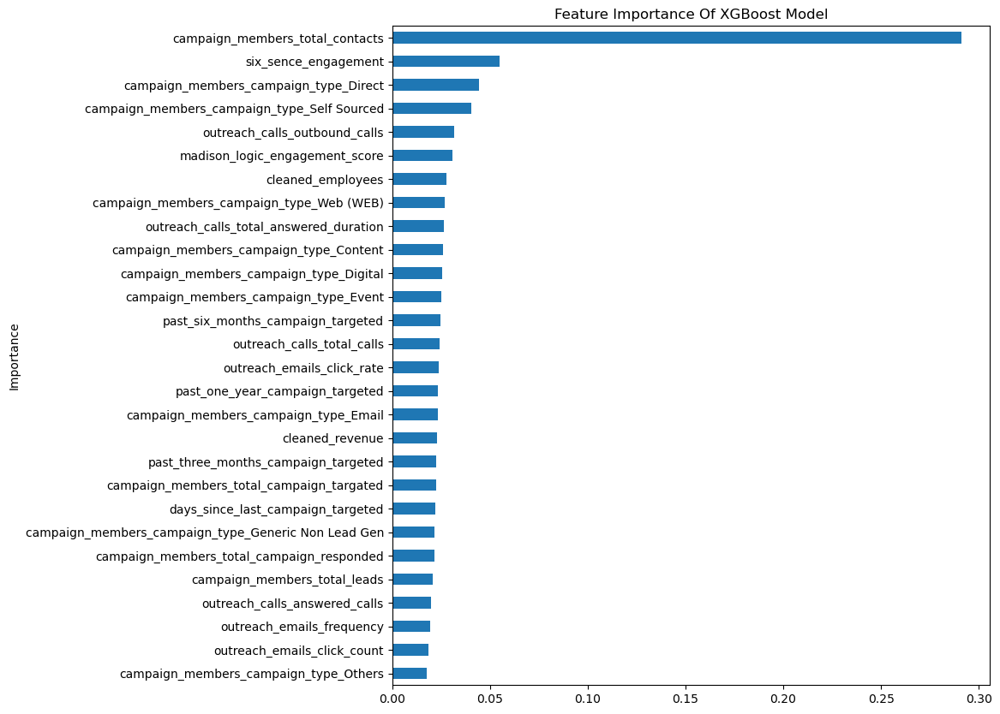

In [753]:
feature_importance = xg_model_balanced.get_booster().get_score(importance_type='gain')  # Use 'weight' or 'cover' as needed

# Normalize importance values
total_importance = sum(feature_importance.values())
normalized_importance = {k: v / total_importance for k, v in feature_importance.items()}

# Display normalized values
# print(normalized_importance)
importance_df = pd.DataFrame({
    'Feature': normalized_importance.keys(),
    'Importance': normalized_importance.values()
}).sort_values(by='Importance', ascending=True)

# plt.figure(figsize=(7,5))
importance_df.plot(kind='barh', x='Feature', y='Importance', legend=False,figsize=(9,10))
plt.title('Feature Importance Of XGBoost Model')
plt.ylabel('Importance')
plt.show()

In [754]:
xg_model_balanced_explainer=shap.Explainer(xg_model_balanced,X_train)

In [755]:
xg_model_balanced_shap_values = xg_model_balanced_explainer(X_test)

 99%|===================| 3521/3568 [01:23<00:01]        

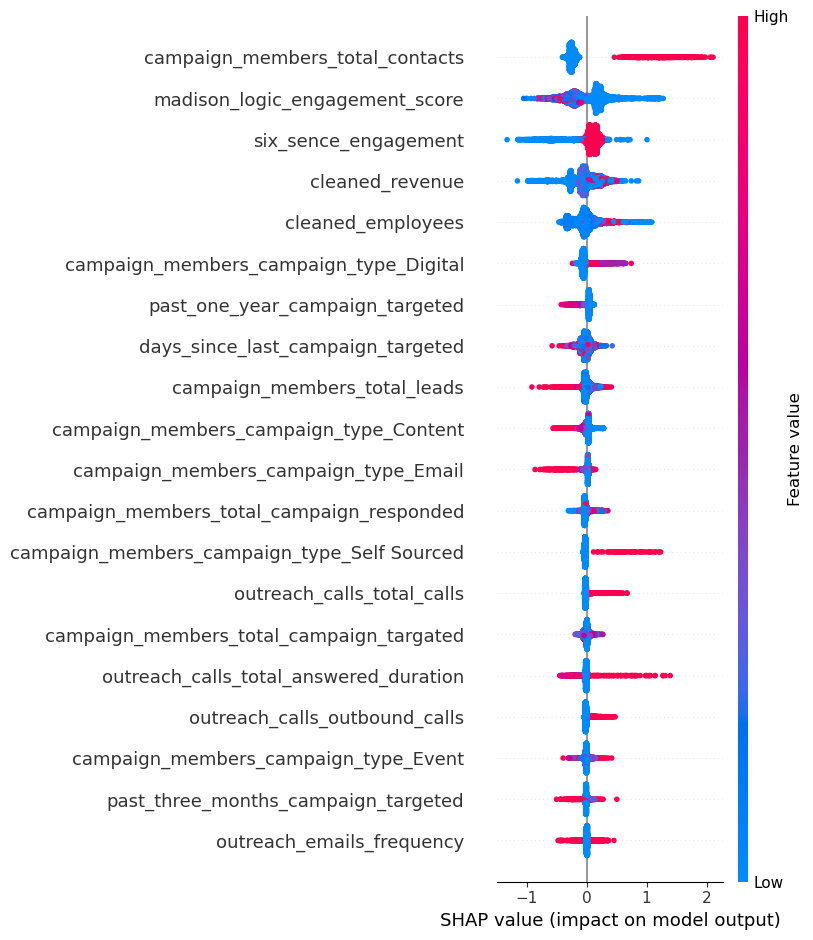

In [756]:
shap.summary_plot(xg_model_balanced_shap_values, X_test)

In [759]:
opp_accounts[(opp_accounts['six_sence_engagement']==0) & (opp_accounts['madison_logic_engagement_score']==0)]

,six_sence_engagement,madison_logic_engagement_score,converted,outreach_calls_total_calls,outreach_calls_outbound_calls,outreach_calls_inbound_calls,outreach_calls_answered_calls,outreach_calls_total_answered_duration,outreach_emails_frequency,outreach_emails_open_count,outreach_emails_click_count,outreach_emails_open_rate,outreach_emails_click_rate,outreach_emails_average_time_required_to_reply,cleaned_employees,cleaned_revenue,campaign_members_total_campaign_targated,campaign_members_total_campaign_responded,campaign_members_total_leads,campaign_members_total_contacts,campaign_members_campaign_type_Content,campaign_members_campaign_type_Digital,campaign_members_campaign_type_Event,campaign_members_campaign_type_Email,campaign_members_campaign_type_Web (WEB),campaign_members_campaign_type_Direct,campaign_members_campaign_type_Self Sourced,campaign_members_campaign_type_Generic Non Lead Gen,campaign_members_campaign_type_Others,days_since_last_campaign_targeted,past_three_months_campaign_targeted,past_six_months_campaign_targeted,past_one_year_campaign_targeted
85366,0,0.0,1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,10001.0,5.000010e+05,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
40103,0,0.0,1,1.0,1.0,0.0,1.0,48.0,0.0,0.0,0.0,0.0,0.0,0.0,10000.0,1.000000e+09,8.0,4.0,4.0,1.0,1.0,0.0,4.0,2.0,0.0,0.0,1.0,0.0,0.0,48.0,4.0,4.0,4.0
102545,0,0.0,1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,5.0,5.000010e+05,2.0,1.0,1.0,0.0,2.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,389.0,0.0,0.0,0.0
80008,0,0.0,1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,8.0,5.000010e+05,1.0,1.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,64.0,1.0,1.0,1.0
22977,0,0.0,1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,25.0,0.000000e+00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
58448,0,0.0,1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,5.000010e+05,2.0,2.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,569.0,0.0,0.0,0.0
50489,0,0.0,1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,6.0,5.500001e+06,5.0,4.0,2.0,1.0,2.0,2.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,137.0,0.0,2.0,2.0
18781,0,0.0,1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,16.0,5.500001e+06,1.0,1.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,46.0,1.0,1.0,1.0
135327,0,0.0,1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000e+00,1.0,1.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,157.0,0.0,1.0,1.0


In [760]:
opp_accounts.shape

(4924, 33)